# Human Resoursec Project

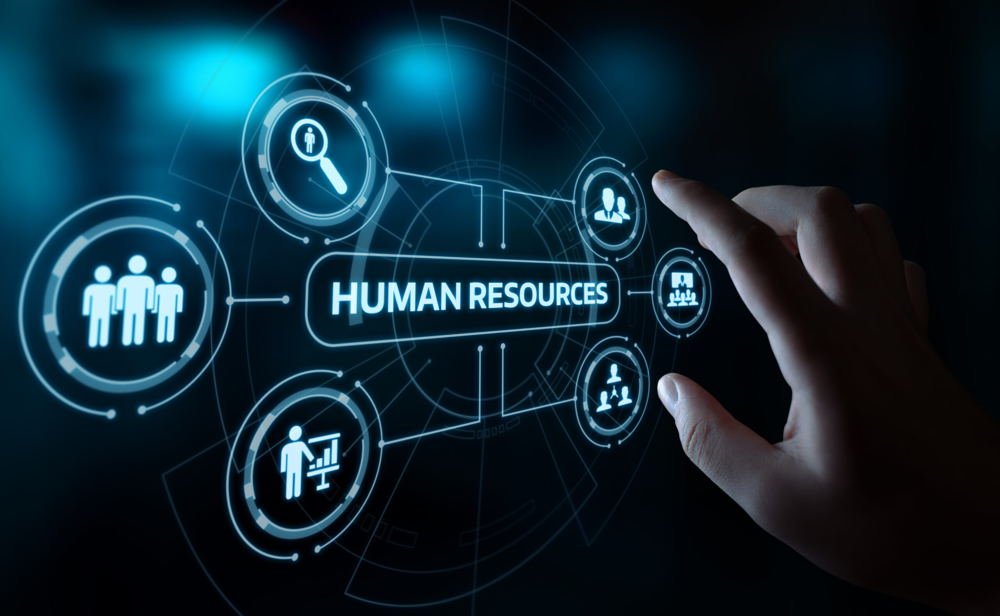

# Introduction: 

     for successfully running the business it is important to reasonably control a lot of resources, including human resources. In the real world, employee attrition might occur due to various and sometimes unexpected reasons and it may create problems for the business. In order to prevent such cases and to optimise and ease the work of HR processes in the companies we have started working on that projects

    In this project, we decided to work with the dataset containing various details of each individual empolyee including his proffesional and personal information as well as his attitude, position, salary and etc.. at the workplace.


# Objectives: 

    Our goals:

    1. To develop a ML model that predicts the attrition status

    2. To develop a DL model that predicts the attrition status

    3. To find insights into the patterns between work-life balance, attitude, perosnal and many more factors and how it affects the attrition rates.


# Description:  

    1. Type of problem: classification.

    2. Variables: 26 Numerical, 8 Categorical:          

    3. Target: Attrition (object):

        1. Attrition: whether the employee got attrition or not

    4. Steps we made

        1. Train / Test split:

            > Train - 70%

            > Test - 30%

        2. Imputation of Nan values:

            > Numerical - MeanMedianImputer

            > Categorical - FrequentCategory

        3. Categorical variables Encoding:

            > OneHotEncoder - ('BusinessTravel', 'Gender', 'MaritalStatus', 'Over18', 'OverTime')

            > count_frequency_encoder - (other variables)

        4. Discretization:

            > EqualFrequencyDiscretiser

        5. Scaling:

            > RobustScaler

        6. Feature Selection:

            1. Filtering methods:

                > Constant variables

                > Quasi-Constant variables

                > Duplicated variables

                > Correleted variables

            2. Wrapper methods:

                > RFE (based on RandomForestClassifier)

        7. Balancing dataset:

            > RandomOverSampler

            > RandomUnderSampler

            > SMOTE

        8. Training Classification Algorithms

        9. Fine-tuning hyperparameters:

            > GridSearchCV

        10. Training ANN

        11. Model evaluation and result analysis

    
    
    5. Deep Learning Algorithms we used:

        For predicting the pollution rate for the next hour:

            1. LSTM (Long-Short-Term Memory) with 2 hidden layers (100 neurons each).

            2. LSTM with 4 hidden layers (100 neurons each) + 3 Dropout layers (0.3)

            
        For predicting the pollution rate for the next hour:

            1. LSTM (Long-Short term memory) with 2 hidden layers (100 neurons each) + 2 Dropout layers (0.6, 0.5)

     
    6. Evaluation Metrix we used:

        1. Mean Absolute Error(MAE)

        2. Mean Square Error(MSE)

        3. Root Mean Square Error(RMSE)

        4. R2 score

# STEP 0: Importing libraries

In [1]:
#for loading & for linear algebra
import pandas as pd
import numpy as np

#for data visualization
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px
import seaborn as sns
import scipy.stats as stats
from scipy.stats import chi2_contingency 
from plotly.offline import init_notebook_mode
from mlens.visualization import corrmat

import plotly.figure_factory as ff
from statistics import stdev
from wordcloud import WordCloud
init_notebook_mode(connected=True)
sns.set_context("notebook")

#for spliting data set
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict

#for missing values imputation
import sys
from sklearn.datasets import fetch_california_housing
from sklearn.metrics import mean_squared_error
from sklearn.datasets import fetch_california_housing
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import mean_squared_error
from sklearn.impute import SimpleImputer, KNNImputer
#from impyute.imputation.cs import fast_knn
#from impyute.imputation.cs import mice
from feature_engine.imputation import RandomSampleImputer, MeanMedianImputer, ArbitraryNumberImputer,EndTailImputer, CategoricalImputer
from feature_engine.discretisation import EqualFrequencyDiscretiser, EqualWidthDiscretiser
from math import sqrt
import random
import numpy as np
random.seed(0)

#for feature engineering
from sklearn.feature_extraction.text import CountVectorizer
from feature_engine.encoding import OneHotEncoder, CountFrequencyEncoder
from feature_engine.discretisation import DecisionTreeDiscretiser

#for feature selection
from feature_engine.selection import DropConstantFeatures, DropDuplicateFeatures, SmartCorrelatedSelection
from sklearn.feature_selection import SelectFromModel
from sklearn.feature_selection import RFECV, RFE


#for balancing the dataset
from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.under_sampling import RandomUnderSampler

#for feature magnitude
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler

#for ML models: Classification
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB

#for Super Learner
from mlens.ensemble import SuperLearner

#for Pipelines and Column Tranformers
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.compose import ColumnTransformer, make_column_selector

#for hyperparametres tuning
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

#libraries for Deep Learning
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, LearningRateScheduler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout


#for matrixes for evaluating models
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import classification_report
from sklearn.metrics import precision_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

from jupyterthemes import jtplot
jtplot.style()

[MLENS] backend: threading


# Step 1: Data Analysis

## 1.1 Importing dataset

In [2]:
df = pd.read_csv('Human_Resources_TP.csv')
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102.0,Sales,1.0,2.0,Life Sciences,1.0,1.0,...,1.0,80.0,0.0,8.0,0.0,1.0,6.0,4.0,0.0,5.0
1,49,No,Travel_Frequently,279.0,Research & Development,8.0,1.0,Life Sciences,1.0,2.0,...,4.0,80.0,1.0,10.0,3.0,3.0,10.0,7.0,1.0,7.0
2,37,Yes,Travel_Rarely,1373.0,Research & Development,2.0,2.0,Other,1.0,4.0,...,2.0,80.0,0.0,7.0,3.0,3.0,0.0,0.0,0.0,0.0
3,33,No,Travel_Frequently,1392.0,Research & Development,3.0,4.0,Life Sciences,1.0,5.0,...,3.0,80.0,0.0,8.0,3.0,3.0,8.0,7.0,3.0,0.0
4,27,No,Travel_Rarely,591.0,Research & Development,2.0,1.0,Medical,1.0,7.0,...,4.0,80.0,1.0,6.0,3.0,3.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884.0,Research & Development,23.0,2.0,Medical,1.0,2061.0,...,3.0,80.0,1.0,17.0,3.0,3.0,5.0,2.0,0.0,3.0
1466,39,No,Travel_Rarely,613.0,Research & Development,6.0,1.0,Medical,1.0,2062.0,...,1.0,80.0,1.0,9.0,5.0,3.0,7.0,7.0,1.0,7.0
1467,27,No,Travel_Rarely,155.0,Research & Development,4.0,3.0,Life Sciences,1.0,2064.0,...,2.0,80.0,1.0,6.0,0.0,3.0,6.0,2.0,0.0,3.0
1468,49,No,Travel_Frequently,1023.0,Sales,2.0,3.0,Medical,1.0,2065.0,...,4.0,80.0,0.0,17.0,3.0,2.0,9.0,6.0,0.0,8.0


## 1.2 Data visualisation

In [3]:
df.info

<bound method DataFrame.info of       Age Attrition     BusinessTravel  DailyRate              Department  \
0      41       Yes      Travel_Rarely     1102.0                   Sales   
1      49        No  Travel_Frequently      279.0  Research & Development   
2      37       Yes      Travel_Rarely     1373.0  Research & Development   
3      33        No  Travel_Frequently     1392.0  Research & Development   
4      27        No      Travel_Rarely      591.0  Research & Development   
...   ...       ...                ...        ...                     ...   
1465   36        No  Travel_Frequently      884.0  Research & Development   
1466   39        No      Travel_Rarely      613.0  Research & Development   
1467   27        No      Travel_Rarely      155.0  Research & Development   
1468   49        No  Travel_Frequently     1023.0                   Sales   
1469   34        No      Travel_Rarely      628.0  Research & Development   

      DistanceFromHome  Education Education

In [4]:
print(df.shape)
print(df.duplicated().sum())

table = pd.DataFrame({
    'Unique' : df.nunique(),
    'Null' : df.isna().sum(),
    'NullPercent' : df.isna().sum() / len(df),
    'Type' : df.dtypes.values
})
display(table)

(1470, 35)
0


,Unique,Null,NullPercent,Type
Age,43,0,0.000000,int64
Attrition,2,0,0.000000,object
BusinessTravel,3,8,0.005442,object
DailyRate,878,15,0.010204,float64
Department,3,24,0.016327,object
DistanceFromHome,29,10,0.006803,float64
Education,5,10,0.006803,float64
EducationField,6,19,0.012925,object
EmployeeCount,1,10,0.006803,float64
EmployeeNumber,1458,12,0.008163,float64


In [5]:
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1455.000000,1460.000000,1460.000000,1460.0,1458.000000,1457.000000,1463.000000,1456.000000,1457.000000,...,1460.000000,1459.0,1458.000000,1449.000000,1458.000000,1455.000000,1451.000000,1458.000000,1455.000000,1467.000000
mean,36.923810,800.989691,9.182192,2.913699,1.0,1029.981481,2.720659,65.897471,2.729396,2.062457,...,2.710959,80.0,0.794925,11.259489,2.802469,2.760825,6.994487,4.216049,2.177320,4.117246
std,9.135373,403.300488,8.098754,1.025088,0.0,600.366246,1.092340,20.357419,0.712858,1.106088,...,1.080713,0.0,0.852821,7.784584,1.288541,0.707966,6.109685,3.618088,3.207652,3.560032
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,...,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,498.250000,2.000000,48.000000,2.000000,1.000000,...,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,799.000000,7.000000,3.000000,1.0,1026.500000,3.000000,66.000000,3.000000,2.000000,...,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1559.500000,4.000000,84.000000,3.000000,3.000000,...,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,...,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


In [6]:
df['StandardHours'].unique()

array([80., nan])

In [7]:
num = df.select_dtypes(exclude = 'O')
num

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1102.0,1.0,2.0,1.0,1.0,2.0,94.0,3.0,2.0,...,1.0,80.0,0.0,8.0,0.0,1.0,6.0,4.0,0.0,5.0
1,49,279.0,8.0,1.0,1.0,2.0,3.0,61.0,2.0,2.0,...,4.0,80.0,1.0,10.0,3.0,3.0,10.0,7.0,1.0,7.0
2,37,1373.0,2.0,2.0,1.0,4.0,4.0,92.0,2.0,1.0,...,2.0,80.0,0.0,7.0,3.0,3.0,0.0,0.0,0.0,0.0
3,33,1392.0,3.0,4.0,1.0,5.0,4.0,56.0,3.0,1.0,...,3.0,80.0,0.0,8.0,3.0,3.0,8.0,7.0,3.0,0.0
4,27,591.0,2.0,1.0,1.0,7.0,1.0,40.0,3.0,1.0,...,4.0,80.0,1.0,6.0,3.0,3.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,884.0,23.0,2.0,1.0,2061.0,3.0,41.0,4.0,2.0,...,3.0,80.0,1.0,17.0,3.0,3.0,5.0,2.0,0.0,3.0
1466,39,613.0,6.0,1.0,1.0,2062.0,4.0,42.0,2.0,3.0,...,1.0,80.0,1.0,9.0,5.0,3.0,7.0,7.0,1.0,7.0
1467,27,155.0,4.0,3.0,1.0,2064.0,2.0,87.0,4.0,2.0,...,2.0,80.0,1.0,6.0,0.0,3.0,6.0,2.0,0.0,3.0
1468,49,1023.0,2.0,3.0,1.0,2065.0,4.0,63.0,2.0,2.0,...,4.0,80.0,0.0,17.0,3.0,2.0,9.0,6.0,0.0,8.0


In [8]:
cat = df.select_dtypes(include = 'O')
cat

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime
0,Yes,Travel_Rarely,Sales,Life Sciences,Female,Sales Executive,Single,Y,Yes
1,No,Travel_Frequently,Research & Development,Life Sciences,Male,Research Scientist,Married,Y,No
2,Yes,Travel_Rarely,Research & Development,Other,Male,Laboratory Technician,Single,Y,Yes
3,No,Travel_Frequently,Research & Development,Life Sciences,Female,Research Scientist,Married,Y,Yes
4,No,Travel_Rarely,Research & Development,Medical,Male,Laboratory Technician,Married,Y,No
...,...,...,...,...,...,...,...,...,...
1465,No,Travel_Frequently,Research & Development,Medical,Male,Laboratory Technician,Married,Y,No
1466,No,Travel_Rarely,Research & Development,Medical,Male,Healthcare Representative,Married,Y,No
1467,No,Travel_Rarely,Research & Development,Life Sciences,Male,Manufacturing Director,Married,Y,Yes
1468,No,Travel_Frequently,Sales,Medical,Male,Sales Executive,Married,Y,No


In [9]:
print(df.shape)
print(num.shape)
print(cat.shape)

(1470, 35)
(1470, 26)
(1470, 9)


    There are 26 numerical and 9 categorical types of variables

C:\Users\Kim Stanislav\AppData\Local\Temp\ipykernel_14780\3829767072.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



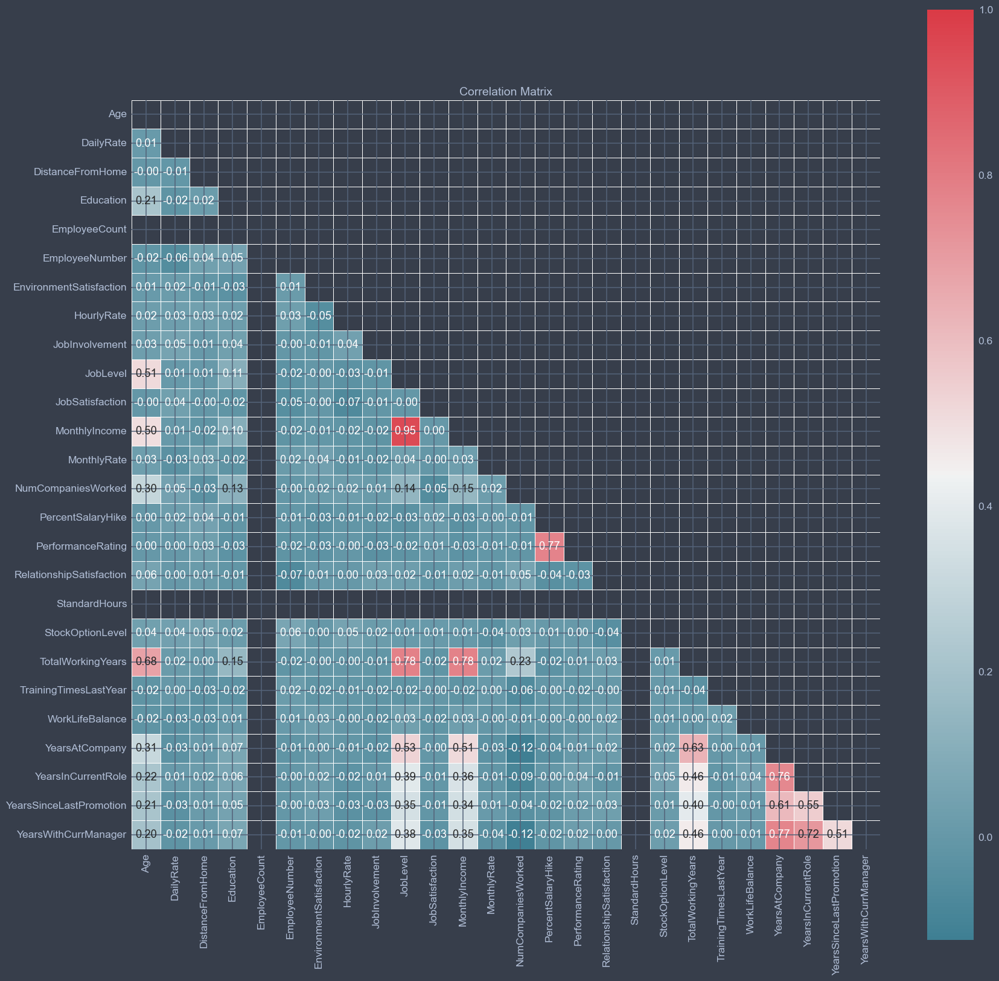

<Axes: title={'center': 'Correlation Matrix'}>

In [10]:
corrmat(df.corr(), figsize = (20, 20), inflate = False)

In [11]:
high_corr_features = []

corr_table = df.drop('Attrition', axis = 1).corr()
for i in corr_table.columns:
    values = corr_table[i].values
    for j in values:
        if (j >= 0.5) and (j < 1):
            high_corr_features.append(i)
            high_corr_features.append(corr_table.index[corr_table[i] == j][0])
            
high_corr_features = set(high_corr_features)
high_corr_features

C:\Users\Kim Stanislav\AppData\Local\Temp\ipykernel_14780\1365824995.py:3: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



{'Age',
 'JobLevel',
 'MonthlyIncome',
 'PercentSalaryHike',
 'PerformanceRating',
 'TotalWorkingYears',
 'YearsAtCompany',
 'YearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager'}

    There are 10 independent variables which are highly correlated

C:\Users\Kim Stanislav\AppData\Local\Temp\ipykernel_14780\821260522.py:3: FutureWarning:

Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.



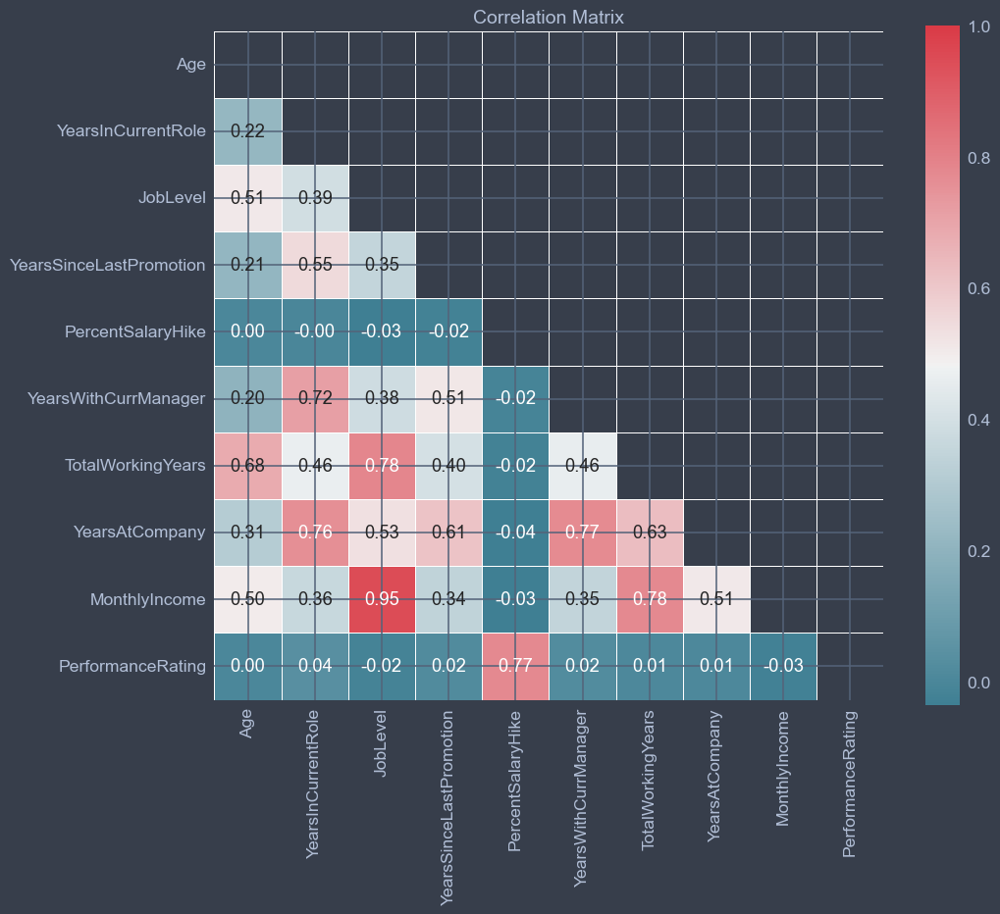

<Axes: title={'center': 'Correlation Matrix'}>

In [12]:
# strong correlation between columns
columns = high_corr_features
corrmat(df[columns].corr(), inflate = False)

    We can see that there are some interesting correlations:
        1. The older the employee the more working years he has.
        2. Years spend at company and total working years are highly correlated which means that people tend to work a lot in one place.
        3. The higher the total working years, the higher the job level and vice versa.
        4. The higher the total working years, the higher the monthly income.
        5. It seems that employee spend most of their working years at company in one role.
        6. It seems that the amount of years working in one role highly correlated with the current manager.
        7. It seems that the job level and the monthly income has a correlation with years at company.
        8. The years spend with current manager highly correlated with total years at company.
        9. Monthly income highly correlated with job level.

## Exploring NaN values

In [13]:
def find_NaN(df):
    vars_with_na = [var for var in df.columns if df[var].isnull().sum() > 1]
    data_na = df[vars_with_na].isnull().sum()
    data_na = pd.DataFrame(data_na.reset_index())
    data_na.columns = ['variable', 'na_amount']
    data_na.sort_values(by = 'na_amount', ascending = False, inplace = True)
    data_na.insert(2, 'na_percentage', [var for var in df[data_na.variable].isnull().mean()], True)
    data_na['variable_type'] = [var for var in df[data_na.variable].dtypes]
    return data_na.reset_index().drop('index', axis = 1)

In [14]:
data_na = find_NaN(df)
data_na

,variable,na_amount,na_percentage,variable_type
0,JobRole,30,0.020408,object
1,MonthlyIncome,27,0.018367,float64
2,Department,24,0.016327,object
3,MonthlyRate,22,0.014966,float64
4,TotalWorkingYears,21,0.014286,float64
5,OverTime,21,0.014286,object
6,MaritalStatus,21,0.014286,object
7,EducationField,19,0.012925,object
8,YearsAtCompany,19,0.012925,float64
9,Gender,16,0.010884,object


## Visualizing NaN values

In [15]:
def plot_na(df):
    fig, ax = plt.subplots(figsize = (12, 4))
    plt.xticks(df.index, df['variable'], rotation = 75)
    ax.axhline(y = 0.45, color = 'red')
    ax.bar(df.index, df['na_percentage'])
    ax.set_ylabel('percentage of NaN values')
    plt.show()

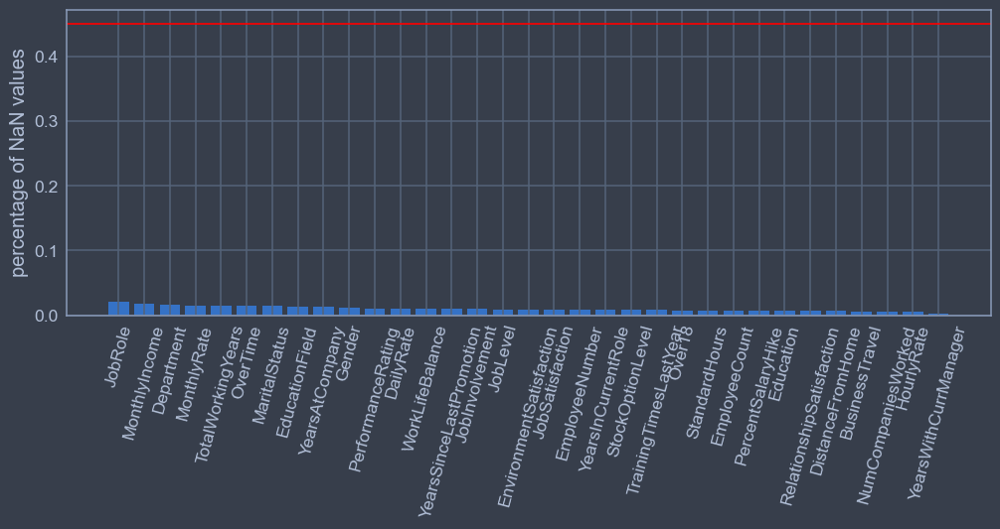

In [16]:
plot_na(data_na)

    We can see that the amount of Null data in the dataset is low and each variable contains less than 1% of null data.

## Exploring feature distribution

In [17]:
def diagnostic_plots(df, variable):
    plt.figure(figsize = (12, 5))
    plt.suptitle(variable)
    
    #histogramma
    plt.subplot(1, 3, 1)
    df[variable].hist(bins = 30, color = 'mediumseagreen')
    plt.title('histogramm')
    
    #Q-Q plot
    plt.subplot(1, 3, 2)
    stats.probplot(df[variable], dist = 'norm', plot = plt)
    plt.title('Q-Q plot')
    
    #boxplot
    plt.subplot(1, 3, 3)
    sns.boxplot(y = df[variable], color = 'violet')
    plt.title('boxplot')
    
    plt.show()

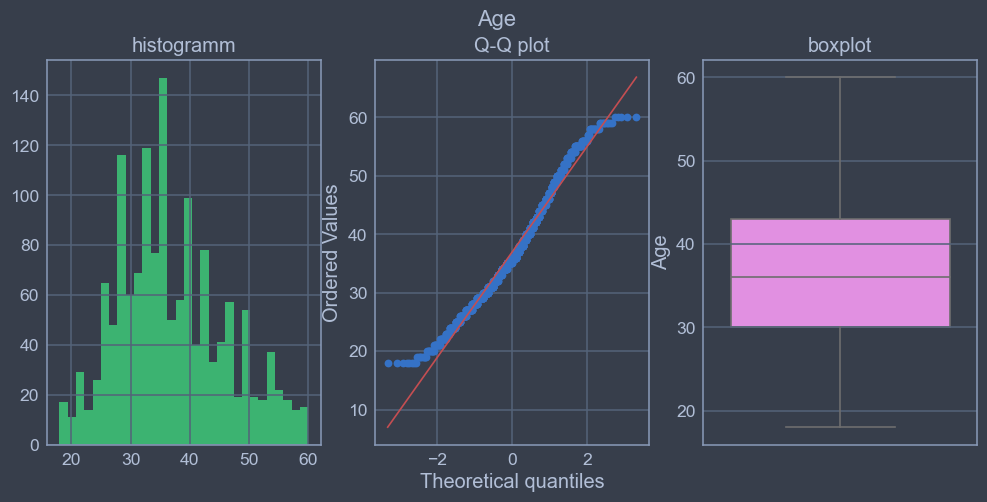

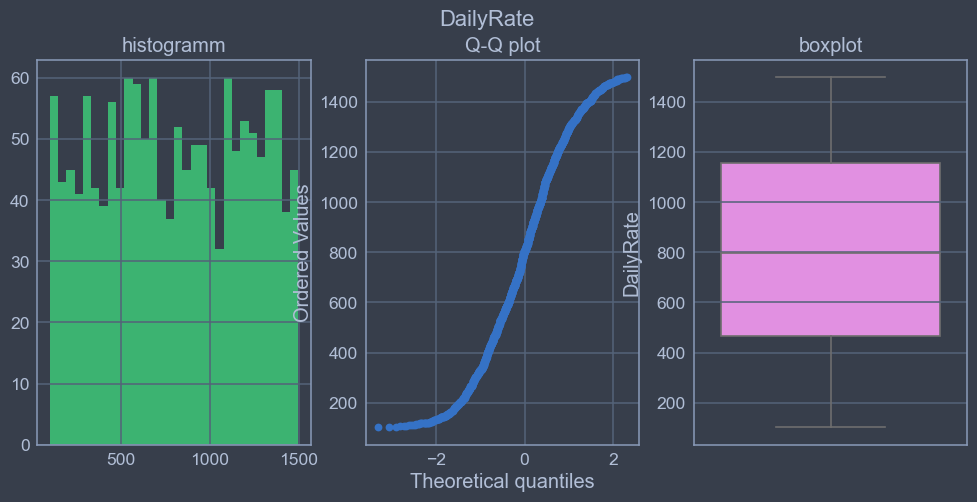

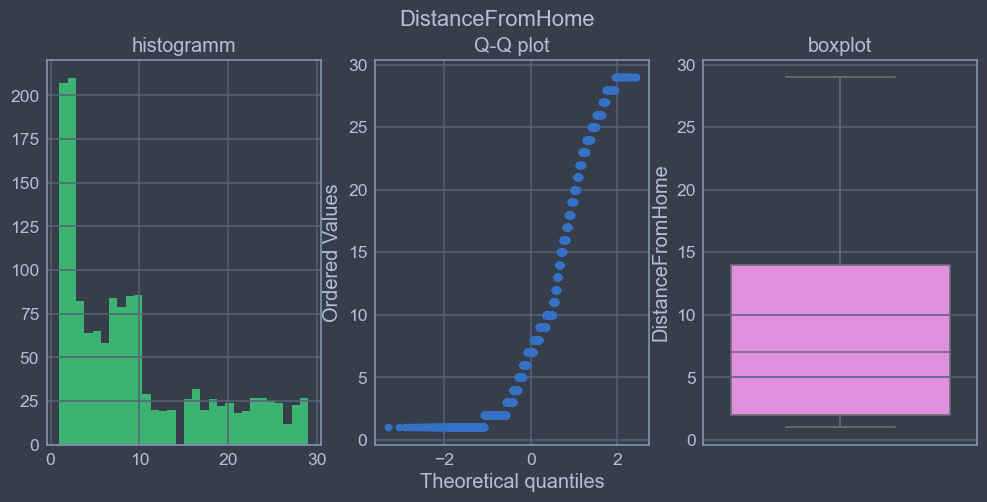

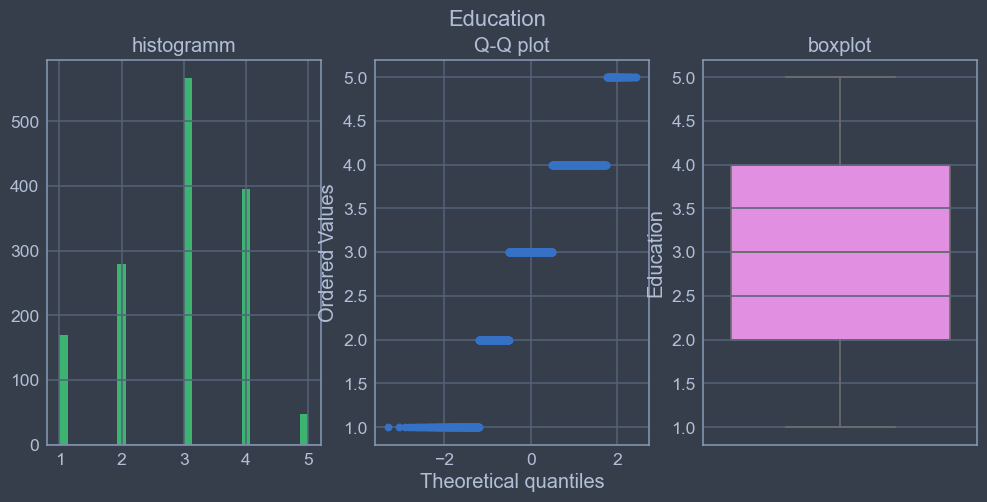

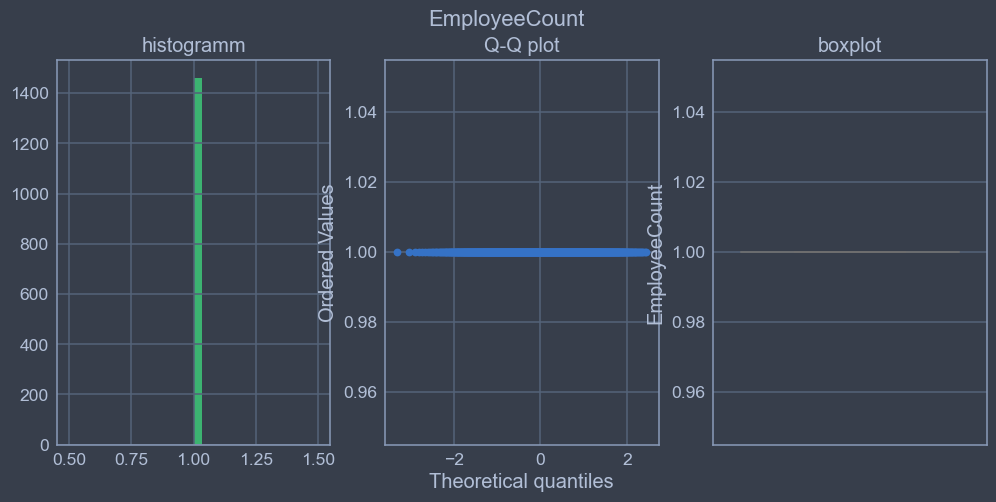

...

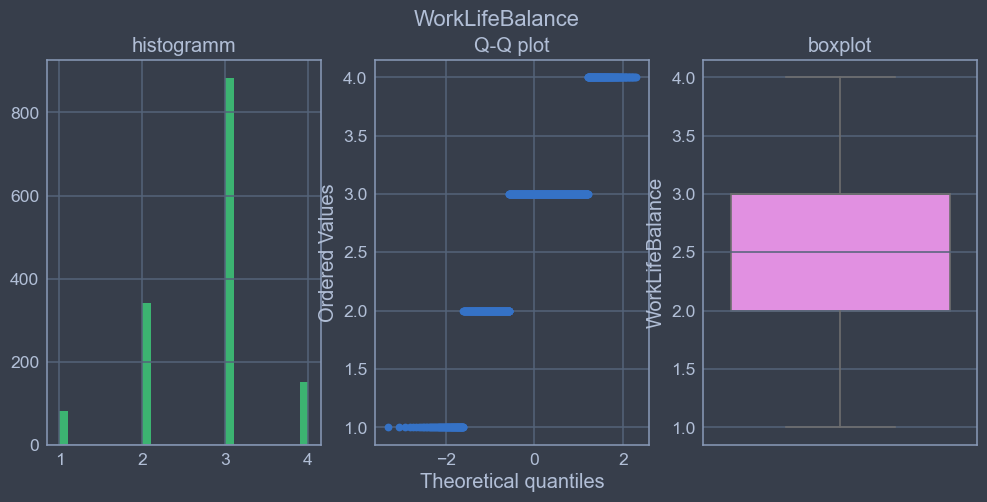

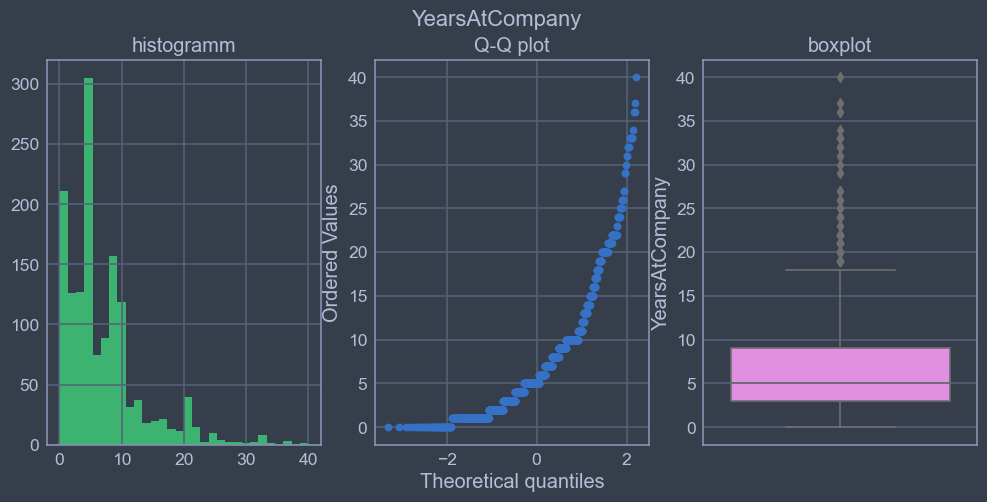

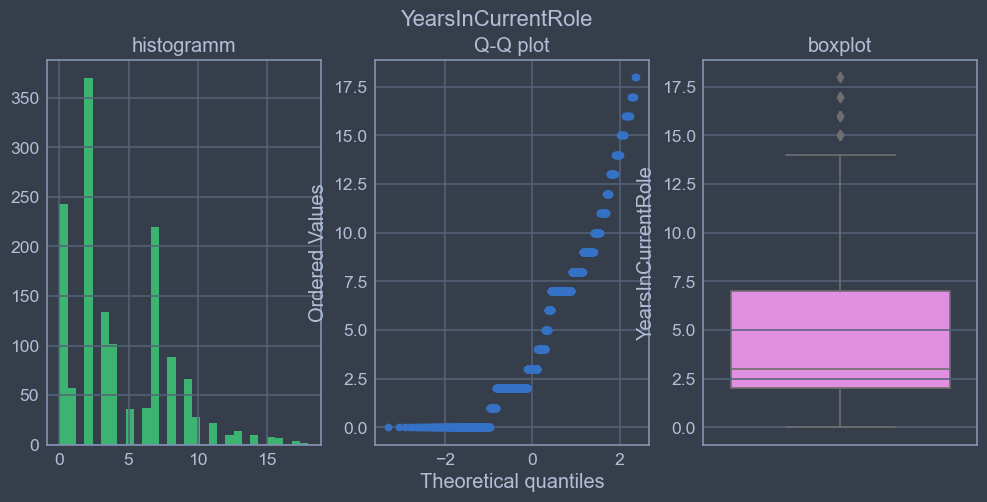

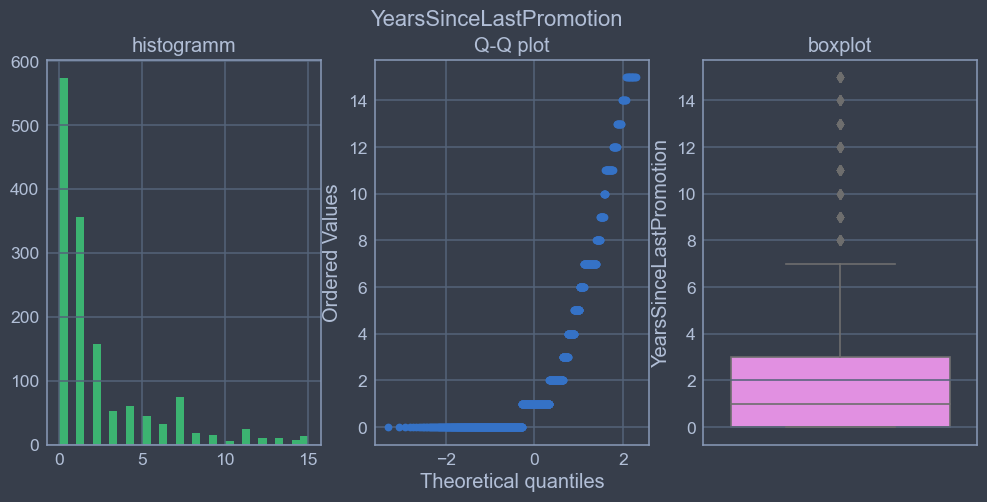

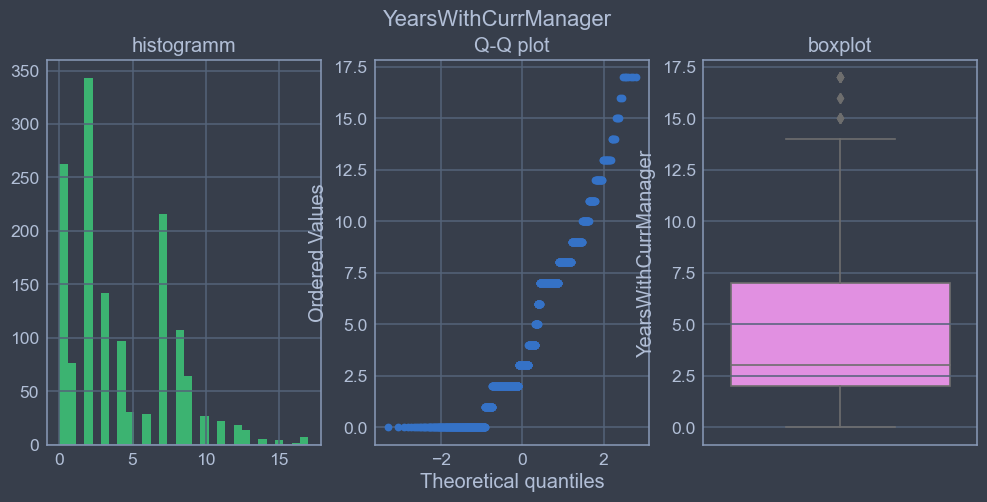

In [18]:
for i in num.columns.tolist():
    diagnostic_plots(df, i)

## Defining discrete and continious variables

In [19]:
discreate_variables = []
continuous_variables = []
for i in num.columns:
    if len(num[i].unique()) < 10 and (i != 'target'):
        discreate_variables.append(i)
    elif i == 'target':
        continue
    else:
        continuous_variables.append(i)
        
len(discreate_variables), len(continuous_variables)

(12, 14)

    There are 12 discrete and 14 continious variables

## Checking the balance of the target

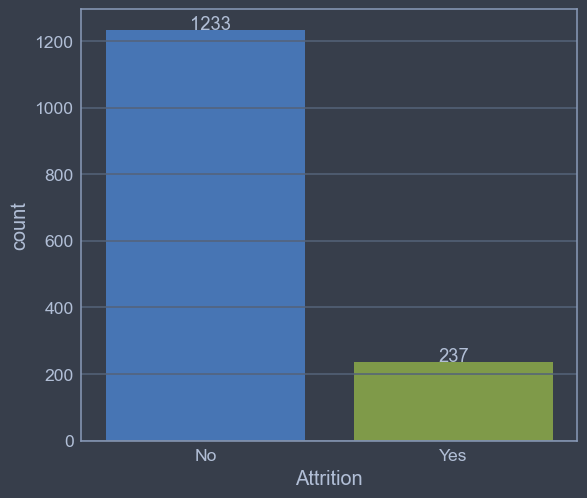

In [20]:
Attrition = df['Attrition'].value_counts(ascending = False)
ax = sns.countplot(x = df['Attrition'], label = 'Count', order = Attrition.index)
for p, label in zip(ax.patches, Attrition.values):
    ax.annotate(np.around(label, 2), (p.get_x()+0.34, p.get_height()+0.3))

    We can see that our dataset is imbalanced and we will use balancing techniques for the target in futher steps

## Exploring cardinality

In [21]:
def find_cardinality(df, var):
    cardinality = len(df[var].unique())
    return cardinality

In [22]:
for var in cat.columns:
    print('the amount of categories in ', var, ': {}'.format(find_cardinality(df, var)) )

the amount of categories in  Attrition : 2
the amount of categories in  BusinessTravel : 4
the amount of categories in  Department : 4
the amount of categories in  EducationField : 7
the amount of categories in  Gender : 3
the amount of categories in  JobRole : 10
the amount of categories in  MaritalStatus : 4
the amount of categories in  Over18 : 2
the amount of categories in  OverTime : 3


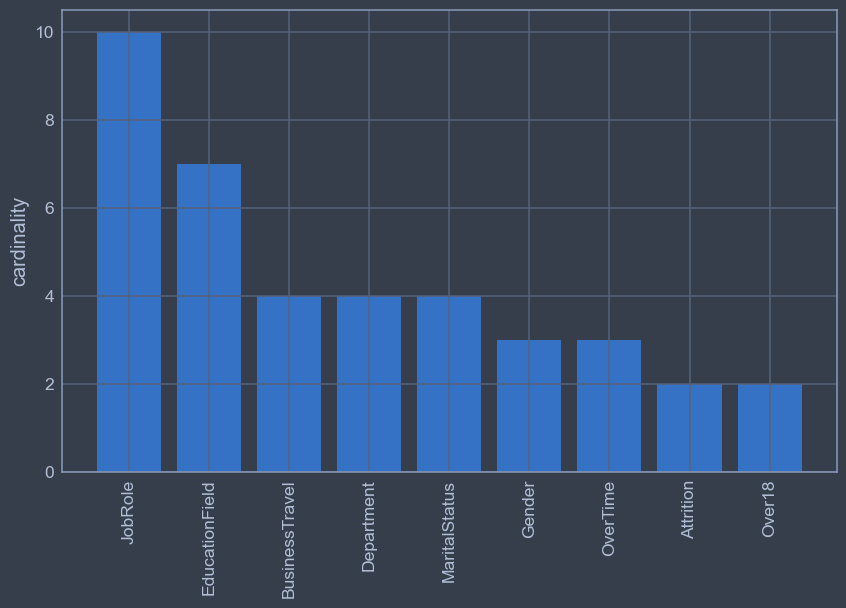

In [23]:
cardinality = []
for col in cat.columns:
    cardinality.append(find_cardinality(df, col))
data_cardinality = pd.DataFrame({'variable_name': cat.columns,
                                 'cardinality': cardinality})
data_cardinality = data_cardinality.sort_values(by = 'cardinality', ascending = False).reset_index().drop('index', axis = 1)

def plot_cardinality(df, var):
    fig, ax = plt.subplots(figsize = (10, 6))
    plt.xticks(df.index, df[var], rotation = 90)
    ax.bar(df.index, df['cardinality'])
    ax.set_ylabel("cardinality")
    plt.show()
    
plot_cardinality(data_cardinality, 'variable_name')

## Gender corellation

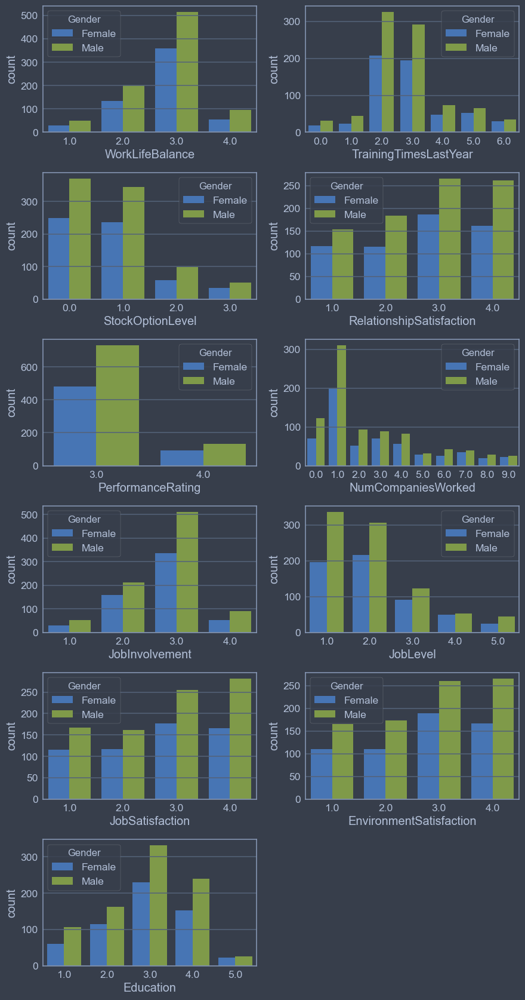

In [24]:
columns = ['WorkLifeBalance','TrainingTimesLastYear','StockOptionLevel',
    'RelationshipSatisfaction','PerformanceRating','NumCompaniesWorked',
   'JobInvolvement', 'JobLevel', 'JobSatisfaction',
   'EnvironmentSatisfaction','Education']

plt.figure(figsize = (9, 36))
for i, col in enumerate(columns):
    axes = plt.subplot(13, 2, i + 1)
    sns.countplot(x = df[col], hue = df['Gender'])
plt.tight_layout()
plt.show()

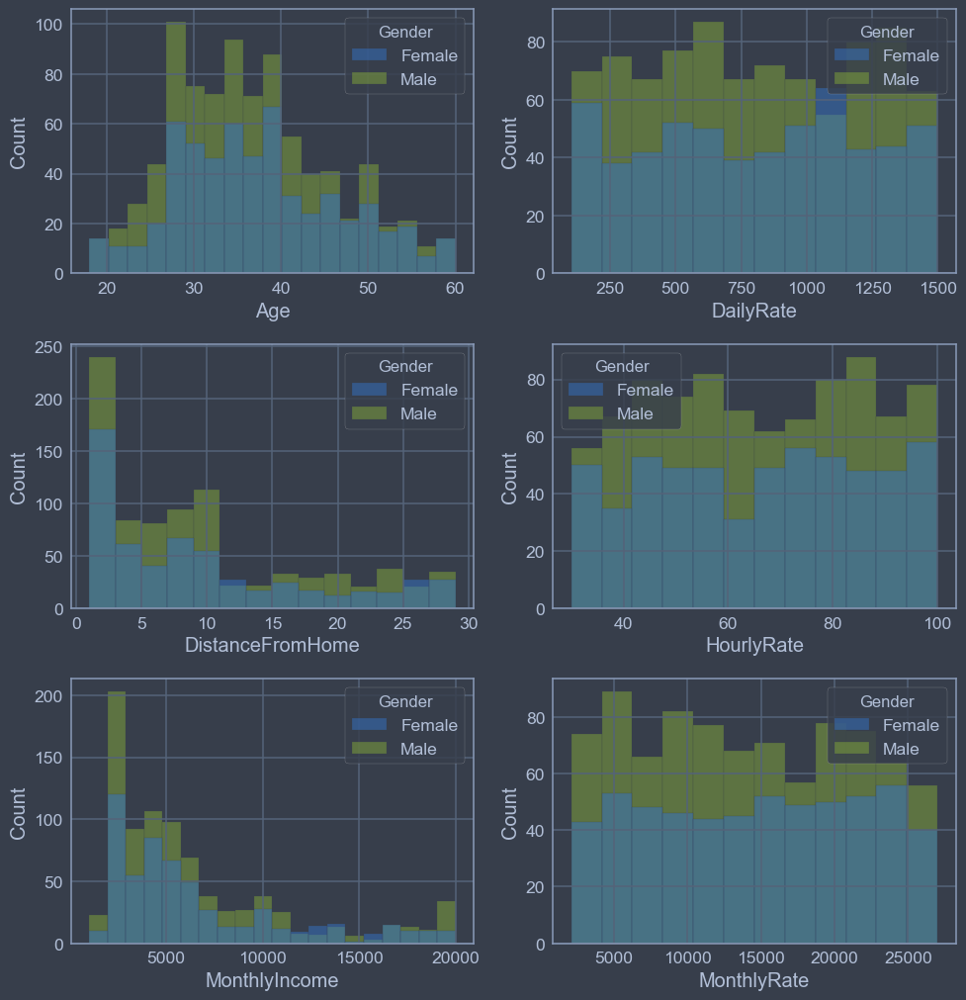

In [25]:
histogram = ['Age', 'DailyRate', 'DistanceFromHome', 'HourlyRate', 'MonthlyIncome', 'MonthlyRate']

plt.figure(figsize = (10, 20))
for i, col in enumerate(histogram):
    axes = plt.subplot(6, 2, i + 1)
    sns.histplot(x = df[col], hue = df['Gender'])
    
plt.tight_layout()
plt.show()       

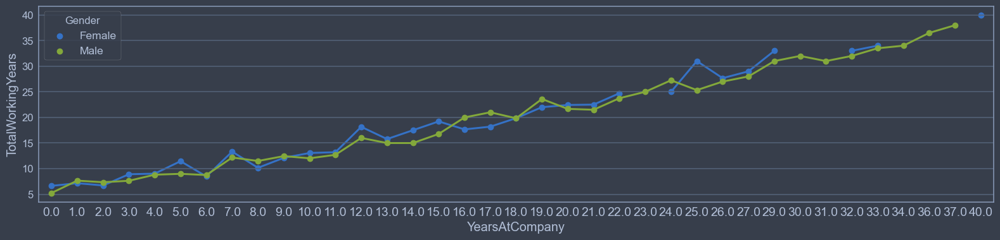

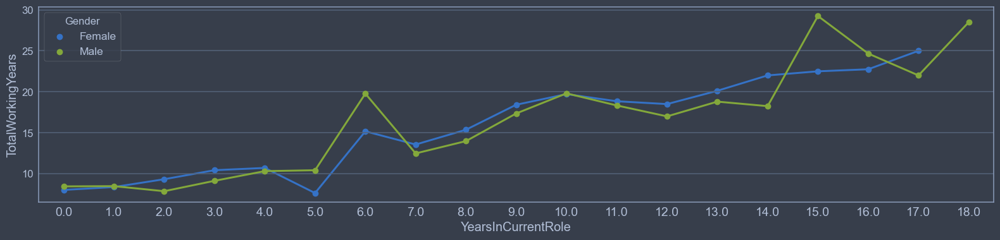

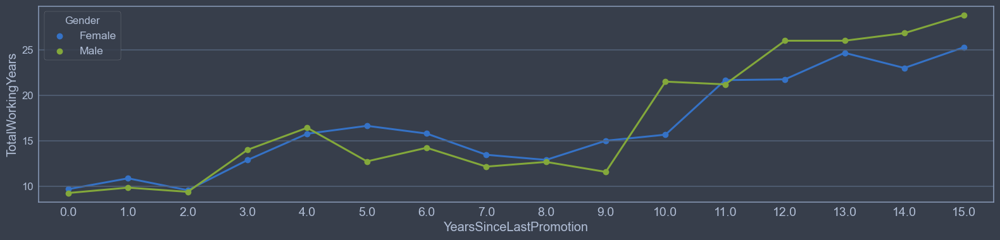

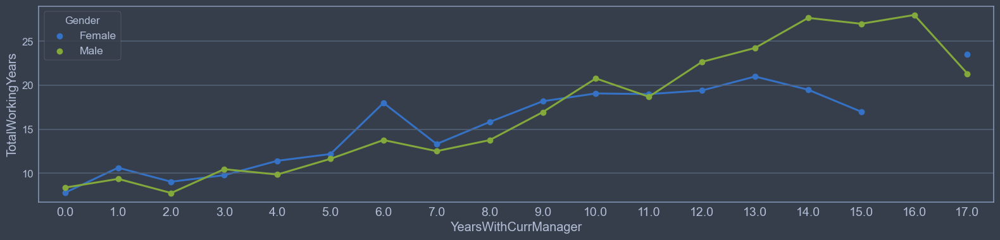

In [26]:
# Correlation: Total Years of Work
columns = ['YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']

for i in columns:
    fig, axes = plt.subplots(figsize = (16,4))
    sns.pointplot(x = df[i], y = df['TotalWorkingYears'], hue = df['Gender'], errorbar = None)
    plt.xticks(fontsize = 14)
    plt.yticks(fontsize = 12)
    plt.tight_layout()
    plt.show()

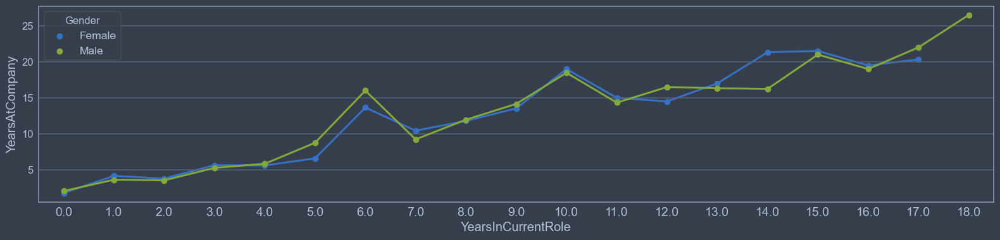

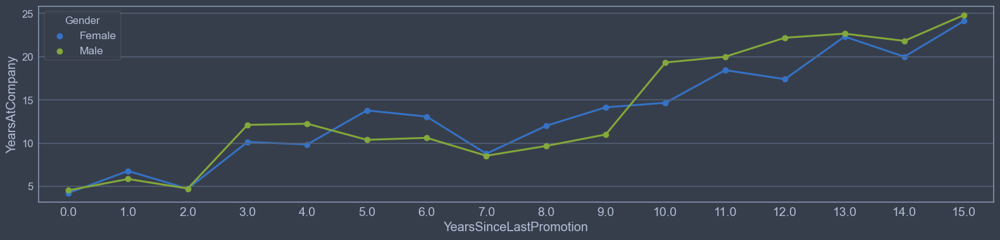

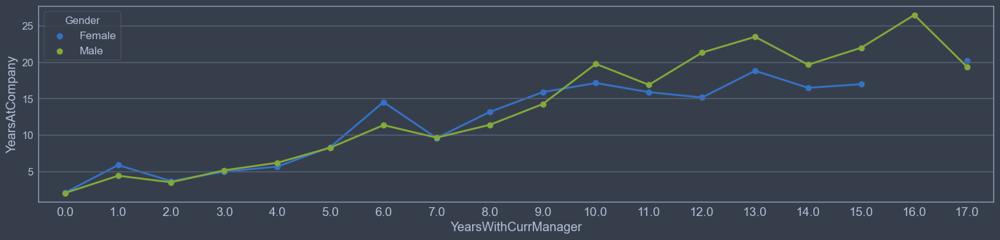

In [27]:
# Correlation: Years at the Company
columns = ['YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']

for i in columns:
    fig, axes = plt.subplots(figsize = (16, 4))
    sns.pointplot(x = df[i], y = df['YearsAtCompany'], hue = df['Gender'], errorbar = None)
    plt.xticks(fontsize = 14)
    plt.yticks(fontsize = 12)

    plt.tight_layout()
    plt.show()

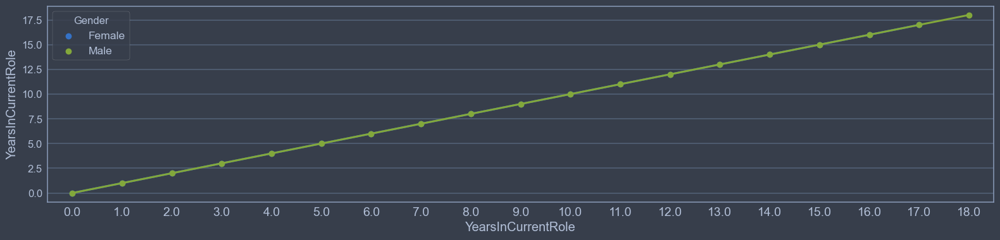

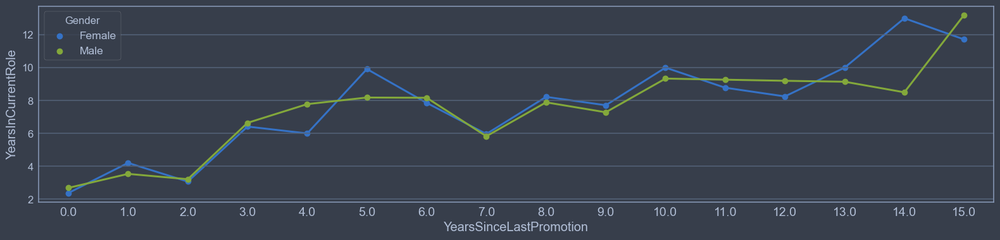

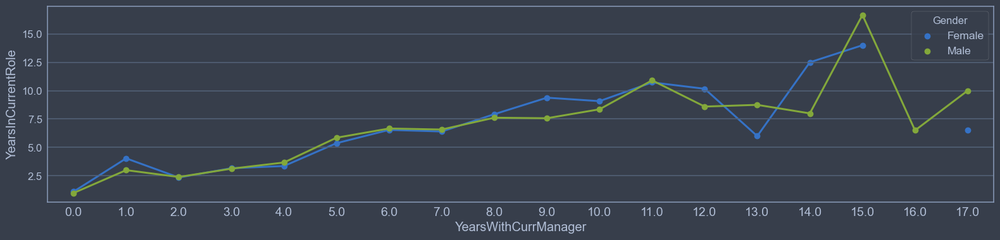

In [28]:
# Correlation: Years in current job
columns = ['YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']

for i in columns:
    fig, axes = plt.subplots(figsize = (16, 4))
    sns.pointplot(x = df[i], y = df['YearsInCurrentRole'], hue = df['Gender'], errorbar = None)
    plt.xticks(fontsize = 14)
    plt.yticks(fontsize = 12)

    plt.tight_layout()
    plt.show()

## Monthly income

### Monthly income in years of work

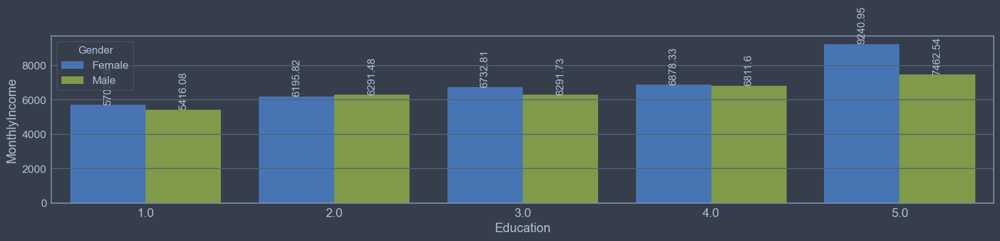

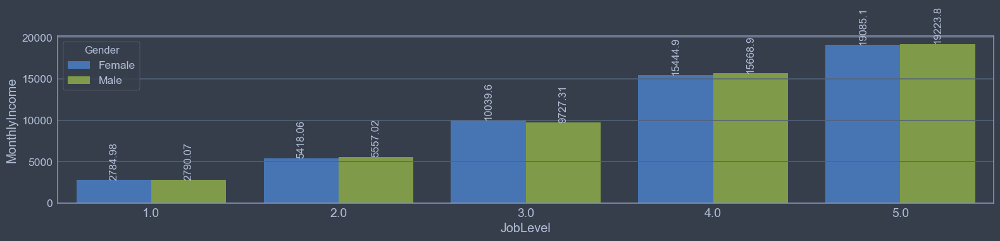

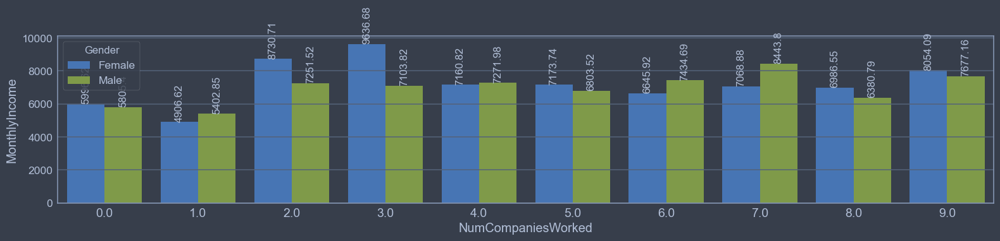

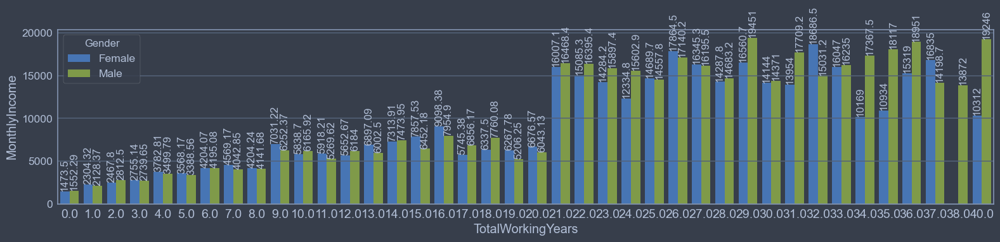

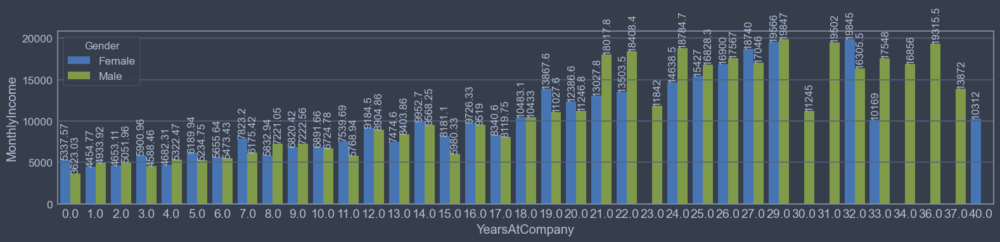

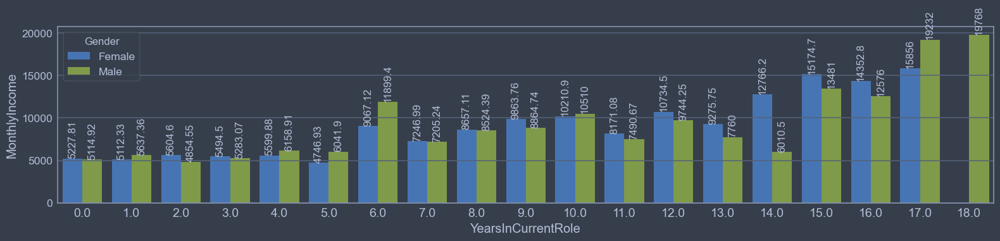

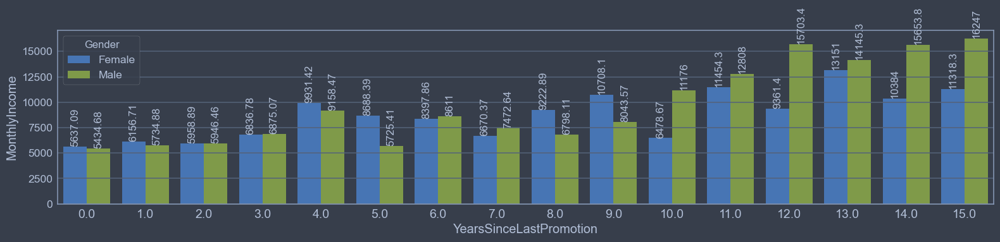

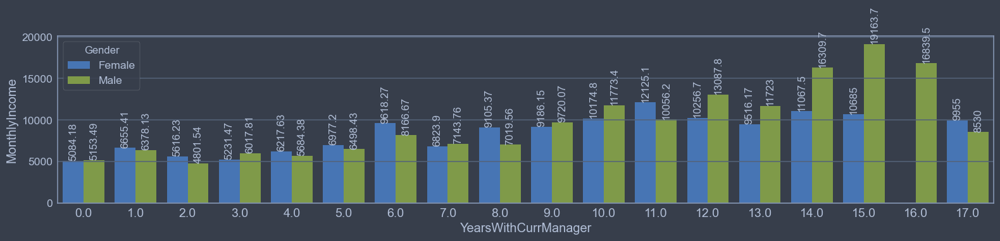

In [29]:
columns = ['Education','JobLevel','NumCompaniesWorked','TotalWorkingYears','YearsAtCompany',
       'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager']

for i in columns:
    fig, axes = plt.subplots(figsize = (16, 4))
    sns.barplot(x = df[i], y = df['MonthlyIncome'], hue = df['Gender'], errorbar = None)
    plt.xticks(fontsize = 14)
    for cont in axes.containers:
        axes.bar_label(cont,rotation = 90, fontsize = 12)
    plt.tight_layout()
    plt.show()

### Monthly income by gender

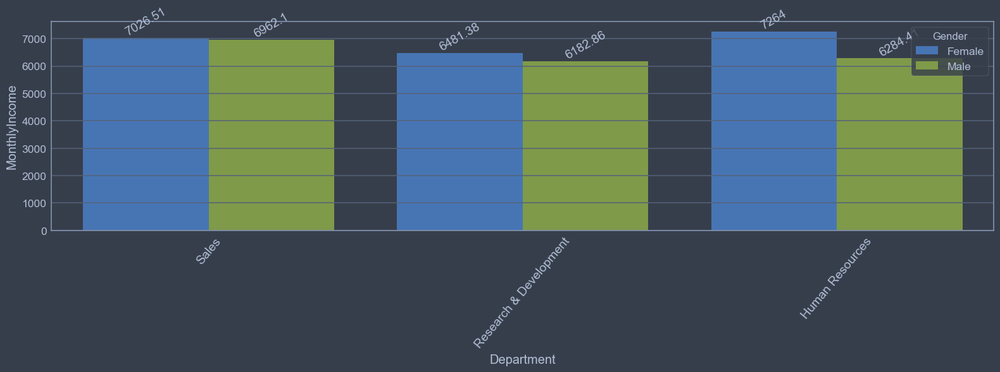

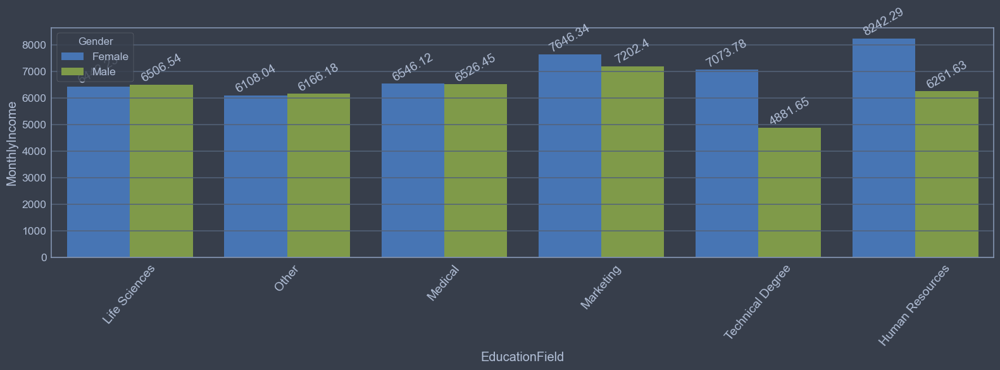

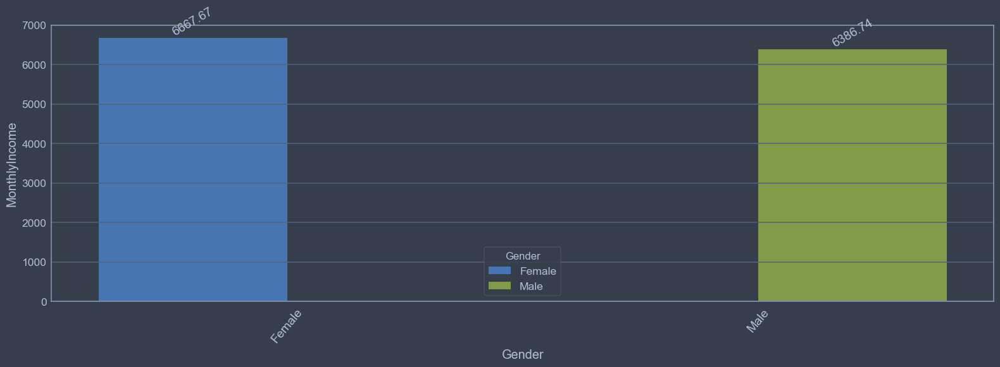

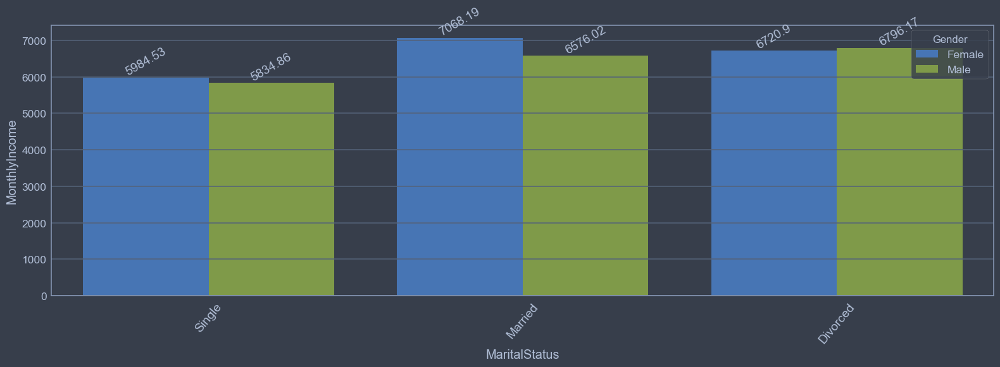

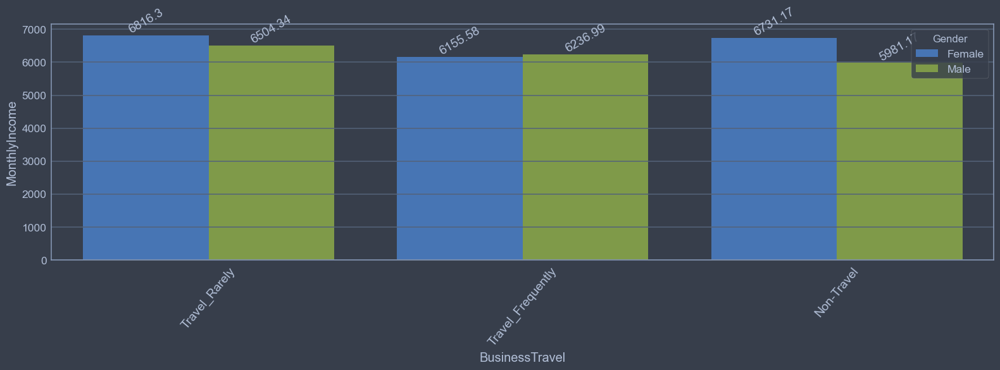

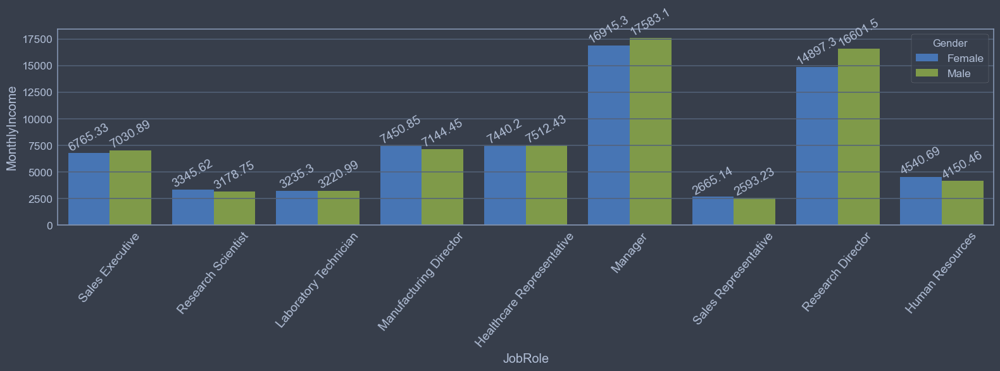

In [30]:
columns = ['Department','EducationField','Gender','MaritalStatus','BusinessTravel','JobRole']

for i in columns:
    fig, axes = plt.subplots(figsize = (16,6))
    sns.barplot(x = df[i], y = df['MonthlyIncome'], hue = df['Gender'], errorbar = None)
    plt.xticks(rotation = 50,fontsize = 14)
    for cont in axes.containers:
        axes.bar_label(cont,rotation = 30, fontsize = 14)
    plt.tight_layout()
    plt.show()

### Monthly income according to Attrition

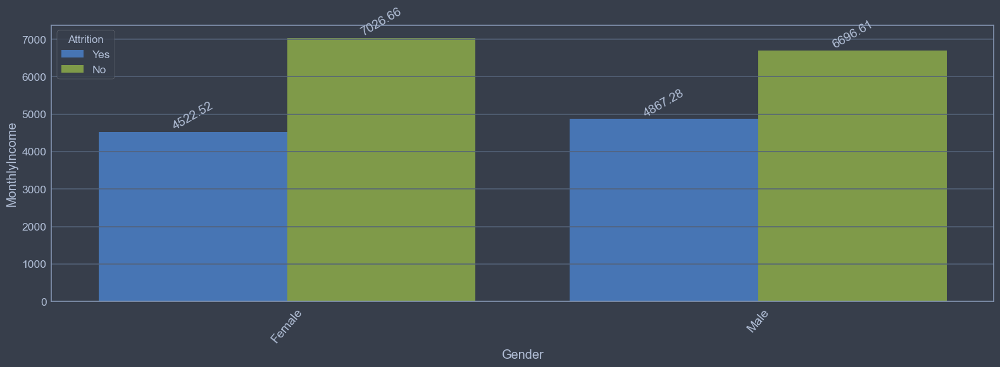

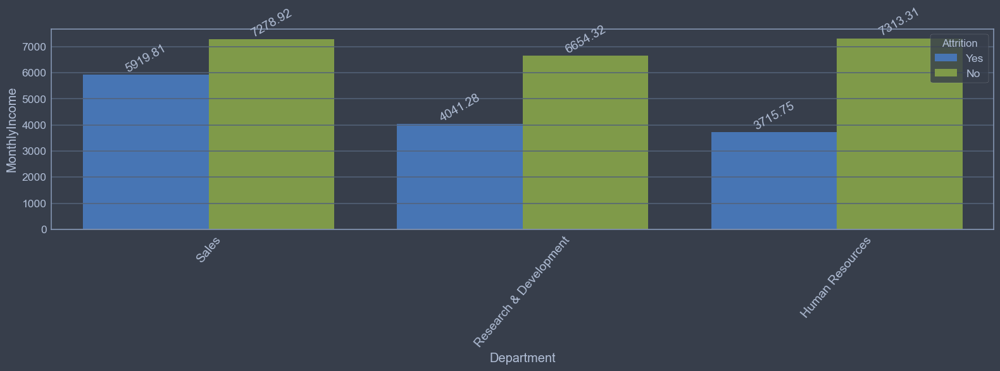

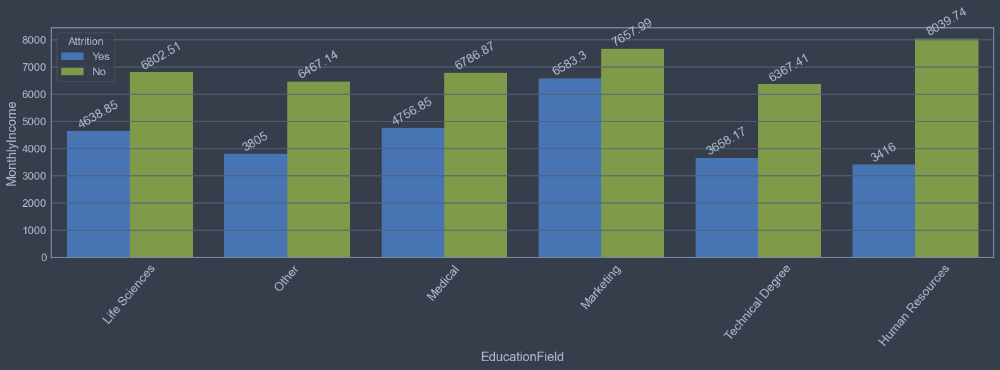

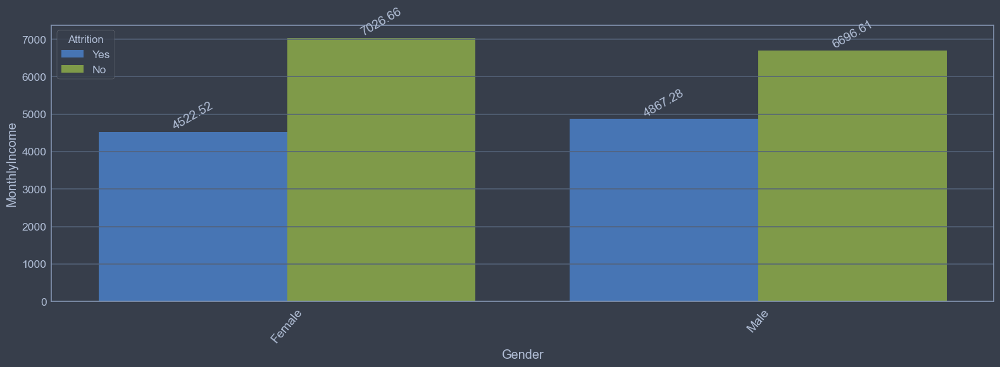

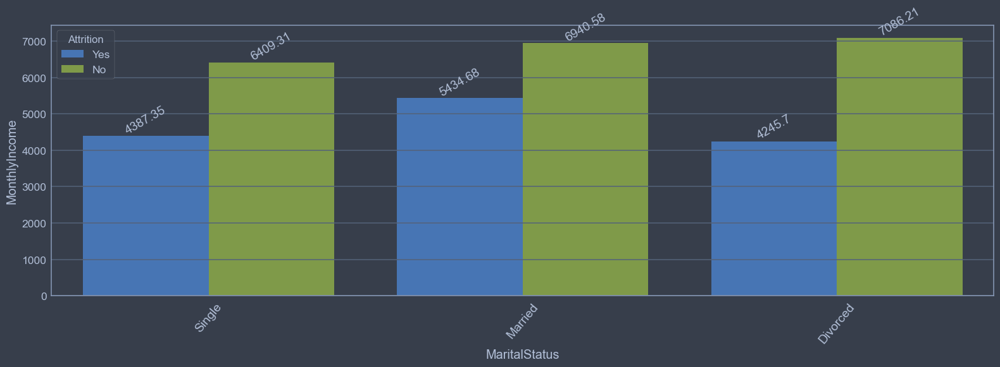

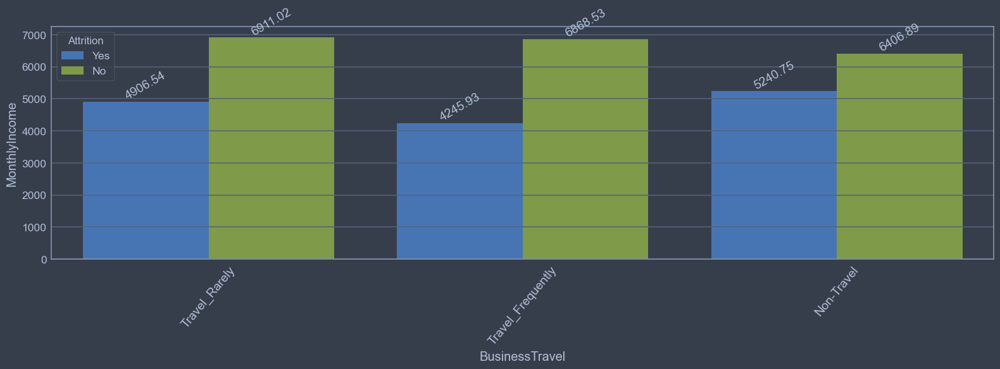

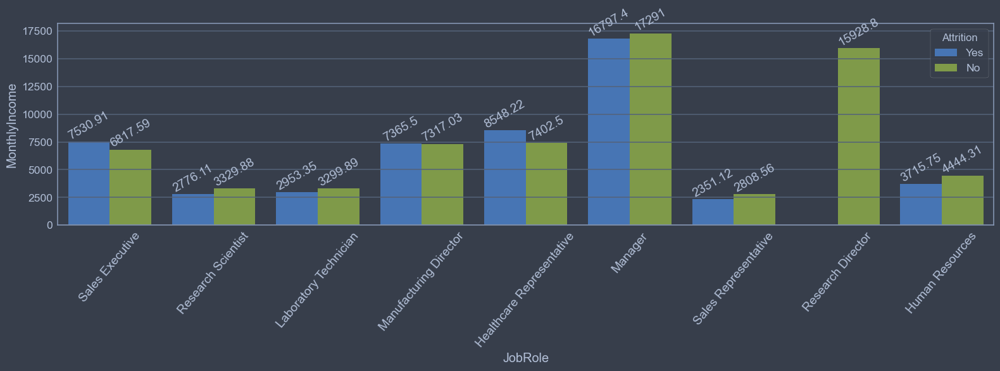

In [31]:
columns = ['Gender','Department','EducationField','Gender','MaritalStatus','BusinessTravel','JobRole']

for i in columns:
    fig, axes = plt.subplots(figsize = (16, 6))
    sns.barplot(x = df[i], y = df['MonthlyIncome'], hue = df['Attrition'], errorbar = None)
    plt.xticks(rotation = 50, fontsize = 14)
    for cont in axes.containers:
        axes.bar_label(cont,rotation = 30, fontsize = 14)
    plt.tight_layout()
    plt.show()

### Monthly income vs Overtime

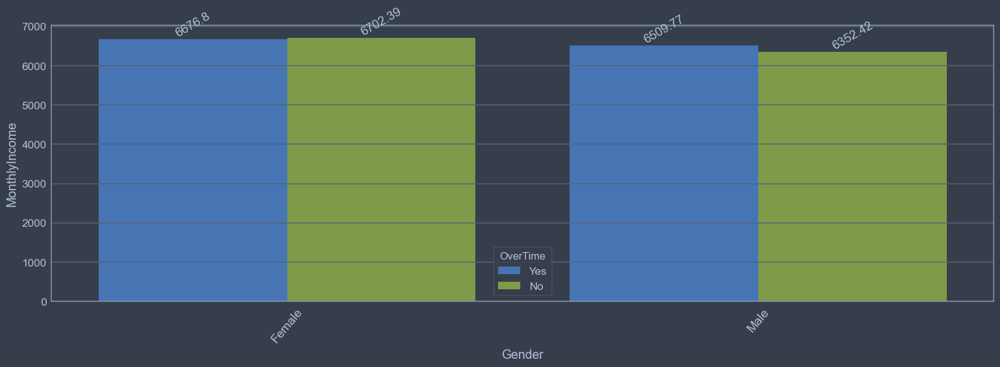

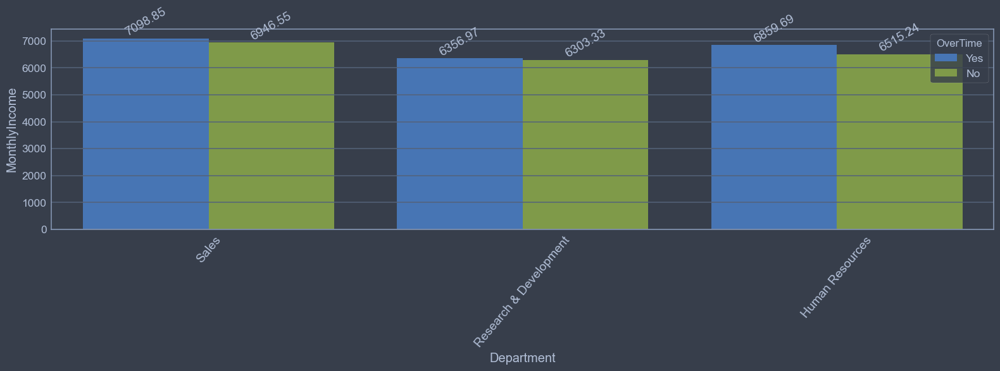

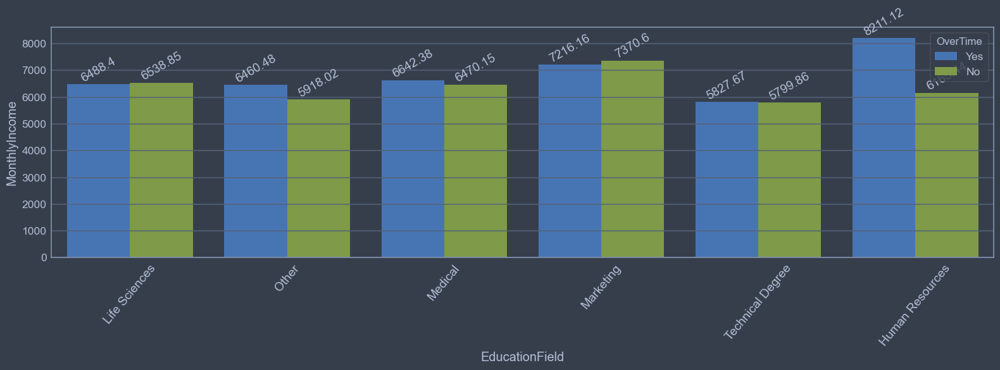

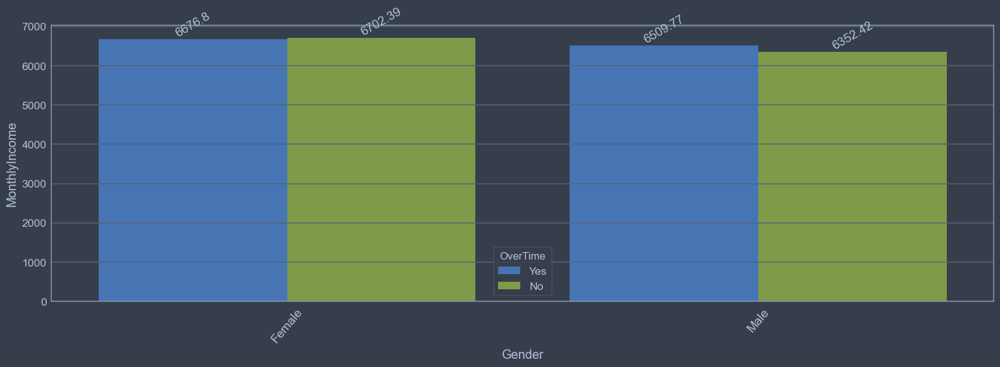

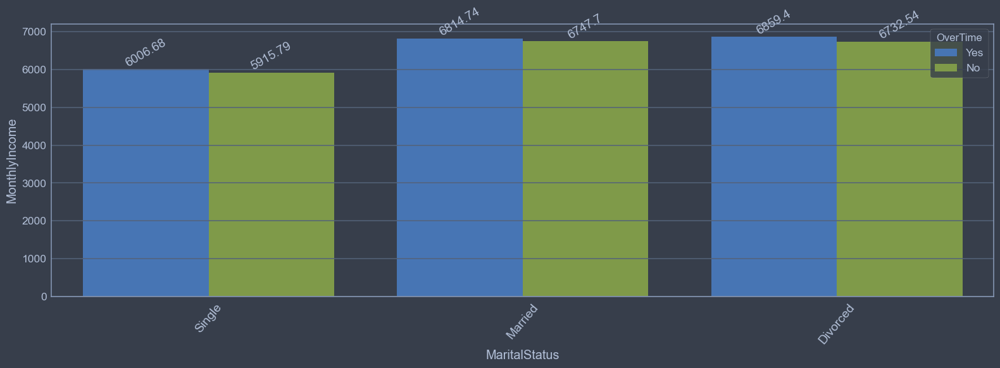

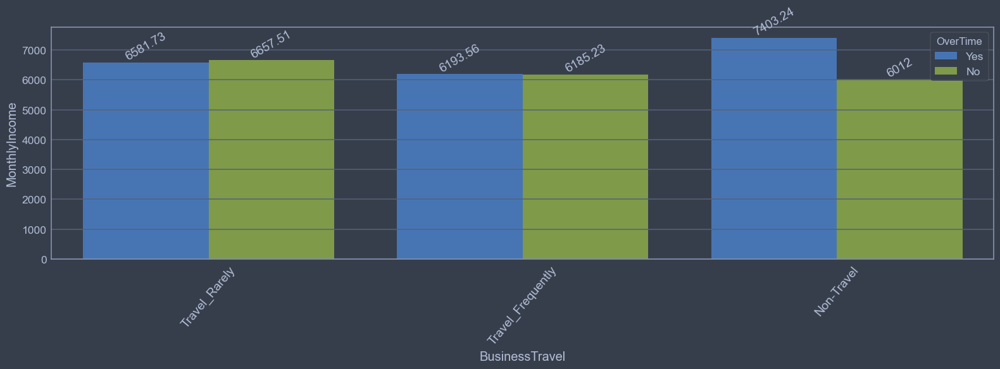

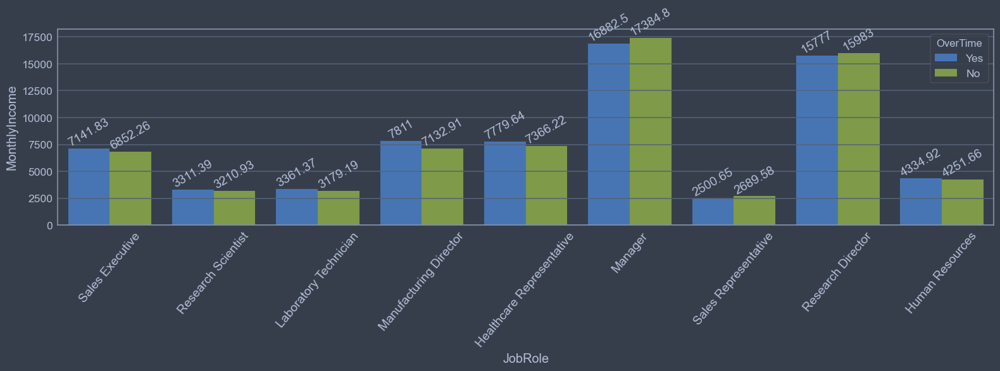

In [32]:
columns = ['Gender','Department','EducationField','Gender','MaritalStatus','BusinessTravel','JobRole']

for i in columns:
    fig, axes = plt.subplots(figsize = (16, 6))
    sns.barplot(x = df[i], y = df['MonthlyIncome'], hue = df['OverTime'], errorbar = None)
    plt.xticks(rotation = 50, fontsize = 14)
    for cont in axes.containers:
        axes.bar_label(cont, rotation = 30, fontsize = 14)
    plt.tight_layout()
    plt.show()

### Monthly income by marital status

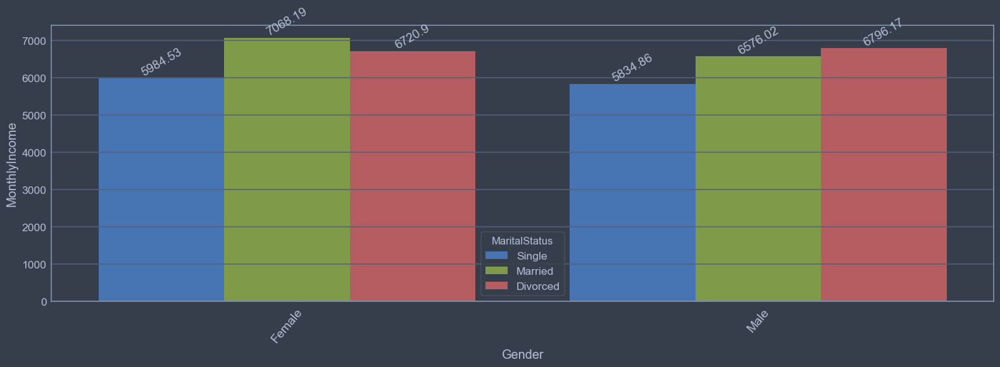

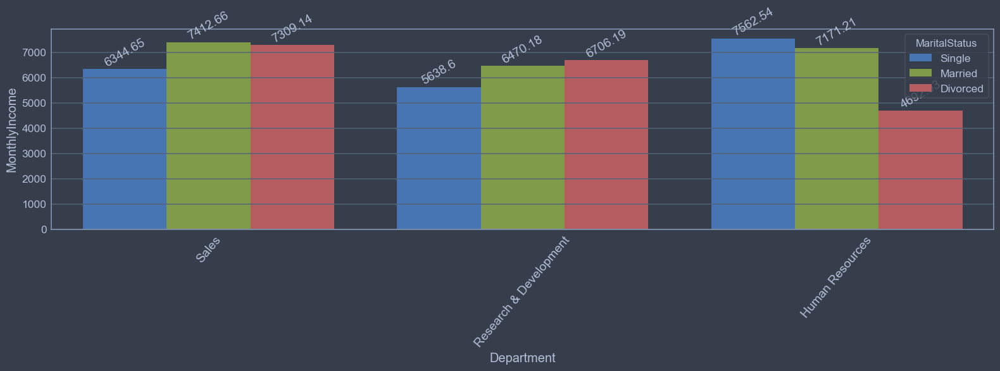

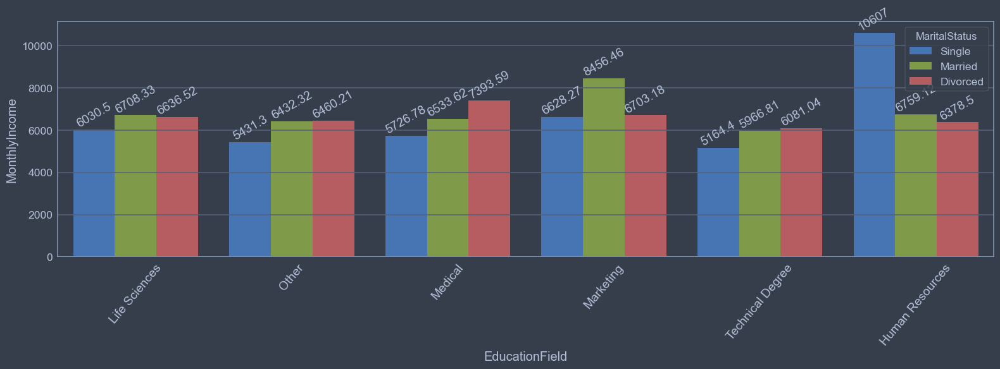

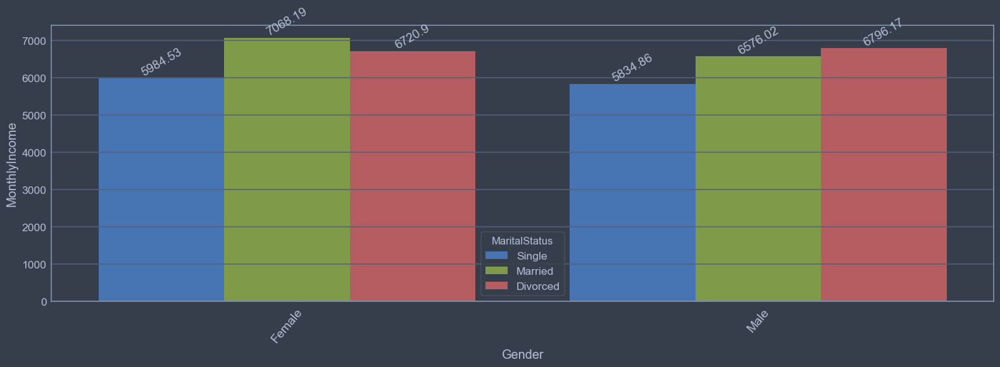

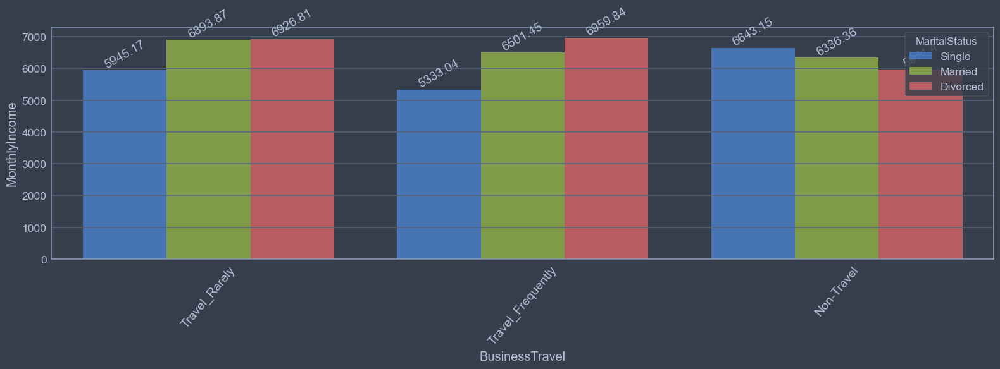

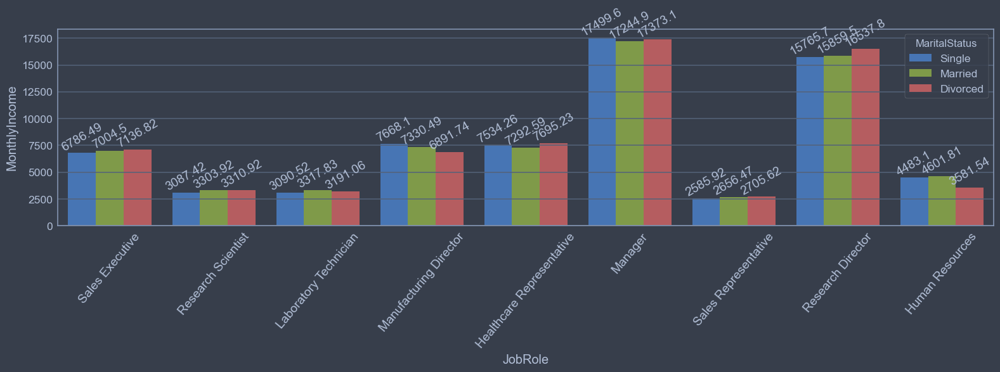

In [33]:
columns = ['Gender','Department','EducationField','Gender','BusinessTravel','JobRole']

for i in columns:
    fig, axes = plt.subplots(figsize = (16, 6))
    sns.barplot(x = df[i], y = df['MonthlyIncome'], hue = df['MaritalStatus'], errorbar = None)
    plt.xticks(rotation = 50, fontsize = 14)
    for cont in axes.containers:
        axes.bar_label(cont, rotation = 30, fontsize = 14)
    plt.tight_layout()
    plt.show()

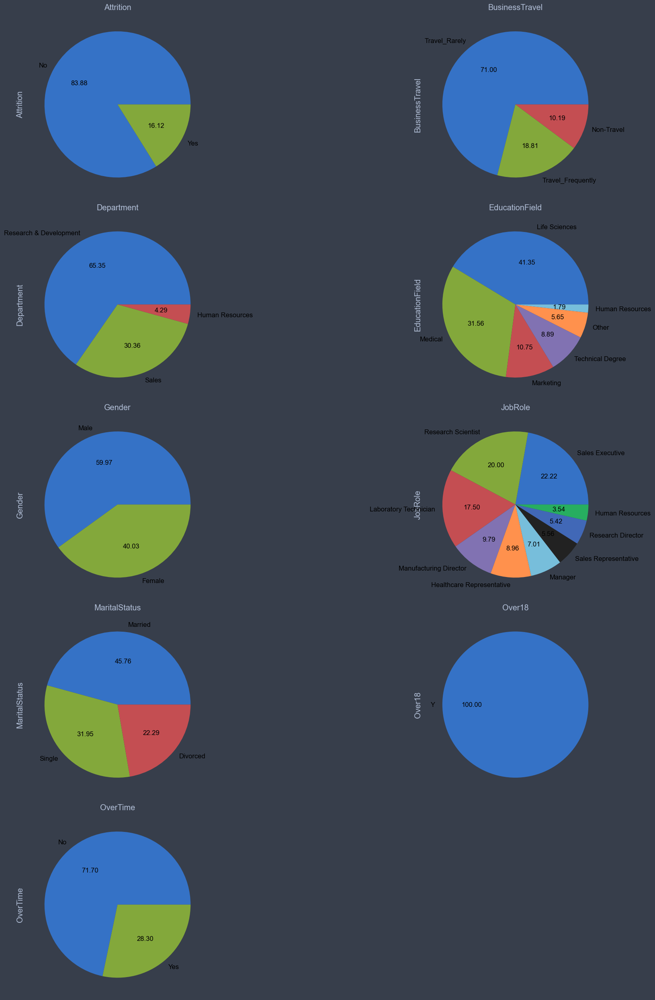

In [34]:
plt.figure(figsize =(20, 40))
for i,col in enumerate(cat):
    axes = plt.subplot(8, 2, i + 1)
    df[col].value_counts().plot.pie(autopct = '%.2f', textprops = {'size':12, 'color':'black'})
    plt.title(col)
plt.tight_layout()
plt.show()

## Facet Grid

### Monthly income of longest employment by Job Level

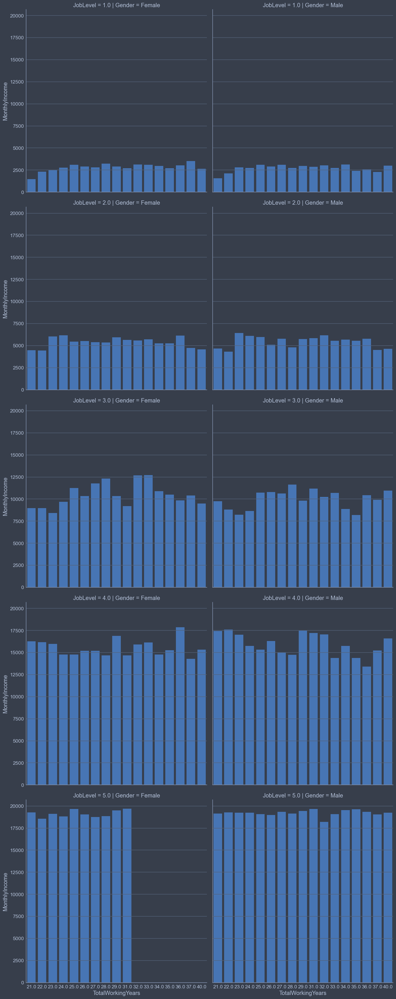

In [35]:
g = sns.FacetGrid(df, col = 'Gender' , row = 'JobLevel', height = 7)
g.map_dataframe(sns.barplot, x = 'TotalWorkingYears', y = 'MonthlyIncome', errorbar = None)
plt.show()

### Monthly income by Age and Job Level

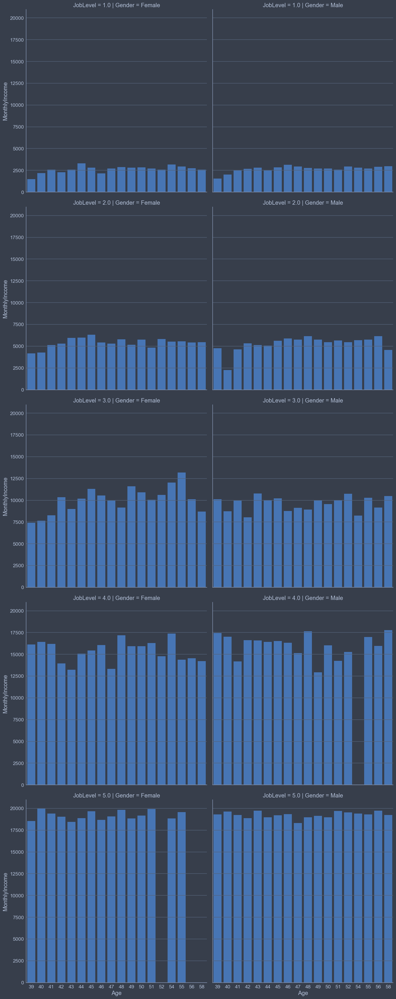

In [36]:
g = sns.FacetGrid(df, col = 'Gender' , row = 'JobLevel', height = 7)
g.map_dataframe(sns.barplot, x = 'Age',y = 'MonthlyIncome', errorbar = None)
plt.show()

### Age of longest working employees by Job Level

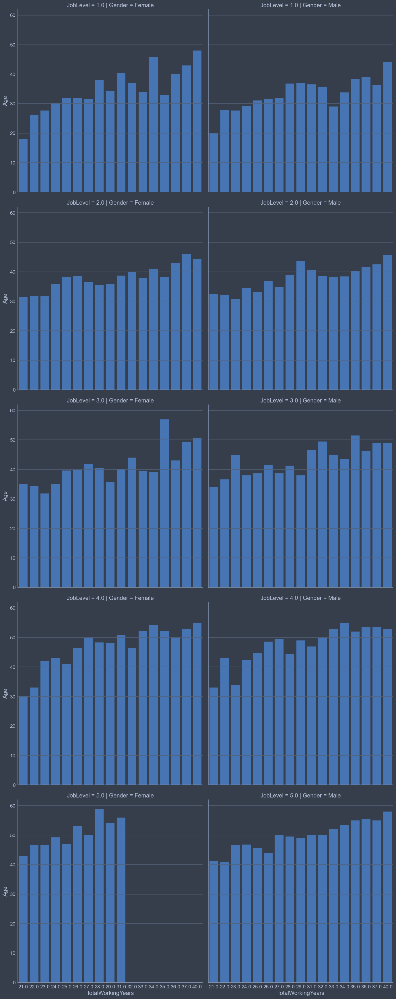

In [37]:
g = sns.FacetGrid(df, col = 'Gender', row = 'JobLevel', height = 7)
g.map_dataframe(sns.barplot, x = 'TotalWorkingYears',y = 'Age', errorbar = None)
plt.show()

### Monthly income of longest working employees in each department

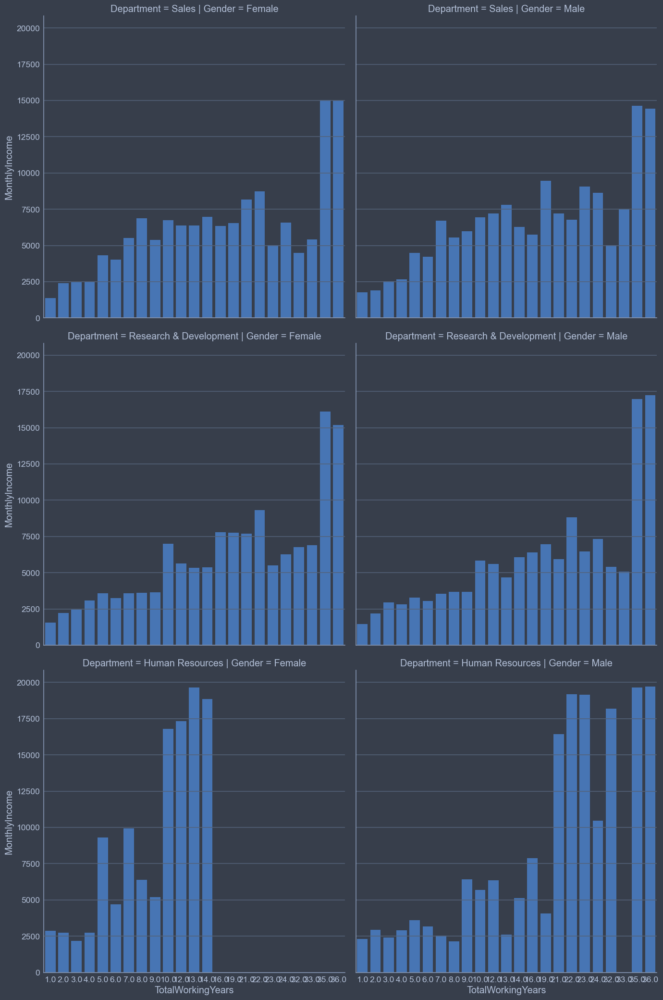

In [38]:
g = sns.FacetGrid(df, col = 'Gender' , row = 'Department', height = 7)
g.map_dataframe(sns.barplot, x = 'TotalWorkingYears', y = 'MonthlyIncome', errorbar = None)
plt.show()

### Monthly income of longest working employees by level of education

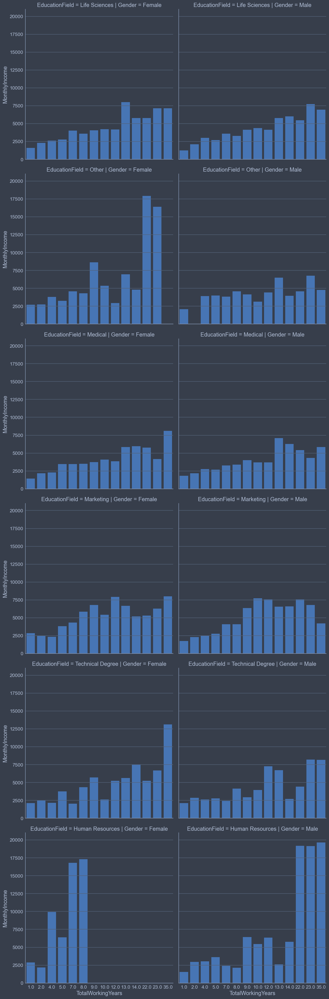

In [39]:
g = sns.FacetGrid(df, col = 'Gender' , row = 'EducationField', height = 6)
g.map_dataframe(sns.barplot, x = 'TotalWorkingYears', y = 'MonthlyIncome', errorbar = None)
plt.show()

### Monthly income of longest working employees by Job Role

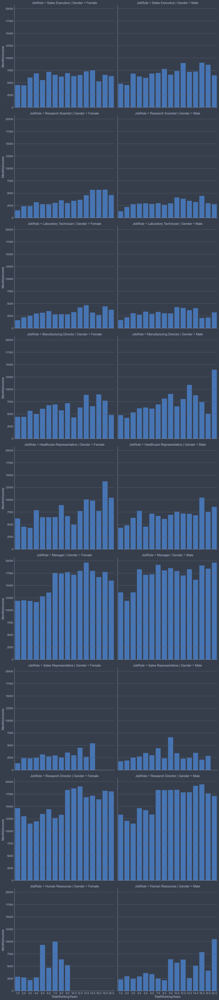

In [40]:
g = sns.FacetGrid(df, col = 'Gender' , row = 'JobRole', height = 7)
g.map_dataframe(sns.barplot, x = 'TotalWorkingYears', y = 'MonthlyIncome', errorbar = None)
plt.show()

### Attrition due to the years of employment and Job Role

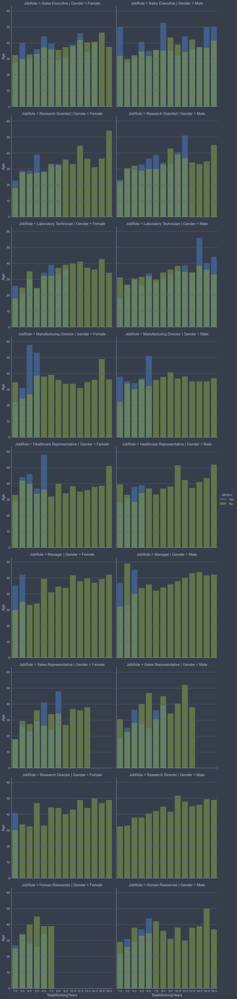

In [41]:
g = sns.FacetGrid(df, col = 'Gender' , row = 'JobRole', hue = 'Attrition', height = 6)
g.map_dataframe(sns.barplot, x = 'TotalWorkingYears', y = 'Age', alpha=0.6, errorbar = None)
g.add_legend()
plt.show()

### Attrition due to years of employment in each department

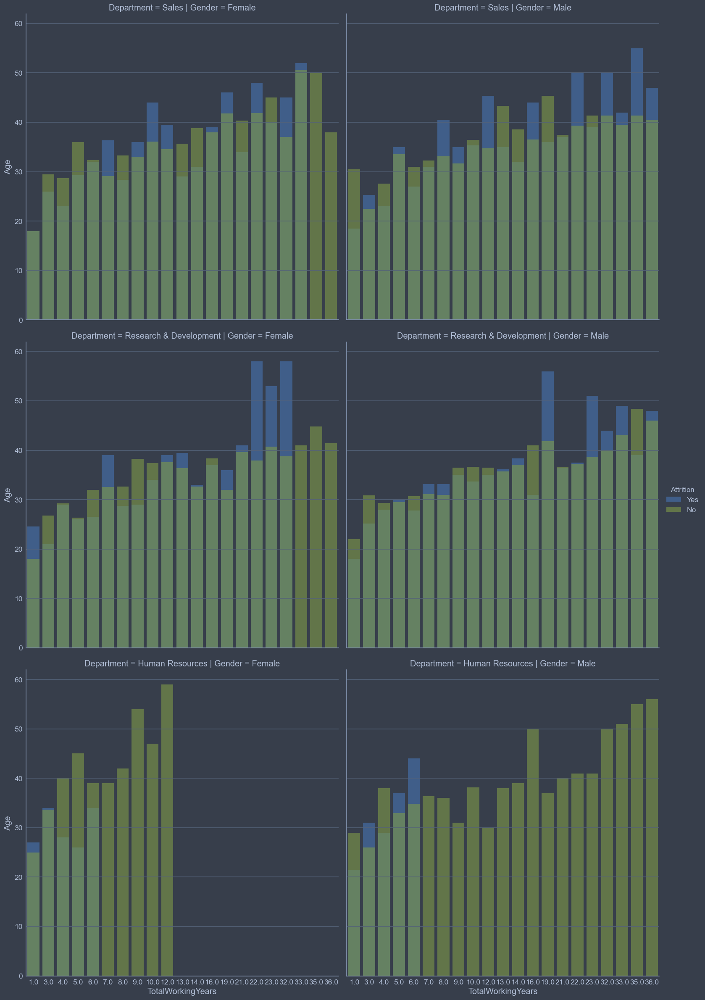

In [42]:
g = sns.FacetGrid(df, col = 'Gender' , row = 'Department', hue = 'Attrition', height = 8)
g.map_dataframe(sns.barplot, x = 'TotalWorkingYears', y = 'Age', alpha = 0.6, errorbar = None)
g.add_legend()
plt.show()

### Attrition due to years of employment and Business Travels

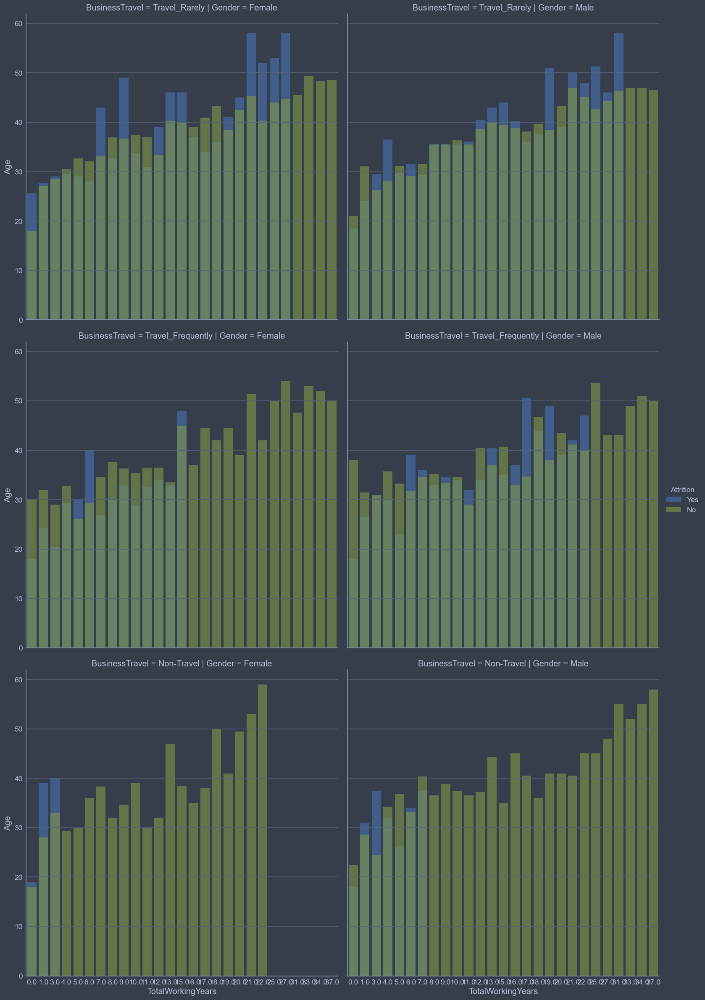

In [43]:
g = sns.FacetGrid(df, col = 'Gender', row = 'BusinessTravel', hue = 'Attrition', height = 8)
g.map_dataframe(sns.barplot, x = 'TotalWorkingYears', y = 'Age', alpha = 0.6, errorbar = None)
g.add_legend()
plt.show()

### Attrition due to years of employment and Marital Status

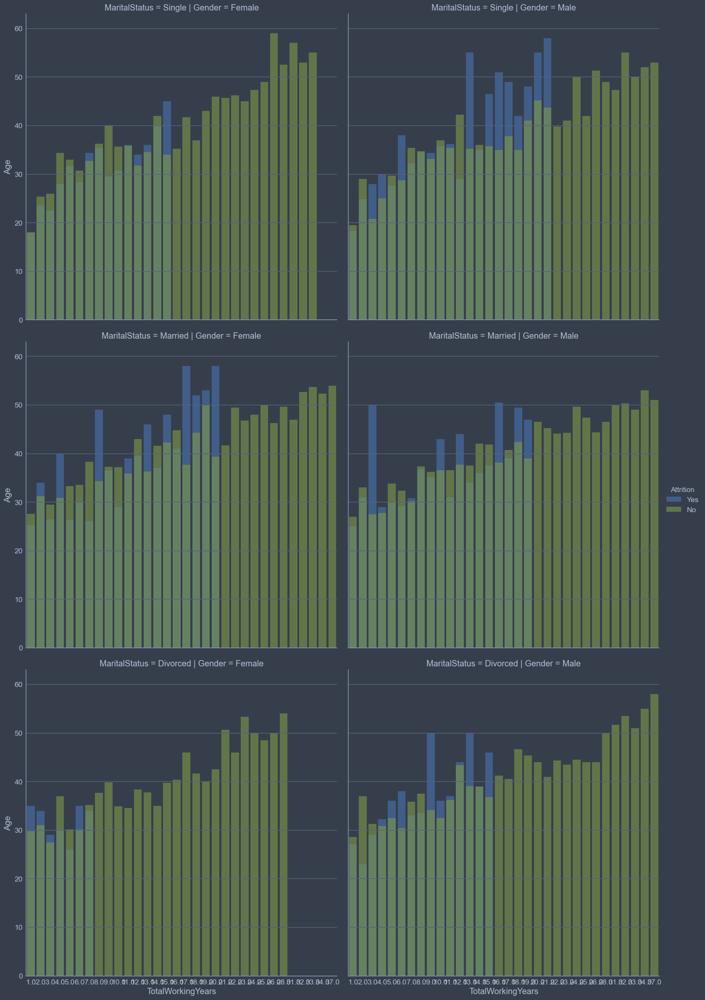

In [44]:
g = sns.FacetGrid(df, col = 'Gender', row = 'MaritalStatus', hue = 'Attrition', height = 8)
g.map_dataframe(sns.barplot, x = 'TotalWorkingYears', y = 'Age', alpha = 0.6, errorbar = None)
g.add_legend()
plt.show()

### Attrition due to years of employment and Overtime per department

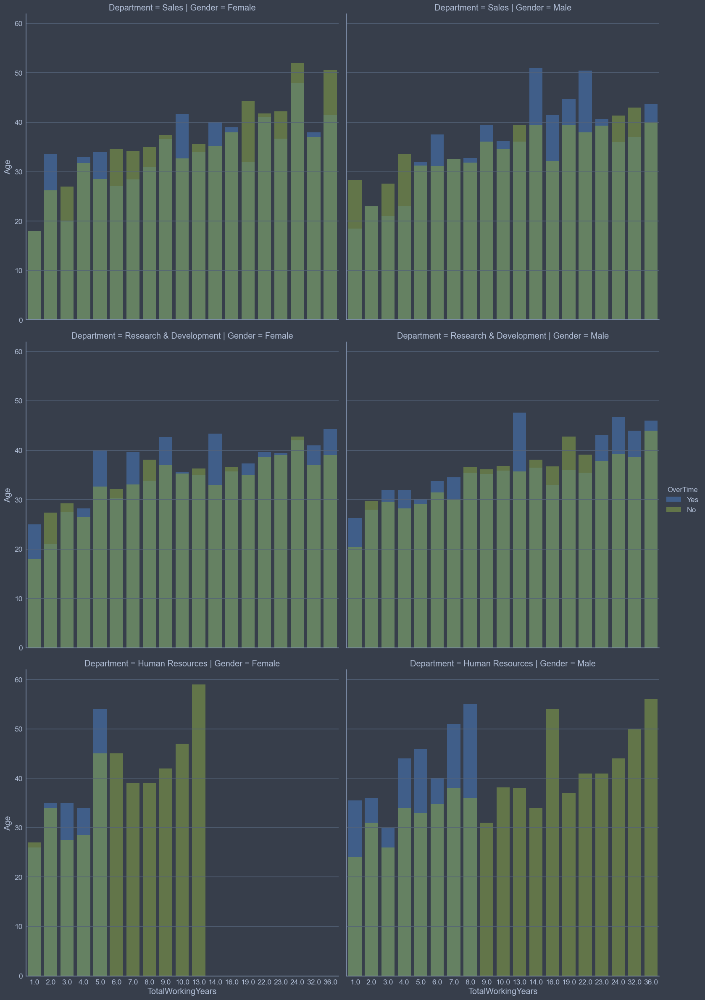

In [45]:
g = sns.FacetGrid(df, col = 'Gender', row = 'Department', hue = 'OverTime', height = 8)
g.map_dataframe(sns.barplot, x = 'TotalWorkingYears', y = 'Age', alpha = 0.6, errorbar = None)
g.add_legend()
plt.show()

## Resume

In [46]:
fig = make_subplots(rows = 1, cols = 2, 
                  subplot_titles = ("", "Employee Attrition by Department"),
                  specs = [[{"type": "bar"}, {"type": "pie"}]])

# Bar chart
plot_df = df['Attrition'].value_counts(normalize = True)
plot_df = plot_df.mul(100).rename('Percent').reset_index().sort_values('Percent')
plot_df.rename(columns = {'index':'Attrition'}, inplace = True)
plot_df['Attrition'] = ['Former Employees' if i == 'Yes' else 'Current Employees' for i in plot_df['Attrition']]
x = plot_df['Attrition']
y = plot_df['Percent']
fig.add_trace(
    go.Bar(x = x, y = y, text = y,opacity = .8,
           hovertemplate = 'Employee Attrition Rate<br>%{x}: %{y:.3}%<extra></extra>',
           showlegend = False), row = 1, col = 1)
fig.update_traces(texttemplate = '%{text:.3s}%', textposition = 'outside', 
                  marker_line = dict(width = 1, color = '#1F0202'), marker_color = ['#C02B34','#CDBBA7'])
fig.update_yaxes(zeroline = True, zerolinewidth = 1, zerolinecolor = 'gray')
fig.update_layout(yaxis_ticksuffix = '%')

# Pie chart
plot_df2 = df[df.Attrition == 'Yes']
plot_df2 = plot_df2['Department'].value_counts(normalize = True)
plot_df2 = plot_df2.mul(100).rename('Percent').reset_index().sort_values('Percent', ascending = False)
plot_df2.rename(columns = {'index':'Department'}, inplace = True)
fig.add_trace(go.Pie(labels = plot_df2['Department'], values = plot_df2['Percent'], opacity = 0.85, hole = 0.4,
                     hovertemplate = '%{label}<br>Attrition Rate: %{value:.3}%<extra></extra>',
                     marker_colors = ['#587D65','#ADC4B2','#D1C9C2']), row = 1, col = 2)
fig.update_yaxes(tickmode = 'array', range = [0, 90], dtick = 5)
fig.update_traces(textfont_size = 14,textfont_color = 'black', marker = dict(line = dict(color = '#28221D', width = 1)))
fig.update_layout(title_text = "Employee Attrition Statistics", font_color = '#28221D',
                  paper_bgcolor = '#F4F2F0', plot_bgcolor = '#F4F2F0')      
fig.show()

In [47]:
plot_df = df.groupby(['Gender','Department'])['Attrition'].value_counts(normalize = True)
plot_df = plot_df.mul(100).rename('Percent').reset_index()
fig = px.bar(plot_df, x = "Department", y = "Percent", color = "Attrition", barmode = "group",
            text = 'Percent', opacity = .75, facet_col = "Gender", category_orders = {'Attrition': ['Yes', 'No']},
            color_discrete_map = {'Yes': '#C02B34', 'No': '#CDBBA7'}) 
fig.update_traces(texttemplate = '%{text:.3s}%', textposition = 'outside',
                  marker_line = dict(width = 1, color = '#28221D'),  width = .4)
fig.update_layout(title_text = 'Attrition Rates by Department and Gender', yaxis_ticksuffix = '%',
                  paper_bgcolor = '#F4F2F0', plot_bgcolor = '#F4F2F0',font_color = '#28221D',
                  height = 500, xaxis = dict(tickangle = 30))
fig.update_xaxes(showticklabels = True, tickangle = 30, col = 2)
fig.update_yaxes(title = "", zeroline = True, zerolinewidth = 1, zerolinecolor = '#28221D')
fig.show()

    Women in Human Resources experienced the highest amount of turnover, with nearly 1 out of every 3 women in HR leaving the company. For men, the highest turnover occurred in the Sales department.

In [48]:
plot_df = df.groupby(['WorkLifeBalance', 'Gender'])['Attrition'].value_counts(normalize = True)
plot_df = plot_df.mul(100).rename('Percent').reset_index()
fig = px.bar(plot_df, x = 'WorkLifeBalance', y = 'Percent', color = 'Attrition',
             facet_row = 'Gender', text = 'Percent', opacity = 0.75, barmode = 'group', 
             category_orders = {'Attrition': ['Yes', 'No']},
             color_discrete_map = {'Yes': '#C02B34','No': '#CDBBA7'})
fig.update_traces(texttemplate = '%{text:.2s}%', textposition = 'outside', 
                  marker_line = dict(width = 1, color = '#28221D'))
fig.update_yaxes(title = "", zeroline = True, zerolinewidth = 1, zerolinecolor = '#1F0202', ticksuffix = '%')
fig.update_layout(title_text = 'Attrition Rates by Work Life Balance and Gender', height = 750, font_color = '#28221D',
                  xaxis_title = 'Work Life Balance', paper_bgcolor = '#F4F2F0', plot_bgcolor = '#F4F2F0', 
                  xaxis = dict(tickmode = 'array', tickvals = [1, 2, 3, 4],
                               ticktext = ['Poor', 'Neutral', 'Good', 'Excellent']))
fig.show()

    Among women with the highest rated work life balance, 1 out of 4 left the company, the highest proportion among the ratings for women. For men, the highest proportion occurred in those with the lowest work life balance.

In [49]:
plot_df = df.groupby(['Attrition'])['JobSatisfaction'].value_counts(normalize = True)
plot_df = plot_df.mul(100).rename('Percent').reset_index().sort_values('JobSatisfaction')
plot_df.JobSatisfaction = pd.Categorical(plot_df.JobSatisfaction).rename_categories(
    {1:'Poor', 2:'Neutral', 3:'Good', 4:'Excellent'})
fig = px.bar(plot_df, x = 'JobSatisfaction', y = 'Percent', text = 'Percent', opacity=0.8,
             facet_col = "Attrition", category_orders = {"Attrition": ["Yes", "No"]})
fig.update_traces(texttemplate = '%{text:.2s}%', textposition = 'outside', 
                  marker_color = ['#B6735F', '#D7C2B0', '#497B7A', '#9EB5A3'],
                  marker_line = dict(width=1, color='#28221D'))
fig.update_yaxes(title = "", zeroline = True, zerolinewidth = 1, zerolinecolor = '#28221D', ticksuffix = '%')
fig.update_layout(title_text = 'Attrition Rates by Job Satisfaction', bargap = .09, font_color = '#28221D',
                  xaxis_title = 'Job Satisfaction', paper_bgcolor = '#F4F2F0', plot_bgcolor = '#F4F2F0')
fig.show()

    Among employees who left, the majority were satisfied in their job with 53% rating their job satisfaction as Good or Excellent, while 28% were the least satisfied in their job.

In [50]:
plot_df = df.groupby(['Department', 'Gender'])['MonthlyIncome'].mean()
plot_df = plot_df.mul(12).rename('Salary').reset_index().sort_values('Salary', ascending = False)
fig = px.bar(plot_df, x = 'Department', y = 'Salary', color = 'Gender', text = 'Salary',  
             barmode = 'group', opacity = 0.75, color_discrete_map = {'Female': '#214D5C','Male': '#ACBCC2'})
fig.update_traces(texttemplate = '$%{text:,.0f}', textposition = 'outside',
                  marker_line = dict(width = 1, color = '#28221D'))
fig.update_yaxes(zeroline = True, zerolinewidth = 1, zerolinecolor = '#28221D')
fig.update_layout(title_text = 'Average Salaries by Department & Gender', font_color = '#28221D',
                  yaxis = dict(title = 'Salary', tickprefix = '$'), paper_bgcolor = '#F4F2F0', plot_bgcolor = '#F4F2F0')
fig.show()

    Across each department, women on average have higher salaries than men.

In [51]:
plot_df = df.groupby(['Department', 'Attrition', 'Gender'])['MonthlyIncome'].median()
plot_df = plot_df.mul(12).rename('Salary').reset_index().sort_values('Salary', ascending = False).sort_values('Gender')
fig = px.bar(plot_df, x = 'Department', y = 'Salary', color = 'Gender', text = 'Salary',  
             barmode = 'group', opacity = 0.75, color_discrete_map = {'Female': '#214D5C','Male': '#ACBCC2'},
             facet_col = 'Attrition', category_orders = {'Attrition': ['Yes', 'No']})
fig.update_traces(texttemplate = '$%{text:,.0f}', textposition = 'outside',
                  marker_line = dict(width = 1, color = '#28221D'))
fig.update_yaxes(zeroline = True, zerolinewidth = 1, zerolinecolor = '#28221D')
fig.update_layout(title_text = 'Median Salaries by Department and Attrition Status', font_color = '#28221D',
                  yaxis = dict(title = 'Salary',tickprefix = '$',range = (0,79900)), width = 950, height = 500,
                  paper_bgcolor = '#F4F2F0', plot_bgcolor = '#F4F2F0')
fig.show()

    In comparison to current employees, former employees had lower median salaries across all three departments. In Human Resources, women tend to have higher median salaries than men.

In [52]:
plot_df = df.groupby('JobRole')['MonthlyIncome'].mean()
plot_df = plot_df.mul(12).rename('Salary').reset_index().sort_values('Salary', ascending = False)
fig = px.bar(plot_df, x = 'JobRole', y = 'Salary', text = 'Salary', opacity = 0.7)
fig.update_traces(texttemplate = '$%{text:,.0f}', textposition = 'outside',
                  marker_line = dict(width = 1, color = '#28221D'), marker_color = '#3A5F53')
fig.update_yaxes(zeroline = True, zerolinewidth = 1, zerolinecolor = '#28221D')
fig.update_layout(title_text = 'Average Salaries by Job Role', font_color = '#28221D',
                  yaxis = dict(title = 'Salary',tickprefix = '$'), height = 500,
                  xaxis_title = '', paper_bgcolor = '#F4F2F0', plot_bgcolor = '#F4F2F0')
fig.show()

In [53]:
plot_df = df.sort_values(by = "Attrition")
fig = px.histogram(plot_df, x = 'MonthlyIncome', color = 'Attrition', 
                 opacity = 0.8, histnorm = 'density', barmode = 'overlay', marginal = 'box',
                 color_discrete_map = {'Yes': '#C02B34','No': '#CDBBA7'})
fig.update_layout(title_text = 'Distribution of Monthly Income by Attrition Status',
                  xaxis_title = 'Monthly Income, $', yaxis_title='Density',font_color = '#28221D',
                  paper_bgcolor = '#F4F2F0', plot_bgcolor = '#F4F2F0', legend_traceorder = 'reversed')
fig.show()

The distribution of monthly income for both current and former employees is positively skewed and lower overall among staff who left. Former employees had a median monthly income more than $2,000 less than current employees.

In [54]:
fig=go.Figure()
colors=['#214D5C','#91ABB4']

for i, j in enumerate(df['Gender'].unique()):
    df_plot=df[df['Gender']==j]
    fig.add_trace(go.Box(x=df_plot['WorkLifeBalance'], y=df_plot['MonthlyIncome'],
                         notched=True, name=j))
fig.update_layout(title='Distribution of Monthly Income by Work Life Balance',
                  xaxis_title='Work Life Balance', boxmode='group', font_color='#28221D',
                  xaxis = dict(tickmode = 'array', tickvals = [1, 2, 3, 4],
                               ticktext = ['Poor', 'Fair', 'Good', 'Excellent']),
                  paper_bgcolor='#F4F2F0', plot_bgcolor='#F4F2F0')
fig.show()

    Women with the lowest-rated work life balance have the highest median salary out of all of the groups at $5,400/month.

plot_df = df.copy()
plot_df['JobLevel'] = pd.Categorical(
    plot_df['JobLevel']).rename_categories( 
    ['Entry level', 'Mid level', 'Senior', 'Lead', 'Executive'])
plot_df = plot_df.dropna(subset = ['JobLevel'])
col = ['#73AF8E', '#4F909B', '#707BAD', '#A89DB7', '#C99193']
fig = px.scatter(plot_df, x = 'TotalWorkingYears', y = 'MonthlyIncome', 
                 color = 'JobLevel', size = 'MonthlyIncome',
                 color_discrete_sequence = col, 
                 category_orders = {'JobLevel': ['Entry level', 'Mid level', 'Senior', 'Lead', 'Executive']})
fig.update_layout(legend = dict(orientation = "h", yanchor = "bottom", y = 1.02, xanchor = "right", x = 1),
                  title = 'Monthly income increases with total number of years worked and job level <br>',
                  xaxis_title = 'Total Working Years', yaxis = dict(title = 'Income', tickprefix = '$'), 
                  legend_title = '', font_color = '#28221D',
                  margin = dict(l = 40, r = 30, b = 80, t = 120), paper_bgcolor = '#F4F2F0', plot_bgcolor = '#F4F2F0')
fig.show()

In [55]:
cat_col=[]
for i in df.columns:
    if df[i].nunique() <= 5 or df[i].dtype == object:
        cat_col.append(i)
df_copy = df.copy()
df_copy.drop(df_copy[cat_col], axis = 1, inplace = True)
corr = df_copy.corr().round(2)
x = corr.index.tolist()
y = corr.columns.tolist()
z = corr.to_numpy()
fig = ff.create_annotated_heatmap(z = z, x = x, y = y, annotation_text = z, name = '',
                                  hovertemplate = "Correlation between %{x} and %{y}= %{z}",
                                  colorscale = 'GnBu')
fig.update_yaxes(autorange = "reversed")
fig.update_layout(title = "Correlation Matrix of Employee Attrition", 
                  font_color = '#28221D', margin = dict(t = 180), height = 600)
fig.show()

Confirming our findings in the scatterplot above, MonthlyIncome has a strong positive correlation to TotalWorkingYears of 0.77. Additionally, YearsAtCompany has a strong positive association with YearsWithCurrManager (correlation = 0.77), as well as with YearsInCurrentRole (correlation = 0.76). There are no variables with a correlation above 0.8, indicating a potential collinearity issue.

# Step 2: Data cleaning and Preprocessing

In [56]:
# Check for variables with skew above 0.75
df_copy = df.copy()
skew_limit = 0.75
skew_vals = df_copy.skew()
skew_cols = (skew_vals
             .sort_values(ascending = False)
             .to_frame()
             .rename(columns = {0:'Skew'})
             .query('abs(Skew) > {}'.format(skew_limit)))

display(skew_cols.style.set_caption('Columns to be log-transformed:'))

# Log-transform skewed variables
for i in skew_cols.index.values:
    df_copy[i] = df_copy[i].apply(np.log1p)

C:\Users\Kim Stanislav\AppData\Local\Temp\ipykernel_14780\3431979077.py:4: FutureWarning:

The default value of numeric_only in DataFrame.skew is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.



,Skew
YearsSinceLastPromotion,1.993928
PerformanceRating,1.912363
YearsAtCompany,1.763660
MonthlyIncome,1.369053
TotalWorkingYears,1.123768
JobLevel,1.026067
NumCompaniesWorked,1.018911
StockOptionLevel,0.970126
DistanceFromHome,0.961170
YearsInCurrentRole,0.921920


In [57]:
!pip install researchpy


[notice] A new release of pip is available: 23.1.2 -> 23.2.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [58]:
import researchpy as rp
summary, res = rp.ttest(group1 = df['MonthlyIncome'][df['Attrition'] == 'Yes'], 
                      group2 = df['MonthlyIncome'][df['Attrition'] == 'No'], 
                      group1_name = 'Former Employees', group2_name = 'Current Employees')
print("\nSummary Statistics:")
display(summary)
display(res)


Summary Statistics:


D:\Anaconda\envs\KV_DW_JL_5\lib\site-packages\researchpy\ttest.py:38: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Variable,N,Mean,SD,SE,95% Conf.,Interval
0,Former Employees,232.0,4720.719828,3537.270476,232.233184,4263.153883,5178.285772
1,Current Employees,1211.0,6836.628406,4824.480492,138.636786,6564.633225,7108.623587
2,combined,1443.0,6496.440748,4705.289085,123.866294,6253.463329,6739.418168


,Independent t-test,results
0,Difference (Former Employees - Current Employe...,-2115.9086
1,Degrees of freedom =,1441.0000
2,t =,-6.3600
3,Two side test p value =,0.0000
4,Difference < 0 p value =,0.0000
5,Difference > 0 p value =,1.0000
6,Cohen's d =,-0.4558
7,Hedge's g =,-0.4556
8,Glass's delta1 =,-0.5982
9,Point-Biserial r =,-0.1652


## Encoding target

In [59]:
df['Attrition'] = df['Attrition'].map({'Yes': 1, 'No': 0})

## Spliting to train / test datasets

In [60]:
X_train, X_test, y_train, y_test = train_test_split(
    df.drop('Attrition', axis = 1),
    df['Attrition'],
    test_size = 0.3,
    random_state = 0
)

X_train.shape, X_test.shape

((1029, 34), (441, 34))

    We chose RobustScaler because it is popular method which can theoretically help to hide the outliers.

## Imputation of NaN values

## Numerical variables

In [61]:
mean_median_imputer = MeanMedianImputer(imputation_method = 'median', variables = num.columns.tolist())

In [62]:
X_train_median = mean_median_imputer.fit_transform(X_train)
X_test_median= mean_median_imputer.transform(X_test)

In [63]:
X_train_median = pd.DataFrame(X_train_median, columns = X_train.columns)
X_test_median = pd.DataFrame(X_test_median, columns = X_test.columns)

In [64]:
X_train_median[num.columns].isnull().sum()

Age                         0
DailyRate                   0
DistanceFromHome            0
Education                   0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobSatisfaction             0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSinceLastPromotion     0
YearsWithCurrManager        0
dtype: int64

     We can see that the amount of Null values is 0. 
     We chose MeanMedianImputer because it is easy to implement and it is easy to integrate into production. We used method 'median' because the distribution of variables is skewed.
     The amount of null data is very small which means that there will not be significant distortions.

## Categorical variables

In [65]:
cat_columns = cat.drop('Attrition', axis = 1).columns

In [66]:
X_train[cat_columns].isnull().sum()

BusinessTravel     7
Department        16
EducationField    16
Gender            11
JobRole           23
MaritalStatus      8
Over18             7
OverTime          15
dtype: int64

In [67]:
frequent_imputer = CategoricalImputer(imputation_method = 'frequent', variables = cat_columns.tolist())

In [68]:
X_train_frequentCatImput = frequent_imputer.fit_transform(X_train)
X_test_frequentCatImput = frequent_imputer.transform(X_test)

In [69]:
X_train_frequentCatImput[cat_columns].isnull().sum()

BusinessTravel    0
Department        0
EducationField    0
Gender            0
JobRole           0
MaritalStatus     0
Over18            0
OverTime          0
dtype: int64

    We used FrequentCategory imputation because the amount of null data in variables is less than 1% which means that the there will not be any significant distortions of the data after implementing imputation.

## Encoding variables

In [70]:
onehot_variables = ['BusinessTravel', 'Gender', 'MaritalStatus', 'Over18', 'OverTime']
countfrequency_variables = [var for var in cat.drop('Attrition', axis = 1).columns if var not in onehot_variables]

In [71]:
one_hot_encoder = OneHotEncoder(drop_last = True, variables = onehot_variables)
count_frequency_encoder = CountFrequencyEncoder(encoding_method = 'count', variables = countfrequency_variables)

In [72]:
count_frequency_encoder.fit(X_train_frequentCatImput)
one_hot_encoder.fit(X_train_frequentCatImput)

OneHotEncoder(drop_last=True,
              variables=['BusinessTravel', 'Gender', 'MaritalStatus', 'Over18',
                         'OverTime'])

In [73]:
X_train_frequentCatImput_frequencyEncod = count_frequency_encoder.transform(X_train_frequentCatImput)
X_train_frequentCatImput_frequencyEncod_onehot = one_hot_encoder.transform(X_train_frequentCatImput_frequencyEncod)

X_test_frequentCatImput_frequencyEncod = count_frequency_encoder.transform(X_test_frequentCatImput)
X_test_frequentCatImput_frequencyEncod_onehot = one_hot_encoder.transform(X_test_frequentCatImput_frequencyEncod)

In [74]:
X_train_frequentCatImput_frequencyEncod_onehot

,Age,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,...,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,BusinessTravel_Travel_Rarely,BusinessTravel_Travel_Frequently,Gender_Female,MaritalStatus_Divorced,MaritalStatus_Single,OverTime_No
338,30,570.0,305,5.0,3.0,108,1.0,456.0,4.0,30.0,...,10.0,9.0,1.0,2.0,1,0,1,1,0,1
363,33,350.0,305,5.0,3.0,108,1.0,485.0,4.0,34.0,...,1.0,0.0,0.0,0.0,1,0,1,0,1,0
759,45,788.0,46,24.0,4.0,318,1.0,1049.0,2.0,36.0,...,6.0,3.0,0.0,4.0,1,0,0,0,1,1
793,28,895.0,678,15.0,2.0,439,1.0,1102.0,1.0,50.0,...,4.0,2.0,2.0,2.0,1,0,0,1,0,1
581,30,921.0,678,1.0,3.0,439,1.0,806.0,4.0,38.0,...,2.0,2.0,0.0,2.0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
763,34,1333.0,305,10.0,4.0,439,1.0,1055.0,3.0,87.0,...,1.0,1.0,0.0,0.0,1,0,1,0,0,0
835,35,528.0,46,8.0,4.0,90,1.0,1164.0,3.0,100.0,...,5.0,4.0,1.0,4.0,1,0,0,0,1,1
1216,43,1179.0,305,2.0,3.0,318,1.0,1706.0,4.0,73.0,...,10.0,9.0,8.0,8.0,1,0,0,0,0,0
559,38,268.0,678,2.0,5.0,318,1.0,773.0,4.0,92.0,...,1.0,0.0,0.0,1.0,1,0,0,0,0,0


In [75]:
X_test_frequentCatImput_frequencyEncod_onehot

,Age,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,...,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,BusinessTravel_Travel_Rarely,BusinessTravel_Travel_Frequently,Gender_Female,MaritalStatus_Divorced,MaritalStatus_Single,OverTime_No
442,36,635.0,305,10.0,4.0,318,1.0,592.0,2.0,32.0,...,10.0,3.0,9.0,7.0,0,0,0,0,1,1
1091,33,575.0,678,25.0,3.0,439,1.0,1545.0,4.0,44.0,...,5.0,3.0,0.0,2.0,1,0,0,0,1,1
981,35,662.0,305,18.0,4.0,108,1.0,1380.0,4.0,67.0,...,4.0,2.0,3.0,2.0,0,1,1,0,0,0
785,40,1492.0,678,20.0,4.0,90,1.0,1092.0,NaN,61.0,...,11.0,10.0,11.0,1.0,1,0,0,0,0,1
1332,29,459.0,678,24.0,2.0,439,1.0,1868.0,4.0,73.0,...,1.0,0.0,1.0,0.0,0,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
817,36,217.0,678,18.0,4.0,439,1.0,1133.0,1.0,78.0,...,11.0,9.0,0.0,9.0,0,0,0,0,1,1
399,31,329.0,678,1.0,2.0,439,1.0,530.0,4.0,98.0,...,4.0,2.0,3.0,2.0,1,0,0,0,0,1
458,40,1094.0,305,28.0,3.0,54,1.0,615.0,3.0,58.0,...,1.0,0.0,0.0,1.0,0,0,0,1,0,1
406,52,319.0,678,3.0,3.0,318,1.0,543.0,4.0,39.0,...,5.0,4.0,0.0,4.0,1,0,0,0,0,0


    I used two different encoding approaches including OneHotEncoder and CountFrequencyEncoder.
    
    for the variables with little amount of labels, I used OneHotEncoding due to it's simplicity and because the variables are nominal.
    for the variables with high cordinality, I used CountFrequencyEncoder because using OnehotEncoder may lead to the increase in feature space and risks of multicolinearity
    I used CountFrequencyEncoder because it is easy to implement, does not expand the feature space and works well with tree based algorithms.

## Discretization

In [76]:
vars_to_discretize = ['Age', 'DailyRate', 'EmployeeNumber', 'HourlyRate', 'MonthlyIncome', 'TotalWorkingYears', 'YearsAtCompany']
discretizer = EqualFrequencyDiscretiser(variables = vars_to_discretize) 
discretizer.fit(X_train_median)

EqualFrequencyDiscretiser(variables=['Age', 'DailyRate', 'EmployeeNumber',
                                     'HourlyRate', 'MonthlyIncome',
                                     'TotalWorkingYears', 'YearsAtCompany'])

In [77]:
discretizer.binner_dict_

{'Age': [-inf, 26.0, 29.0, 31.0, 34.0, 36.0, 38.0, 41.0, 45.0, 50.0, inf],
 'DailyRate': [-inf,
  239.60000000000002,
  391.6,
  535.4000000000001,
  661.2,
  809.0,
  948.4000000000002,
  1104.2,
  1225.0,
  1355.0,
  inf],
 'EmployeeNumber': [-inf,
  201.8,
  404.80000000000007,
  600.4000000000001,
  841.0000000000002,
  1038.5,
  1220.8000000000002,
  1434.6,
  1654.4,
  1854.6000000000001,
  inf],
 'HourlyRate': [-inf,
  37.0,
  44.0,
  51.0,
  58.0,
  65.0,
  73.0,
  79.60000000000002,
  86.0,
  94.0,
  inf],
 'MonthlyIncome': [-inf,
  2312.6,
  2684.8,
  3292.6000000000004,
  4250.8,
  4805.0,
  5473.0,
  6762.600000000001,
  9745.2,
  13964.4,
  inf],
 'TotalWorkingYears': [-inf,
  3.0,
  5.0,
  6.0,
  8.0,
  9.5,
  10.0,
  13.0,
  17.0,
  22.0,
  inf],
 'YearsAtCompany': [-inf, 1.0, 2.0, 3.0, 5.0, 7.0, 8.0, 10.0, 15.0, inf]}

In [78]:
X_train_median_discretized = discretizer.transform(X_train_median)
X_test_median_discretized = discretizer.transform(X_test_median)

In [79]:
X_train_median_discretized
X_test_median_discretized

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
442,4,Non-Travel,3,Sales,10.0,4.0,Medical,1.0,2,2.0,...,4.0,80.0,0.0,5,3.0,2.0,6,3.0,9.0,7.0
1091,3,Travel_Rarely,3,Research & Development,25.0,3.0,Life Sciences,1.0,7,4.0,...,4.0,80.0,0.0,1,2.0,3.0,3,3.0,0.0,2.0
981,4,Travel_Frequently,4,Sales,18.0,4.0,Marketing,1.0,6,4.0,...,3.0,80.0,1.0,1,0.0,2.0,3,2.0,3.0,2.0
785,6,Travel_Rarely,9,Research & Development,20.0,4.0,Technical Degree,1.0,5,3.0,...,4.0,80.0,1.0,7,6.0,3.0,7,10.0,11.0,1.0
1332,1,Travel_Frequently,2,Research & Development,24.0,2.0,Life Sciences,1.0,9,4.0,...,2.0,80.0,0.0,0,3.0,2.0,0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
817,4,Non-Travel,0,Research & Development,18.0,4.0,Life Sciences,1.0,5,1.0,...,3.0,80.0,0.0,8,0.0,3.0,7,9.0,0.0,9.0
399,2,Travel_Rarely,1,Research & Development,1.0,2.0,Life Sciences,1.0,2,4.0,...,3.0,80.0,1.0,1,3.0,3.0,3,2.0,3.0,2.0
458,6,Non-Travel,6,Sales,28.0,3.0,Other,1.0,3,3.0,...,3.0,80.0,1.0,8,2.0,3.0,0,0.0,0.0,1.0
406,9,Travel_Rarely,1,Research & Development,3.0,3.0,Medical,1.0,2,4.0,...,3.0,80.0,0.0,9,4.0,3.0,3,4.0,0.0,4.0


## Distribution before discretization

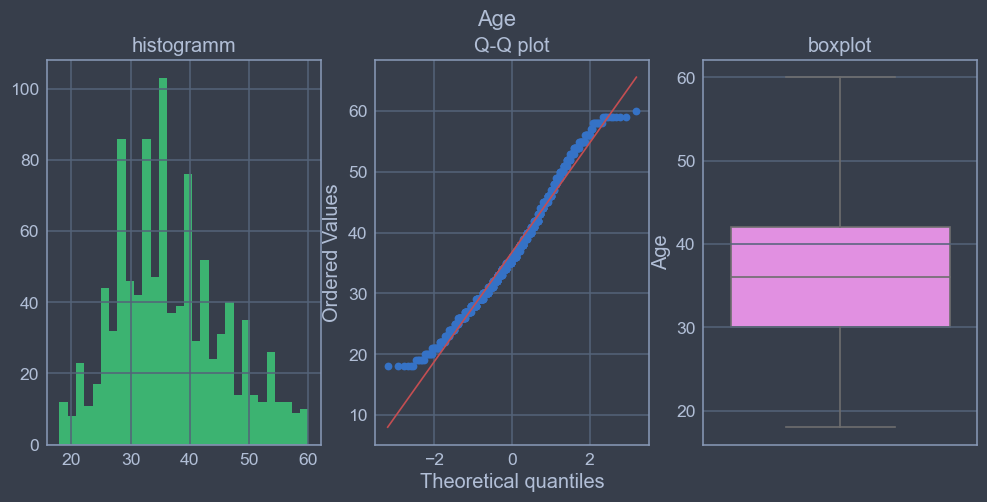

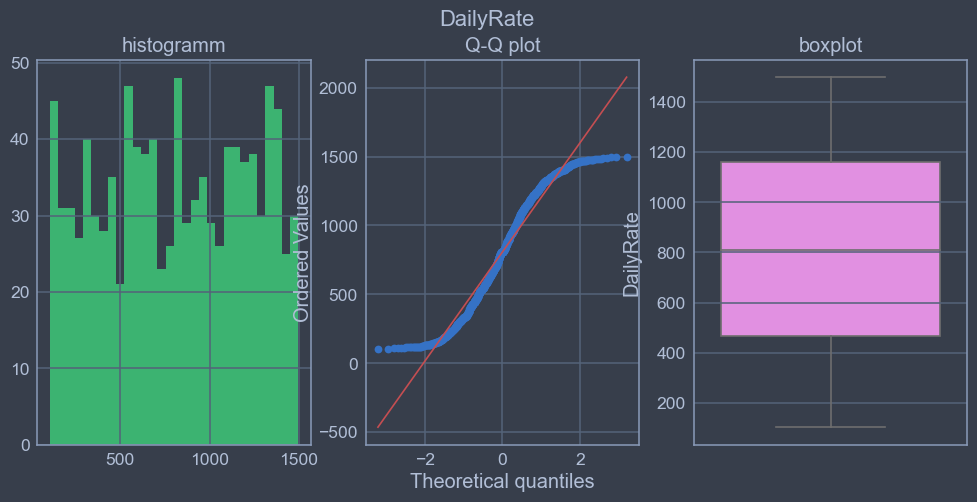

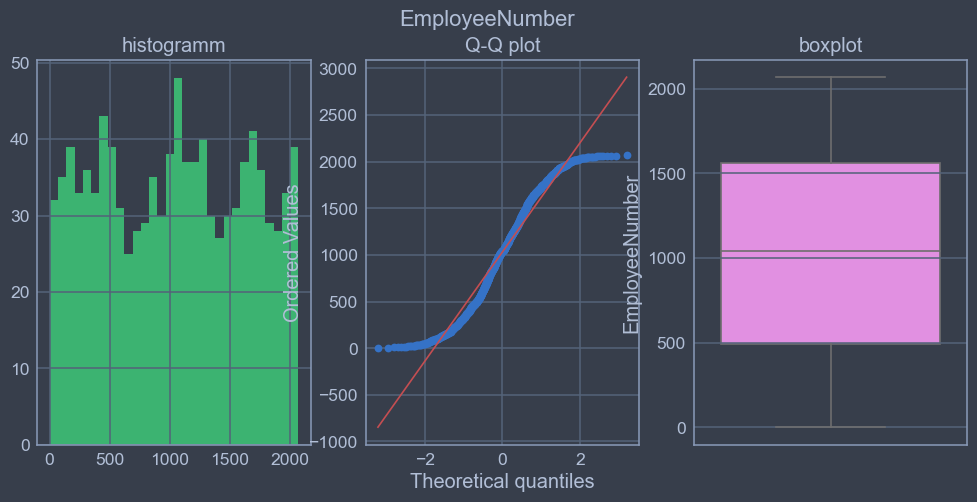

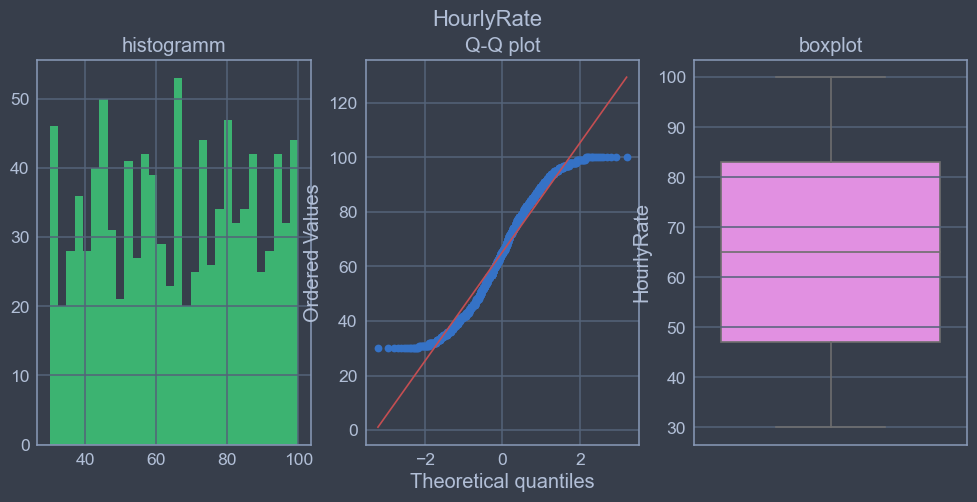

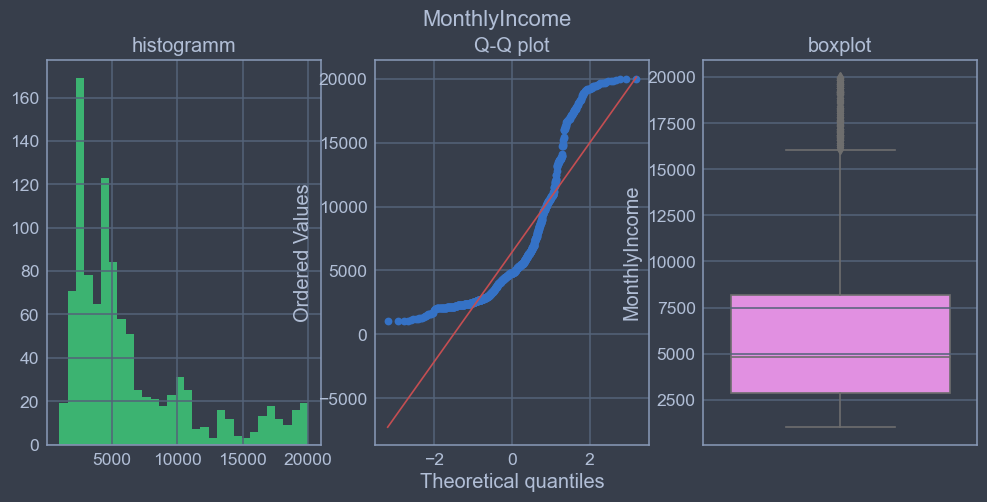

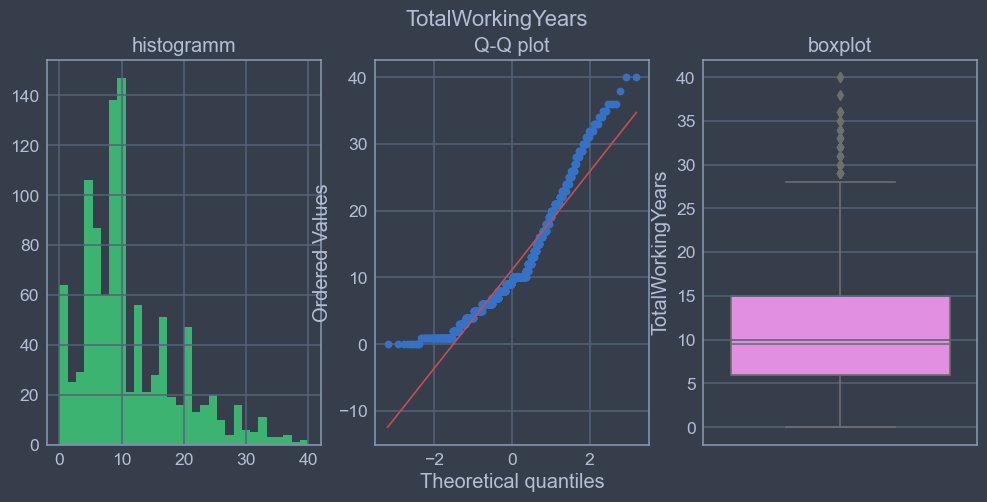

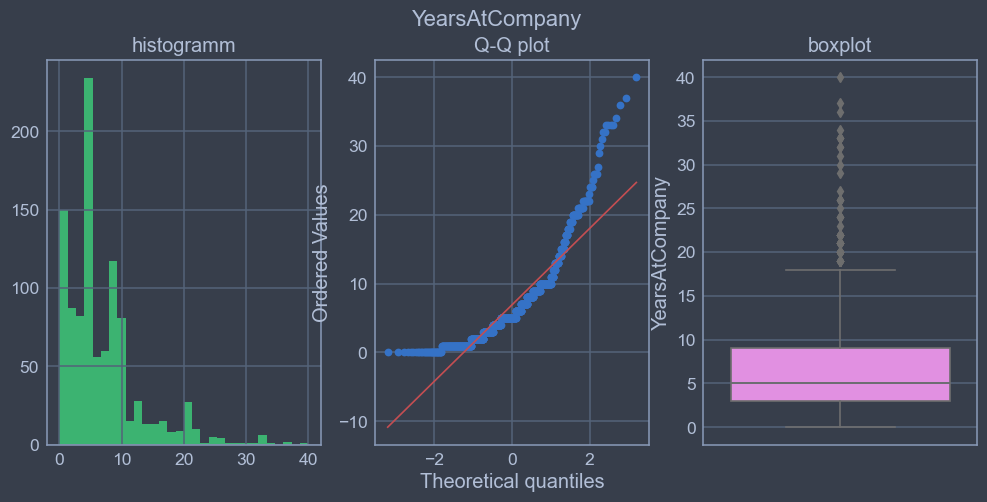

In [80]:
for col in vars_to_discretize:
    diagnostic_plots(X_train_median, col)

## Distribution after discretization

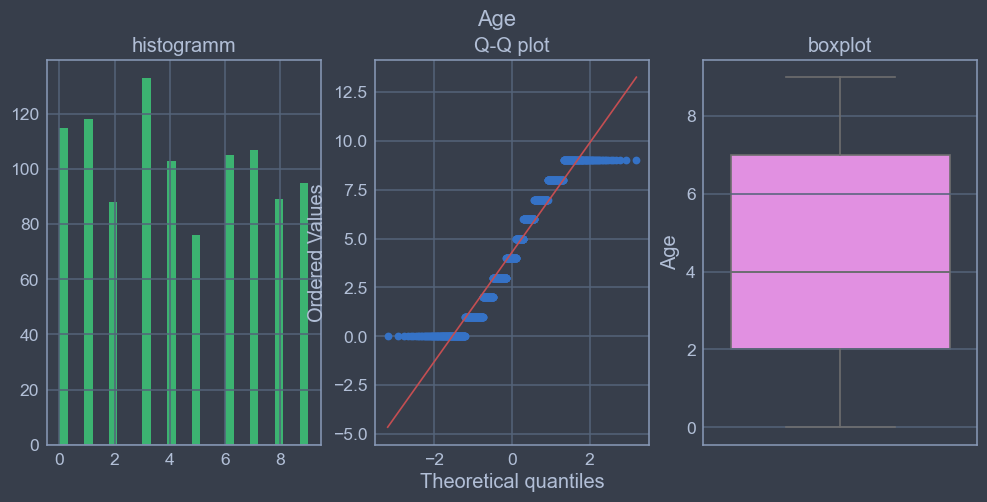

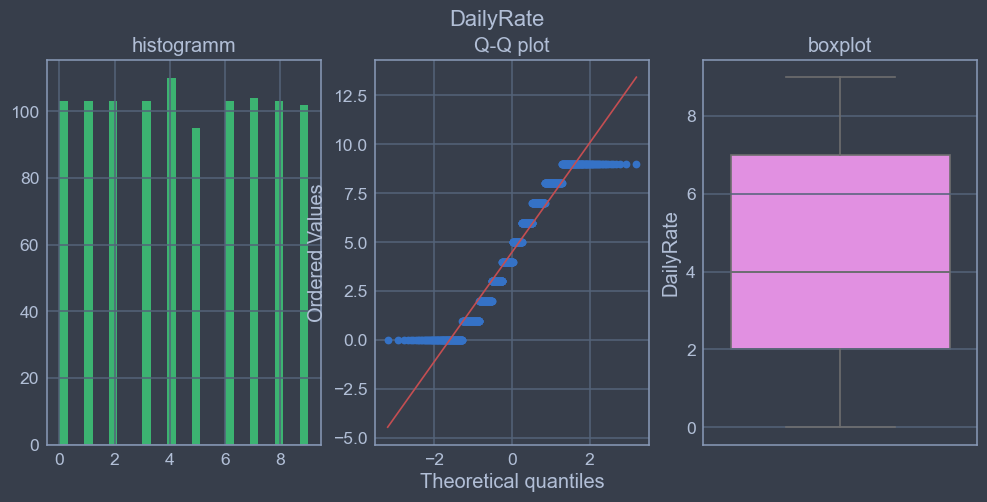

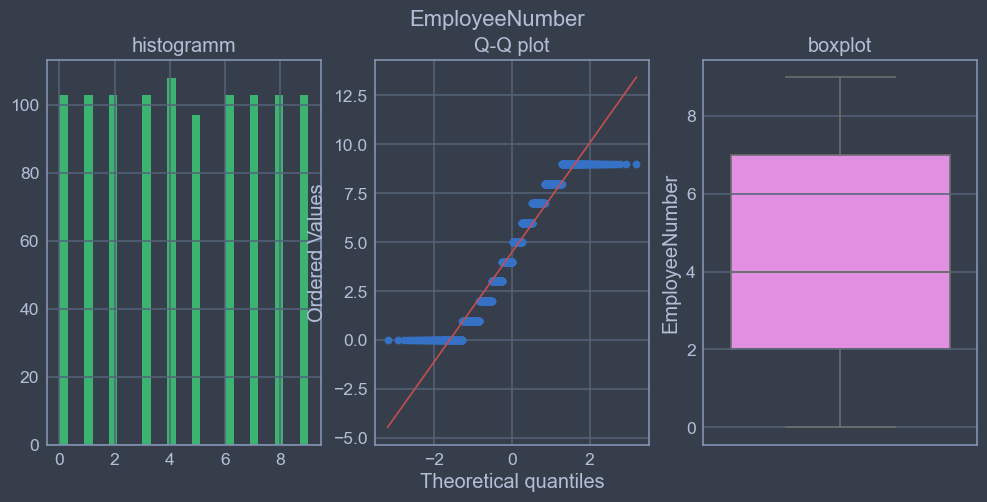

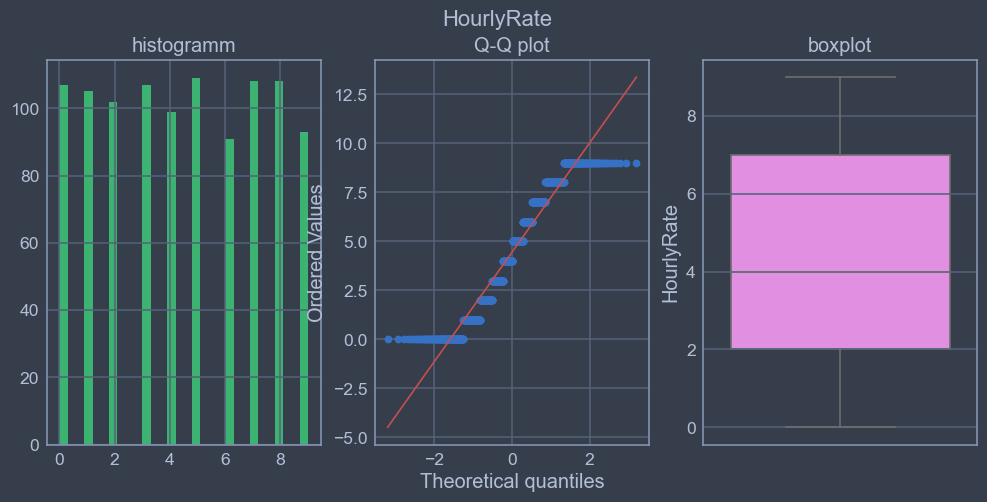

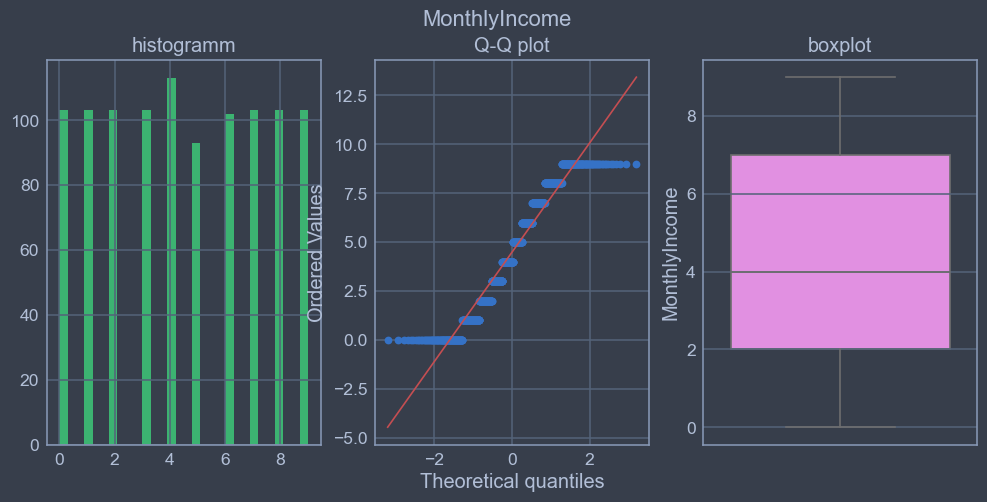

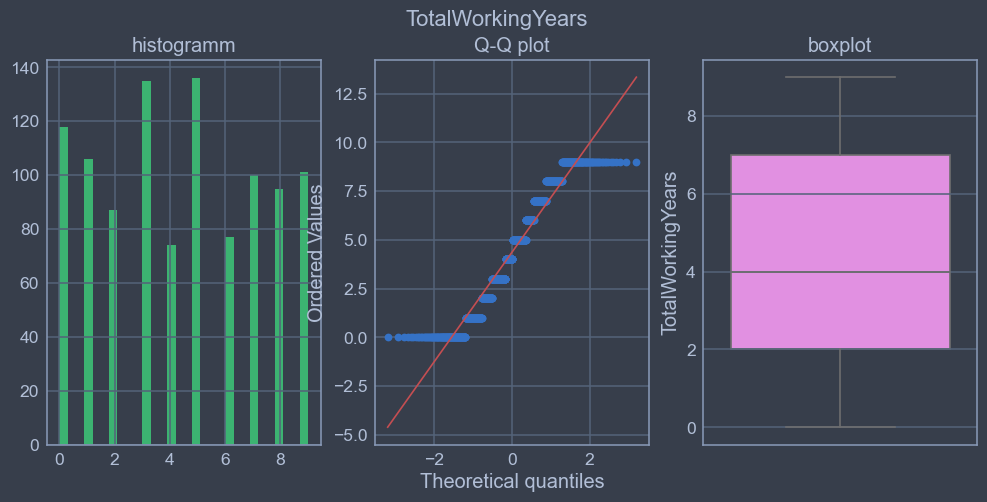

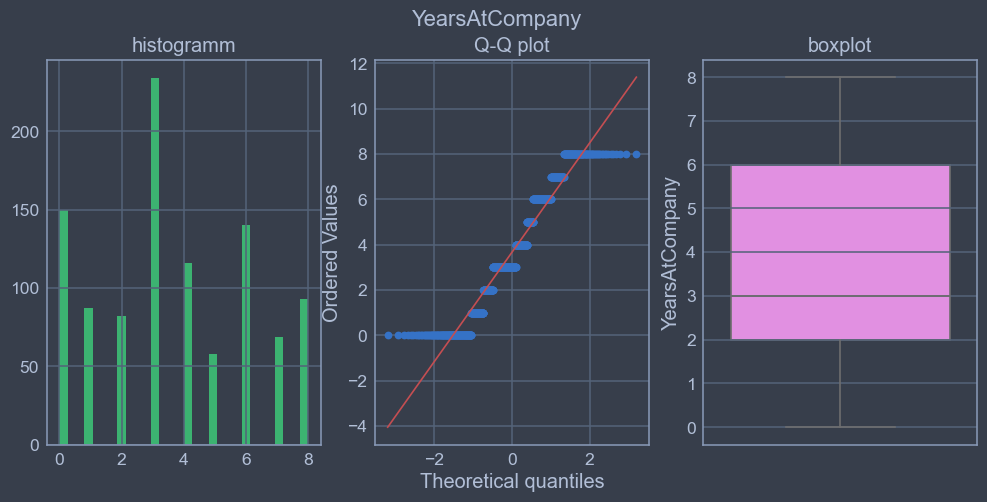

In [81]:
for col in vars_to_discretize:
    diagnostic_plots(X_train_median_discretized, col)

    It seems that after discretization we transformed continious variables into discrete ones and handled the outliers.
    
    We used EqualFrequencyDiscretiser because it can improve value distribution, handle outliers.

## Scaling

In [82]:
robust_scaler = RobustScaler()

In [83]:
X_train_robust = robust_scaler.fit_transform(X_train[num.columns])
X_test_robust = robust_scaler.transform(X_test[num.columns])

In [84]:
X_train_robust = pd.DataFrame(X_train_robust, columns = num.columns)
X_test_robust = pd.DataFrame(X_test_robust, columns = num.columns)

    We chose RobustScaler because it is popular method which can theoretically help to hide the outliers.

## Putting all steps into pipeline

In [85]:
preproccesing = Pipeline(steps = [
    #imputation
    ('imputation_num', MeanMedianImputer(imputation_method = 'median', variables = num.columns.tolist())),
    ('imputation_cat', CategoricalImputer(imputation_method = 'frequent', variables = cat_columns.tolist())),
    #encoding
    ('encoding_frequent', CountFrequencyEncoder(encoding_method = 'count', variables = countfrequency_variables)),
    ('encoding_onehot', OneHotEncoder(drop_last = True, variables = onehot_variables)),
    #discretization
    #('discretization', EqualFrequencyDiscretiser(variables = vars_to_discretize)),
    #scaling
    ('scaler', RobustScaler())
])

In [86]:
X_train_preproccesed = preproccesing.fit_transform(X_train)
X_train_preproccesed = pd.DataFrame(X_train_preproccesed, columns = X_train_frequentCatImput_frequencyEncod_onehot.columns)

X_test_preproccessed = preproccesing.transform(X_test)
X_test_preproccessed = pd.DataFrame(X_test_preproccessed, columns = X_test_frequentCatImput_frequencyEncod_onehot.columns)

In [87]:
X_train_preproccesed

,Age,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,...,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,BusinessTravel_Travel_Rarely,BusinessTravel_Travel_Frequently,Gender_Female,MaritalStatus_Divorced,MaritalStatus_Single,OverTime_No
0,-0.500000,-0.343391,-1.00000,-0.181818,0.0,-0.634441,0.0,-0.546435,0.5,-0.972222,...,0.833333,1.2,0.0,-0.2,0.0,0.0,1.0,1.0,0.0,0.0
1,-0.250000,-0.659483,-1.00000,-0.181818,0.0,-0.634441,0.0,-0.519231,0.5,-0.861111,...,-0.666667,-0.6,-0.5,-0.6,0.0,0.0,1.0,0.0,1.0,-1.0
2,0.750000,-0.030172,-1.69437,1.545455,0.5,0.000000,0.0,0.009850,-0.5,-0.805556,...,0.166667,0.0,-0.5,0.2,0.0,0.0,0.0,0.0,1.0,0.0
3,-0.666667,0.123563,0.00000,0.727273,-0.5,0.365559,0.0,0.059568,-1.0,-0.416667,...,-0.166667,-0.2,0.5,-0.2,0.0,0.0,0.0,1.0,0.0,0.0
4,-0.500000,0.160920,0.00000,-0.545455,0.0,0.365559,0.0,-0.218105,0.5,-0.750000,...,-0.500000,-0.2,-0.5,-0.2,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1024,-0.166667,0.752874,-1.00000,0.272727,0.5,0.365559,0.0,0.015478,0.0,0.611111,...,-0.666667,-0.4,-0.5,-0.6,0.0,0.0,1.0,0.0,0.0,-1.0
1025,-0.083333,-0.403736,-1.69437,0.090909,0.5,-0.688822,0.0,0.117730,0.0,0.972222,...,0.000000,0.2,0.0,0.2,0.0,0.0,0.0,0.0,1.0,0.0
1026,0.583333,0.531609,-1.00000,-0.454545,0.0,0.000000,0.0,0.626173,0.5,0.222222,...,0.833333,1.2,3.5,1.0,0.0,0.0,0.0,0.0,0.0,-1.0
1027,0.166667,-0.777299,0.00000,-0.454545,1.0,0.000000,0.0,-0.249062,0.5,0.750000,...,-0.666667,-0.6,-0.5,-0.4,0.0,0.0,0.0,0.0,0.0,-1.0


In [88]:
X_test_preproccessed

,Age,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,...,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,BusinessTravel_Travel_Rarely,BusinessTravel_Travel_Frequently,Gender_Female,MaritalStatus_Divorced,MaritalStatus_Single,OverTime_No
0,0.000000,-0.250000,-1.0,0.272727,0.5,0.000000,0.0,-0.418856,-0.5,-0.916667,...,0.833333,0.0,4.0,0.8,-1.0,0.0,0.0,0.0,1.0,0.0
1,-0.250000,-0.336207,0.0,1.636364,0.0,0.365559,0.0,0.475141,0.5,-0.583333,...,0.000000,0.0,-0.5,-0.2,0.0,0.0,0.0,0.0,1.0,0.0
2,-0.083333,-0.211207,-1.0,1.000000,0.5,-0.634441,0.0,0.320356,0.5,0.055556,...,-0.166667,-0.2,1.0,-0.2,-1.0,1.0,1.0,0.0,0.0,-1.0
3,0.333333,0.981322,0.0,1.181818,0.5,-0.688822,0.0,0.050188,0.0,-0.111111,...,1.000000,1.4,5.0,-0.4,0.0,0.0,0.0,0.0,0.0,0.0
4,-0.583333,-0.502874,0.0,1.545455,-0.5,0.365559,0.0,0.778143,0.5,0.222222,...,-0.666667,-0.6,0.0,-0.6,-1.0,1.0,0.0,0.0,1.0,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
436,0.000000,-0.850575,0.0,1.000000,0.5,0.365559,0.0,0.088649,-1.0,0.361111,...,1.000000,1.2,-0.5,1.2,-1.0,0.0,0.0,0.0,1.0,0.0
437,-0.416667,-0.689655,0.0,-0.545455,-0.5,0.365559,0.0,-0.477017,0.5,0.916667,...,-0.166667,-0.2,1.0,-0.2,0.0,0.0,0.0,0.0,0.0,0.0
438,0.333333,0.409483,-1.0,1.909091,0.0,-0.797583,0.0,-0.397280,0.0,-0.194444,...,-0.666667,-0.6,-0.5,-0.4,-1.0,0.0,0.0,1.0,0.0,0.0
439,1.333333,-0.704023,0.0,-0.363636,0.0,0.000000,0.0,-0.464822,0.5,-0.722222,...,0.000000,0.2,-0.5,0.2,0.0,0.0,0.0,0.0,0.0,-1.0


    It seems that everything words fine in the pipeline

# STEP 3: Feature selection

## Filtering methods

## Constant variables

### X_train

In [89]:
constant_selector = DropConstantFeatures(tol = 1, variables = None, missing_values = 'raise')
constant_selector.fit(X_train_preproccesed)
len(constant_selector.features_to_drop_)

2

In [90]:
X_train_preproccesed = constant_selector.transform(X_train_preproccesed)
X_test_preproccessed = constant_selector.transform(X_test_preproccessed)

## Quasi - Constant variables

In [91]:
constant_selector = DropConstantFeatures(tol = 0.97, variables = None, missing_values = 'raise')
constant_selector.fit(X_train_preproccesed)
len(constant_selector.features_to_drop_)

0

## Duplicated variables

In [92]:
duplicated_selector = DropDuplicateFeatures(variables = None, missing_values = 'ignore')
duplicated_selector.fit(X_train_preproccesed)
duplicated_selector.duplicated_feature_sets_

[]

## Correlated variables

In [93]:
correlated_selector = SmartCorrelatedSelection(
    variables=None,
    method = 'pearson',
    threshold = 0.8, 
    missing_values = 'ignore',
    selection_method = 'variance',
)

correlated_selector.fit(X_train_preproccesed)
len(correlated_selector.features_to_drop_)

1

In [94]:
X_train_preproccesed = correlated_selector.transform(X_train_preproccesed)
X_test_preproccessed = correlated_selector.transform(X_test_preproccessed)

## Wrapper methods

## Random forest feature selection

    We will use the feature selection by RFE which is Recursive Feature Elimination - wrapper-type feature selection algorithm using Random Forest algorithm

    RFE works by searching for a subset of features by starting with all features in the training dataset and successfully removing features until the desired number remains.

    This is achieved by fitting the given machine learning algorithm used in the core of the model, ranking features by importance, discarding the least important features, and re-fitting the model. This process is repeated until a specified number of features remains

### Training RandomForest

In [95]:
rf = RandomForestClassifier(random_state=0)

rf.fit(X_train_preproccesed, y_train)

RandomForestClassifier(random_state=0)

### Training RFE

In [96]:
rfe = RFE(estimator = rf, n_features_to_select = 15)

rfe.fit(X_train_preproccesed, y_train)

RFE(estimator=RandomForestClassifier(random_state=0), n_features_to_select=15)

In [97]:
X_train_preproccesed.columns

Index(['Age', 'DailyRate', 'Department', 'DistanceFromHome', 'Education',
       'EducationField', 'EmployeeNumber', 'EnvironmentSatisfaction',
       'HourlyRate', 'JobInvolvement', 'JobRole', 'JobSatisfaction',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager',
       'BusinessTravel_Travel_Rarely', 'BusinessTravel_Travel_Frequently',
       'Gender_Female', 'MaritalStatus_Divorced', 'MaritalStatus_Single',
       'OverTime_No'],
      dtype='object')

In [98]:
X_train_preproccesed.columns[rfe.get_support()]

Index(['Age', 'DailyRate', 'DistanceFromHome', 'EmployeeNumber',
       'EnvironmentSatisfaction', 'HourlyRate', 'JobRole', 'MonthlyIncome',
       'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike',
       'TotalWorkingYears', 'YearsAtCompany', 'YearsWithCurrManager',
       'OverTime_No'],
      dtype='object')

    We can see that only 10 features are being selected

## Puting all steps into pipeline

In [99]:
preproccesing_selector = Pipeline(steps = [
    #imputation
    ('imputation_num', MeanMedianImputer(imputation_method = 'median', variables = num.columns.tolist())),
    ('imputation_cat', CategoricalImputer(imputation_method = 'frequent', variables = cat_columns.tolist())),
    #encoding
    ('encoding_frequent', CountFrequencyEncoder(encoding_method = 'count', variables = countfrequency_variables)),
    ('encoding_onehot', OneHotEncoder(drop_last = True, variables = onehot_variables)),
    #discretization
    ('discretization', EqualFrequencyDiscretiser(variables = vars_to_discretize)),
    #scaleing
    ('scaler', RobustScaler()),
    #feature selection
    ('constant_selector', DropConstantFeatures(tol = 1, variables = None, missing_values = 'raise')),
    ('correlated_selector', SmartCorrelatedSelection(
                variables=None,
                method = 'pearson',
                threshold = 0.8, 
                missing_values = 'ignore',
                selection_method = 'variance',
    )),
    ('rfe', RFE(estimator = rf, n_features_to_select = 30))
])

In [100]:
X_train_preproccesed_selected = preproccesing_selector.fit_transform(X_train, y_train)
X_test_preproccesed_selected = preproccesing_selector.transform(X_test)

In [101]:
X_train_preproccesed_selected = pd.DataFrame(X_train_preproccesed_selected)
X_test_preproccesed_selected = pd.DataFrame(X_test_preproccesed_selected)

## Balancing Dataset

In [102]:
from collections import Counter

In [103]:
print(Counter(y_train))

Counter({0: 862, 1: 167})


In [104]:
Smote = SMOTE(k_neighbors = 3)
X_train_preproccesed_selected_smote, y_train_smote = Smote.fit_resample(X_train_preproccesed_selected, y_train)

In [105]:
print("SMOTE \n", Counter(y_train_smote))

SMOTE 
 Counter({0: 862, 1: 862})


In [106]:
under = RandomUnderSampler()
X_train_preproccesed_selected_under, y_train_under = under.fit_resample(X_train_preproccesed_selected, y_train)

In [107]:
print("UnderSample \n", Counter(y_train_under))

UnderSample 
 Counter({0: 167, 1: 167})


In [108]:
over = RandomOverSampler()
X_train_preproccesed_selected_over, y_train_over = over.fit_resample(X_train_preproccesed_selected, y_train)

In [109]:
print("OverSample \n", Counter(y_train_over))

OverSample 
 Counter({0: 862, 1: 862})


# STEP 4: Training ML algorithms

## Building  ML models

In [110]:
random_forest = RandomForestClassifier()
gradient_boost = GradientBoostingClassifier()
Knn = KNeighborsClassifier()
Svc = SVC(probability = True)
XGB = XGBClassifier()

models = {'RandomForest': random_forest,
          'GradientBoosting': gradient_boost,
          'KNN': Knn,
          'SVC': Svc,
          'XGB': XGB}

## Fitting the ML models (without feat selection)

In [111]:
train_preds_no_feat_sel = {}
test_preds_no_feat_sel = {}

for name, model in models.items():
    model.fit(X_train_preproccesed, y_train)
    #predictions for train set
    train_preds_no_feat_sel[name] = model.predict(X_train_preproccesed)
    #predictions for test set
    test_preds_no_feat_sel[name] = model.predict(X_test_preproccessed)

## Fitting the ML models (with feat selection)

In [112]:
train_preds_feat_sel = {}
test_preds_feat_sel = {}

for name, model in models.items():
    model.fit(X_train_preproccesed_selected, y_train)
    #predictions for train set
    train_preds_feat_sel[name] = model.predict(X_train_preproccesed_selected)
    #predictions for test set
    test_preds_feat_sel[name] = model.predict(X_test_preproccesed_selected)

# STEP 5: Result analysis

## Function to display results

In [113]:
def show_matrix_results(first_bar, first_bar_label, second_bar, second_bar_label, labels, width, plot_title):
    fig, ax = plt.subplots(figsize=(14,7), facecolor=(.94, .94, .94))
    plt.tight_layout()
    
    y = np.arange(len(labels))  # Label locations
    ax.barh(y + width/2, first_bar, width, label=first_bar_label, color='cornflowerblue')
    ax.barh(y - width/2, second_bar, width, label=second_bar_label, color='lightgreen')
    
    title = plt.title(plot_title, pad=20, fontsize=18, color = 'black')
    
    rects = ax.patches
    for rect in rects:
        x_value = rect.get_width()
        y_value = rect.get_y() + rect.get_height() / 2
        space = 5
        ha = 'left'
        plt.annotate(
            np.round(x_value, 3),                      
            (x_value, y_value),         
            xytext=(space, 0),          
            textcoords='offset points',
            va='center',                
            ha=ha,)
    
    ax.set_yticklabels(labels, color = 'black')
    leg = plt.legend(loc='best')

    
    plt.yticks(np.arange(min(y), max(y)+1, 1.0))

## Accuracy (without feat selection)

In [114]:
accuracy_scores_train_no_feat_sel = {}
accuracy_scores_test_no_feat_sel = {}

def accuracy_scores(y_train, y_test, train_preds, test_preds):
    accuracy_train = {}
    accuracy_test = {}
    for name, predict in train_preds.items():
        accuracy_train[name] = accuracy_score(y_train, predict)
    for name, predict in test_preds.items():
        accuracy_test[name] = accuracy_score(y_test, predict)
    return accuracy_train, accuracy_test

accuracy_scores_train_no_feat_sel, accuracy_scores_test_no_feat_sel = accuracy_scores(y_train, y_test, train_preds_no_feat_sel, test_preds_no_feat_sel)
accuracy_scores_train_no_feat_sel, accuracy_scores_test_no_feat_sel

({'RandomForest': 1.0,
  'GradientBoosting': 0.9650145772594753,
  'KNN': 0.86977648202138,
  'SVC': 0.8969873663751214,
  'XGB': 1.0},
 {'RandomForest': 0.8594104308390023,
  'GradientBoosting': 0.8616780045351474,
  'KNN': 0.8503401360544217,
  'SVC': 0.854875283446712,
  'XGB': 0.8571428571428571})

C:\Users\Kim Stanislav\AppData\Local\Temp\ipykernel_14780\21241256.py:25: UserWarning:

FixedFormatter should only be used together with FixedLocator



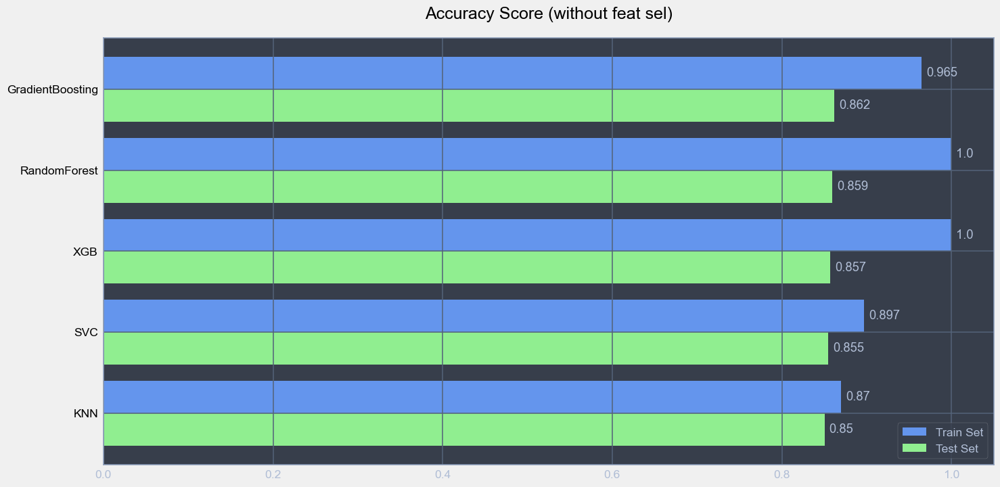

In [115]:
accuracy_scores_test_no_feat_sel = dict(sorted(accuracy_scores_test_no_feat_sel.items(), key=lambda item: item[1]))
sorted_keys = accuracy_scores_test_no_feat_sel.keys()
accuracy_scores_train_no_feat_sel = {key:accuracy_scores_train_no_feat_sel[key] for key in sorted_keys}

first_bar = list(accuracy_scores_train_no_feat_sel.values())
first_bar_label = 'Train Set'
second_bar = list(accuracy_scores_test_no_feat_sel.values())
second_bar_label = 'Test Set'
labels = list(accuracy_scores_train_no_feat_sel.keys())
width = 0.4
plot_title = 'Accuracy Score (without feat sel)'

show_matrix_results(first_bar, first_bar_label, second_bar, second_bar_label, labels, width, plot_title)  

## Accuracy (with feat selection)

In [116]:
accuracy_scores_train_feat_sel = {}
accuracy_scores_test_feat_sel = {}

accuracy_scores_train_feat_sel, accuracy_scores_test_feat_sel = accuracy_scores(y_train, y_test, train_preds_feat_sel, test_preds_feat_sel)
accuracy_scores_train_feat_sel, accuracy_scores_test_feat_sel

({'RandomForest': 1.0,
  'GradientBoosting': 0.9611273080660836,
  'KNN': 0.8707482993197279,
  'SVC': 0.901846452866861,
  'XGB': 1.0},
 {'RandomForest': 0.8616780045351474,
  'GradientBoosting': 0.8616780045351474,
  'KNN': 0.8480725623582767,
  'SVC': 0.8526077097505669,
  'XGB': 0.8707482993197279})

C:\Users\Kim Stanislav\AppData\Local\Temp\ipykernel_14780\21241256.py:25: UserWarning:

FixedFormatter should only be used together with FixedLocator



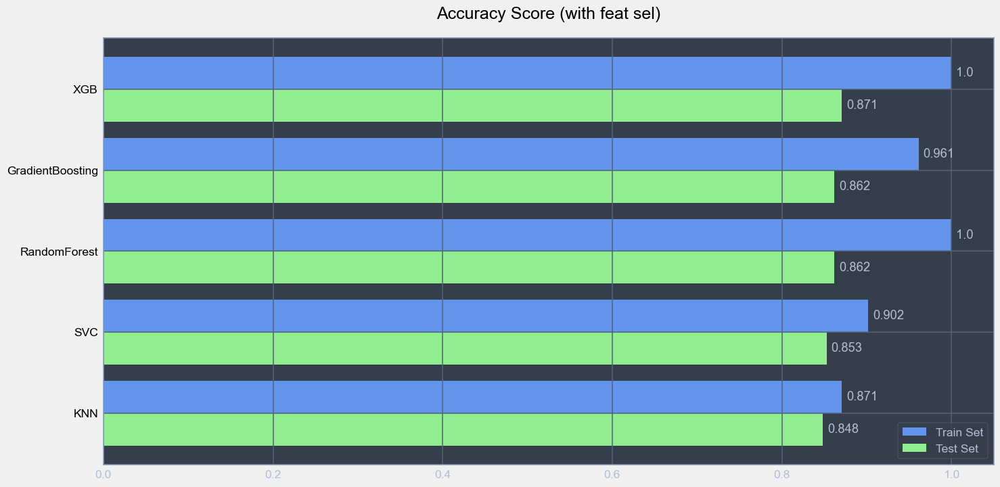

In [117]:
accuracy_scores_test_feat_sel = dict(sorted(accuracy_scores_test_feat_sel.items(), key=lambda item: item[1]))
sorted_keys = accuracy_scores_test_feat_sel.keys()
accuracy_scores_train_feat_sel = {key:accuracy_scores_train_feat_sel[key] for key in sorted_keys}

first_bar = list(accuracy_scores_train_feat_sel.values())
first_bar_label = 'Train Set'
second_bar = list(accuracy_scores_test_feat_sel.values())
second_bar_label = 'Test Set'
labels = list(accuracy_scores_train_feat_sel.keys())
width = 0.4
plot_title = 'Accuracy Score (with feat sel)'

show_matrix_results(first_bar, first_bar_label, second_bar, second_bar_label, labels, width, plot_title)  

    We can see that it is better to use feature selection methods with choosing only 25 features because the performance is better and more stable compared to the results without feature selection.
    
    It also better to use feature selection because we decrease dimensionality of the dataset using only important features.

## Classification Report (feat sel)

In [118]:
print('Random Forest (feat sel)')
print()
print(classification_report(y_test, test_preds_feat_sel['RandomForest']))

Random Forest (feat sel)

              precision    recall  f1-score   support

           0       0.86      0.99      0.92       371
           1       0.85      0.16      0.27        70

    accuracy                           0.86       441
   macro avg       0.85      0.58      0.59       441
weighted avg       0.86      0.86      0.82       441



In [119]:
print('SVC (feat sel)')
print()
print(classification_report(y_test, test_preds_feat_sel['SVC']))

SVC (feat sel)

              precision    recall  f1-score   support

           0       0.86      0.99      0.92       371
           1       0.73      0.11      0.20        70

    accuracy                           0.85       441
   macro avg       0.79      0.55      0.56       441
weighted avg       0.84      0.85      0.80       441



In [120]:
print('GradientBoosting (feat sel)')
print()
print(classification_report(y_test, test_preds_feat_sel['GradientBoosting']))

GradientBoosting (feat sel)

              precision    recall  f1-score   support

           0       0.88      0.97      0.92       371
           1       0.64      0.30      0.41        70

    accuracy                           0.86       441
   macro avg       0.76      0.63      0.66       441
weighted avg       0.84      0.86      0.84       441



## Classification Report (feat sel + balancing)

In [121]:
train_preds_feat_sel_bal = {}
test_preds_feat_sel_bal = {}

for name, model in models.items():
    model.fit(X_train_preproccesed_selected_over, y_train_over)
    #predictions for train set
    train_preds_feat_sel_bal[name] = model.predict(X_train_preproccesed_selected_over)
    #predictions for test set
    test_preds_feat_sel_bal[name] = model.predict(X_test_preproccesed_selected)

In [122]:
print('RandomForest (feat sel + balancing)')
print()
print(classification_report(y_test, test_preds_feat_sel_bal['RandomForest']))

RandomForest (feat sel + balancing)

              precision    recall  f1-score   support

           0       0.87      0.98      0.92       371
           1       0.65      0.21      0.32        70

    accuracy                           0.86       441
   macro avg       0.76      0.60      0.62       441
weighted avg       0.83      0.86      0.83       441



In [123]:
print('SVC (feat sel + balancing)')
print()
print(classification_report(y_test, test_preds_feat_sel_bal['SVC']))

SVC (feat sel + balancing)

              precision    recall  f1-score   support

           0       0.92      0.91      0.92       371
           1       0.56      0.60      0.58        70

    accuracy                           0.86       441
   macro avg       0.74      0.76      0.75       441
weighted avg       0.87      0.86      0.86       441



In [124]:
print('GradientBoosting (feat sel + balancing)')
print()
print(classification_report(y_test, test_preds_feat_sel_bal['GradientBoosting']))

GradientBoosting (feat sel + balancing)

              precision    recall  f1-score   support

           0       0.90      0.88      0.89       371
           1       0.42      0.47      0.45        70

    accuracy                           0.81       441
   macro avg       0.66      0.68      0.67       441
weighted avg       0.82      0.81      0.82       441



## Accuracy (feat sel + balancing)

In [125]:
accuracy_scores_train_feat_sel_bal = {}
accuracy_scores_test_feat_sel_bal = {}

accuracy_scores_train_feat_sel_bal, accuracy_scores_test_feat_sel_bal = accuracy_scores(y_train_over, y_test, train_preds_feat_sel_bal, test_preds_feat_sel)
accuracy_scores_train_feat_sel_bal, accuracy_scores_test_feat_sel_bal

({'RandomForest': 1.0,
  'GradientBoosting': 0.9547563805104409,
  'KNN': 0.9013921113689095,
  'SVC': 0.9547563805104409,
  'XGB': 1.0},
 {'RandomForest': 0.8616780045351474,
  'GradientBoosting': 0.8616780045351474,
  'KNN': 0.8480725623582767,
  'SVC': 0.8526077097505669,
  'XGB': 0.8707482993197279})

C:\Users\Kim Stanislav\AppData\Local\Temp\ipykernel_14780\21241256.py:25: UserWarning:

FixedFormatter should only be used together with FixedLocator



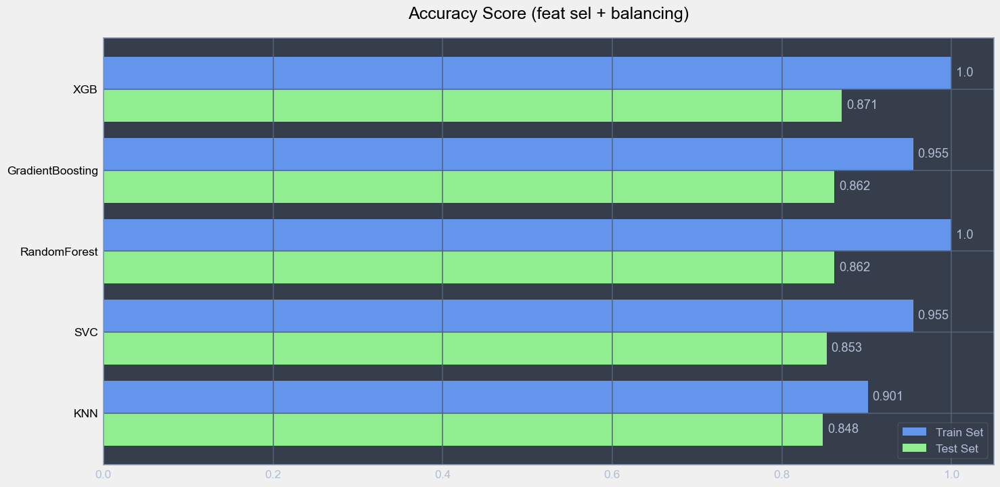

In [126]:
accuracy_scores_test_feat_sel_bal = dict(sorted(accuracy_scores_test_feat_sel_bal.items(), key=lambda item: item[1]))
sorted_keys = accuracy_scores_test_feat_sel_bal.keys()
accuracy_scores_train_feat_sel_bal = {key:accuracy_scores_train_feat_sel_bal[key] for key in sorted_keys}

first_bar = list(accuracy_scores_train_feat_sel_bal.values())
first_bar_label = 'Train Set'
second_bar = list(accuracy_scores_test_feat_sel_bal.values())
second_bar_label = 'Test Set'
labels = list(accuracy_scores_train_feat_sel_bal.keys())
width = 0.4
plot_title = 'Accuracy Score (feat sel + balancing)'

show_matrix_results(first_bar, first_bar_label, second_bar, second_bar_label, labels, width, plot_title)  

    We can see that using balancing on the dataset, leads to more overfitting
    
    We will use feature selection without balancing.

# STEP 6: Fine-tuning hyperparameters of short-list models

## Setting parameters

In [127]:
param_grid_gradient_boost = {
    'n_estimators': [150, 200, 300], 
    'learning_rate': [0.001, 0.01, 0.1],
    'max_depth': [1, 2, 3, 4]
}

param_grid_SVC = {
    'C': [0.5, 1.0, 1.5],
    'tol': [1e-1, 1e-2, 1e-3, 1e-4],
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid']
}

## Building GridSearchCV

In [128]:
grid_search_gradient_boost = GridSearchCV(
    gradient_boost, 
    param_grid_gradient_boost,
    cv = 7,
    n_jobs = -1,
    scoring = 'accuracy'
)

grid_search_SVC = GridSearchCV(
    Svc, 
    param_grid_SVC,
    cv = 7,
    n_jobs = -1,
    scoring = 'accuracy'
)

grid_search_dict = {
    'Gradient_boost': grid_search_gradient_boost,
    'SVC': grid_search_SVC
}

## Fitting GridSearchCV

In [129]:
grid_search_best_params = {}

for name, grid_search in grid_search_dict.items():
    grid_search.fit(X_train_preproccesed_selected, y_train)
    print('Best parameters for {0}: {1}'.format(name, grid_search.best_params_))
    print('Accuracy for {0}: {1}'.format(name, grid_search.best_score_))
    print()
    print('=' * 60)
    print()
    grid_search_best_params[name] = grid_search.best_params_

Best parameters for Gradient_boost: {'learning_rate': 0.1, 'max_depth': 1, 'n_estimators': 300}
Accuracy for Gradient_boost: 0.8775510204081632


Best parameters for SVC: {'C': 1.0, 'kernel': 'linear', 'tol': 0.1}
Accuracy for SVC: 0.8833819241982507




# STEP 7: Result analysis of models with tuned hyperparameters

## Assigning models with tuned hyperparameters

In [130]:
Gradient_boost = grid_search_gradient_boost.best_estimator_
Svc = grid_search_SVC.best_estimator_

## Making predictions

In [131]:
models_dict = {
    'Gradient_boost': Gradient_boost,
    'SVC': Svc
}

train_preds = {}
test_preds = {}

train_proba_pred = {}
test_proba_pred = {}

for name, model in models_dict.items():
    #predictions for train set
    train_preds[name] = model.predict(X_train_preproccesed_selected)
    train_proba_pred[name] = model.predict_proba(X_train_preproccesed_selected)
    #predictions for test set
    test_preds[name] = model.predict(X_test_preproccesed_selected)
    test_proba_pred[name] = model.predict_proba(X_test_preproccesed_selected)

# STEP 8: Displaying results of evaluation metrics

## Classification Report

In [132]:
classification_report_train = {}
classification_report_test = {}

def classification_report_scores(y_train, y_test, train_preds, test_preds):
    for name, predict in train_preds.items():
        print(name + ' train set', "\n", classification_report(y_train, predict, zero_division = 0), "\n")
    print('=' * 60)
    print()
    for name, predict in test_preds.items():
        print(name + ' test set', "\n", classification_report(y_test, predict, zero_division = 0), "\n")

classification_report_scores(y_train, y_test, train_preds, test_preds)

Gradient_boost train set 
               precision    recall  f1-score   support

           0       0.89      0.99      0.94       862
           1       0.88      0.36      0.51       167

    accuracy                           0.89      1029
   macro avg       0.89      0.68      0.72      1029
weighted avg       0.89      0.89      0.87      1029
 

SVC train set 
               precision    recall  f1-score   support

           0       0.89      0.98      0.93       862
           1       0.82      0.37      0.51       167

    accuracy                           0.88      1029
   macro avg       0.86      0.68      0.72      1029
weighted avg       0.88      0.88      0.86      1029
 


Gradient_boost test set 
               precision    recall  f1-score   support

           0       0.88      0.98      0.93       371
           1       0.78      0.30      0.43        70

    accuracy                           0.88       441
   macro avg       0.83      0.64      0.68       441


## Confusion matrix

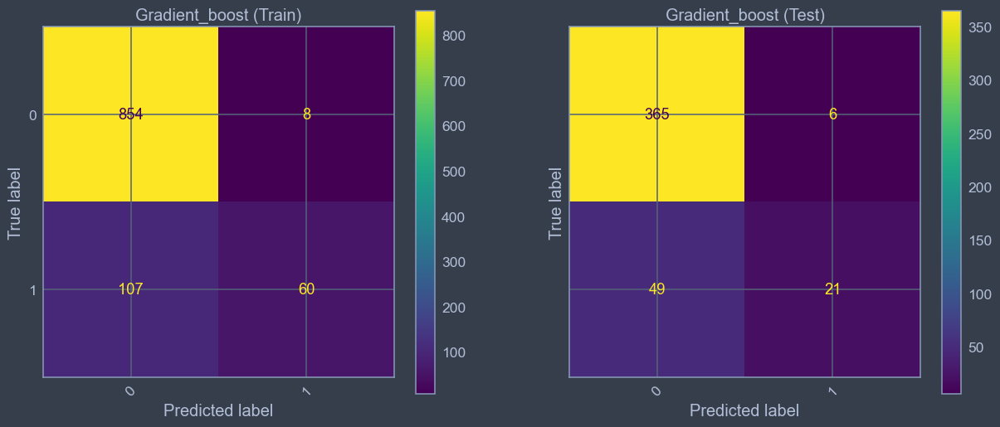

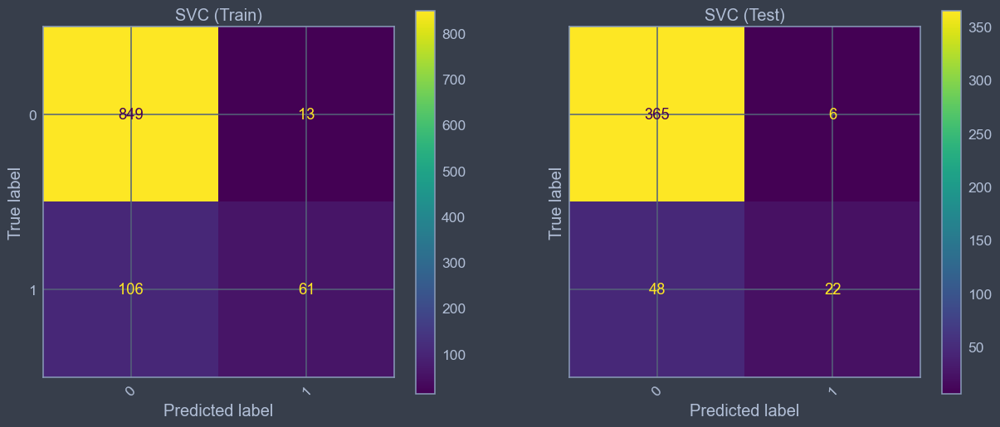

In [133]:
def draw_confusion_matrix(models, y_tr, y_te, train_pred, test_pred):
    for name, result in models.items():
        f, axes = plt.subplots(1, 2, figsize=(15, 6), sharey='row')
        
        for i in range(2):
            if i == 0:
                cf_matrix = confusion_matrix(y_tr, train_pred[name])
                title = name + ' (Train)'
            elif i == 1:
                cf_matrix = confusion_matrix(y_te, test_pred[name])
                title = name + ' (Test)'
            disp = ConfusionMatrixDisplay(cf_matrix)
            disp.plot(ax = axes[i], xticks_rotation=45)
            disp.ax_.set_title(title)
            
draw_confusion_matrix(models_dict, y_train, y_test, train_preds, test_preds)

## Precision

In [134]:
precision_scores_train = {}
precision_scores_test = {}

def precision_scores(train_preds, test_preds):
    for name, predict in train_preds.items():
        precision_scores_train[name] = precision_score(y_train, predict, zero_division = 0)
    for name, predict in test_preds.items():
        precision_scores_test[name] = precision_score(y_test, predict, zero_division = 0)
    return precision_scores_train, precision_scores_test

precision_scores_train, precision_scores_test = precision_scores(train_preds, test_preds)
precision_scores_train, precision_scores_test

({'Gradient_boost': 0.8823529411764706, 'SVC': 0.8243243243243243},
 {'Gradient_boost': 0.7777777777777778, 'SVC': 0.7857142857142857})

C:\Users\Kim Stanislav\AppData\Local\Temp\ipykernel_14780\21241256.py:25: UserWarning:

FixedFormatter should only be used together with FixedLocator



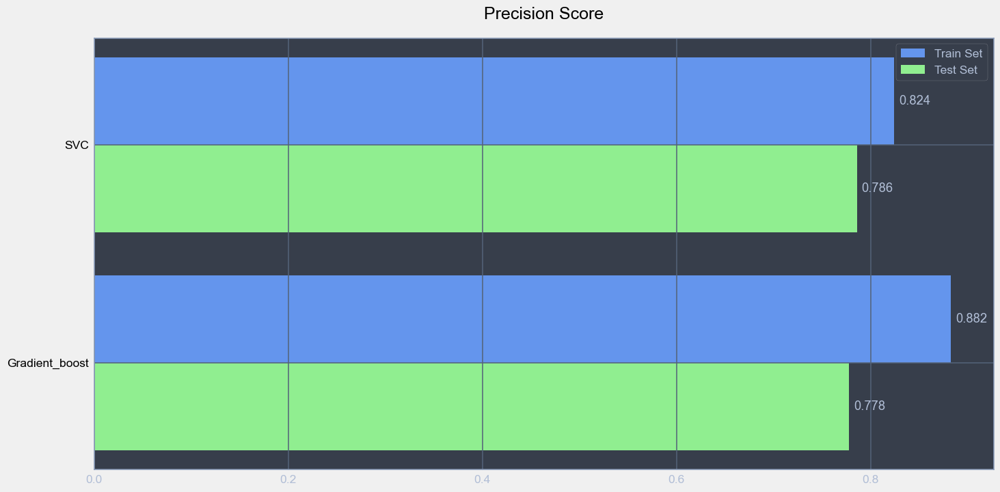

In [135]:
precision_scores_test = dict(sorted(precision_scores_test.items(), key=lambda item: item[1]))
sorted_keys = precision_scores_test.keys()
precision_scores_train = {key:precision_scores_train[key] for key in sorted_keys}

first_bar = list(precision_scores_train.values())
first_bar_label = 'Train Set'
second_bar = list(precision_scores_test.values())
second_bar_label = 'Test Set'
labels = list(precision_scores_train.keys())
width = 0.4
plot_title = 'Precision Score'

show_matrix_results(first_bar, first_bar_label, second_bar, second_bar_label, labels, width, plot_title)  

## Recall

In [136]:
recall_scores_train = {}
recall_scores_test = {}

def recall_scores(y_train, y_test, train_preds, test_preds):
    for name, predict in train_preds.items():
        recall_scores_train[name] = recall_score(y_train, predict)
    for name, predict in test_preds.items():
        recall_scores_test[name] = recall_score(y_test, predict)
    return recall_scores_train, recall_scores_test

recall_scores_train, recall_scores_test = recall_scores(y_train, y_test, train_preds, test_preds)
recall_scores_train, recall_scores_test

({'Gradient_boost': 0.3592814371257485, 'SVC': 0.3652694610778443},
 {'Gradient_boost': 0.3, 'SVC': 0.3142857142857143})

C:\Users\Kim Stanislav\AppData\Local\Temp\ipykernel_14780\21241256.py:25: UserWarning:

FixedFormatter should only be used together with FixedLocator



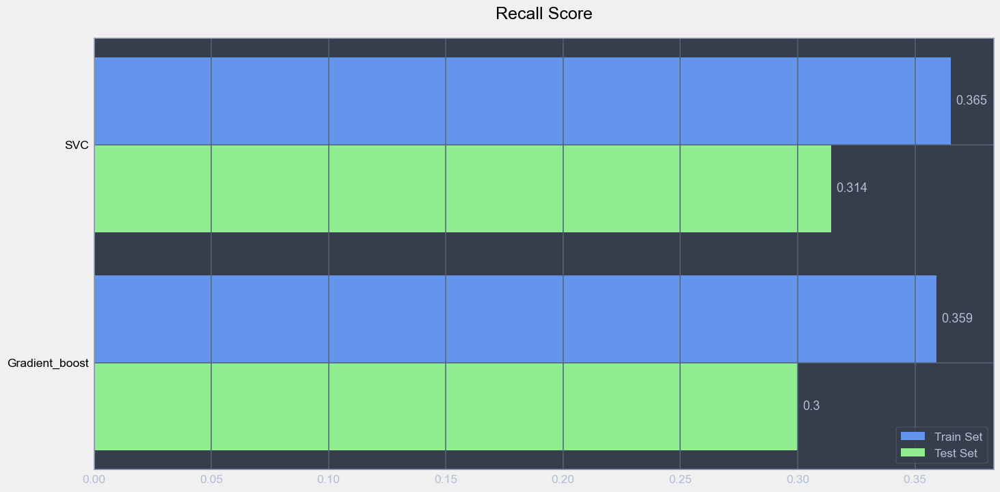

In [137]:
recall_scores_test = dict(sorted(recall_scores_test.items(), key=lambda item: item[1]))
sorted_keys = recall_scores_test.keys()
recall_scores_train = {key:recall_scores_train[key] for key in sorted_keys}

first_bar = list(recall_scores_train.values())
first_bar_label = 'Train Set'
second_bar = list(recall_scores_test.values())
second_bar_label = 'Test Set'
labels = list(recall_scores_train.keys())
width = 0.4
plot_title = 'Recall Score'

show_matrix_results(first_bar, first_bar_label, second_bar, second_bar_label, labels, width, plot_title)  

## F1

In [138]:
f1_scores_train = {}
f1_scores_test = {}

def f1_scores(y_train, y_test, train_preds, test_preds):
    for name, predict in train_preds.items():
        f1_scores_train[name] = f1_score(y_train, predict)
    for name, predict in test_preds.items():
        f1_scores_test[name] = f1_score(y_test, predict)
    return f1_scores_train, f1_scores_test

f1_scores_train, f1_scores_test = f1_scores(y_train, y_test, train_preds, test_preds)
f1_scores_train, f1_scores_test

({'Gradient_boost': 0.5106382978723405, 'SVC': 0.5062240663900415},
 {'Gradient_boost': 0.4329896907216495, 'SVC': 0.44897959183673464})

C:\Users\Kim Stanislav\AppData\Local\Temp\ipykernel_14780\21241256.py:25: UserWarning:

FixedFormatter should only be used together with FixedLocator



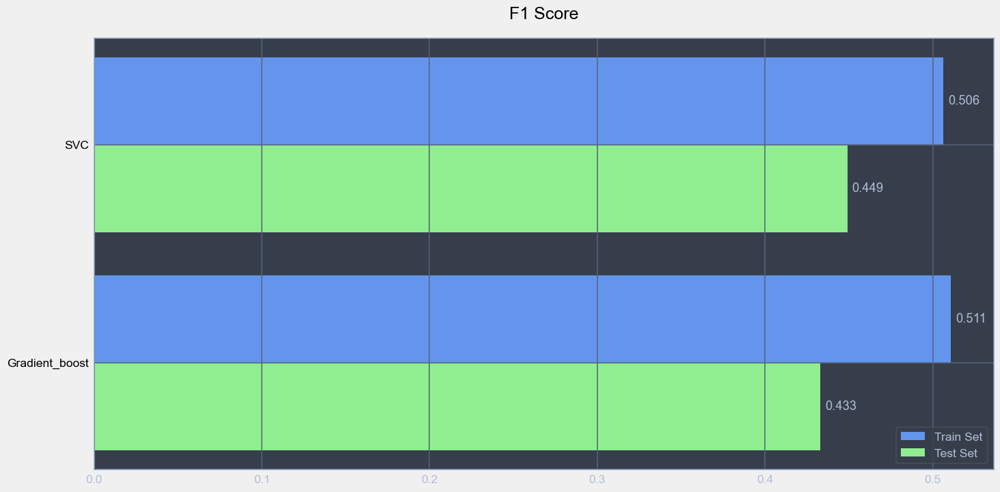

In [139]:
f1_scores_test = dict(sorted(f1_scores_test.items(), key=lambda item: item[1]))
sorted_keys = f1_scores_test.keys()
f1_scores_train = {key:f1_scores_train[key] for key in sorted_keys}

first_bar = list(f1_scores_train.values())
first_bar_label = 'Train Set'
second_bar = list(f1_scores_test.values())
second_bar_label = 'Test Set'
labels = list(f1_scores_train.keys())
width = 0.4
plot_title = 'F1 Score'

show_matrix_results(first_bar, first_bar_label, second_bar, second_bar_label, labels, width, plot_title) 

## Accuracy

In [140]:
accuracy_scores_train = {}
accuracy_scores_test = {}

accuracy_scores_train, accuracy_scores_test = accuracy_scores(y_train, y_test, train_preds, test_preds)
accuracy_scores_train, accuracy_scores_test

({'Gradient_boost': 0.8882410106899903, 'SVC': 0.8843537414965986},
 {'Gradient_boost': 0.8752834467120182, 'SVC': 0.8775510204081632})

C:\Users\Kim Stanislav\AppData\Local\Temp\ipykernel_14780\21241256.py:25: UserWarning:

FixedFormatter should only be used together with FixedLocator



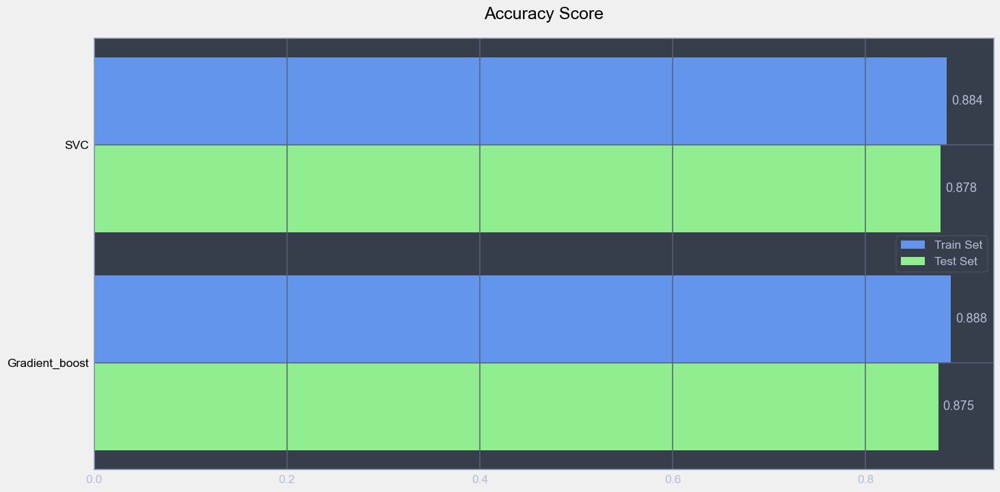

In [141]:
accuracy_scores_test = dict(sorted(accuracy_scores_test.items(), key=lambda item: item[1]))
sorted_keys = accuracy_scores_test.keys()
accuracy_scores_train = {key:accuracy_scores_train[key] for key in sorted_keys}

first_bar = list(accuracy_scores_train.values())
first_bar_label = 'Train Set'
second_bar = list(accuracy_scores_test.values())
second_bar_label = 'Test Set'
labels = list(accuracy_scores_train.keys())
width = 0.4
plot_title = 'Accuracy Score'

show_matrix_results(first_bar, first_bar_label, second_bar, second_bar_label, labels, width, plot_title)  

## Roc-auc

In [142]:
roc_auc_scores_train = {}
roc_auc_scores_test = {}

def roc_auc_scores(train_proba_pred, test_proba_pred):
    for name, predict in train_proba_pred.items():
        roc_auc_scores_train[name] = roc_auc_score(y_train, predict[:, 1])
    for name, predict in test_proba_pred.items():
        roc_auc_scores_test[name] = roc_auc_score(y_test, predict[:, 1])
    return roc_auc_scores_train, roc_auc_scores_test

roc_auc_scores_train, roc_auc_scores_test = roc_auc_scores(train_proba_pred, test_proba_pred)
roc_auc_scores_train, roc_auc_scores_test

({'Gradient_boost': 0.8918682356863998, 'SVC': 0.8462772830209652},
 {'Gradient_boost': 0.8264921062764728, 'SVC': 0.8693685021178282})

C:\Users\Kim Stanislav\AppData\Local\Temp\ipykernel_14780\21241256.py:25: UserWarning:

FixedFormatter should only be used together with FixedLocator



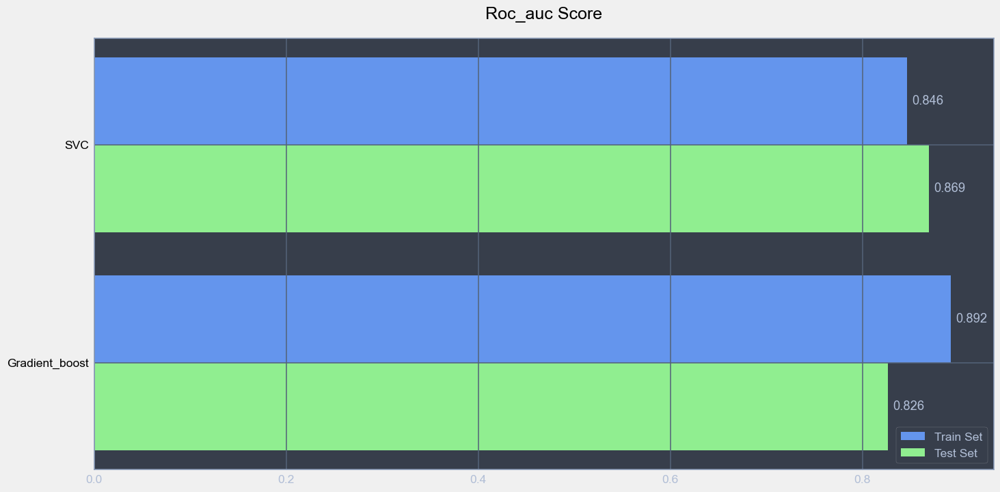

In [143]:
roc_auc_scores_test = dict(sorted(roc_auc_scores_test.items(), key=lambda item: item[1]))
sorted_keys = roc_auc_scores_test.keys()
roc_auc_scores_train = {key:roc_auc_scores_train[key] for key in sorted_keys}

first_bar = list(roc_auc_scores_train.values())
first_bar_label = 'Train Set'
second_bar = list(roc_auc_scores_test.values())
second_bar_label = 'Test Set'
labels = list(roc_auc_scores_train.keys())
width = 0.4
plot_title = 'Roc_auc Score'

show_matrix_results(first_bar, first_bar_label, second_bar, second_bar_label, labels, width, plot_title) 

# STEP 9: Training ANN (Artificial Neural Networks)

## Callbacks

In [144]:
checkpoint = ModelCheckpoint(
    filepath = './base/HR_ANN_weights.h5py',
    monitor = 'val_loss',
    verbose = 1,
    save_best_only = True,
    save_weights_only = True,
    save_freq = 'epoch'
)

earlyStop = EarlyStopping(
    monitor = 'val_loss',
    min_delta = 0.001,
    patience = 50,
    verbose = 1,
)

callbacks = [checkpoint, earlyStop]

## Building the ANN

In [242]:
model = tf.keras.models.Sequential()

model.add(tf.keras.layers.Dense(units = 400, activation = 'relu', input_shape = (30,)))
model.add(tf.keras.layers.Dropout(0.7))
model.add(tf.keras.layers.Dense(units = 1, activation = 'sigmoid'))

model.summary()

Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_45 (Dense)            (None, 400)               12400     
                                                                 
 dropout_20 (Dropout)        (None, 400)               0         
                                                                 
 dense_46 (Dense)            (None, 1)                 401       
                                                                 
Total params: 12,801
Trainable params: 12,801
Non-trainable params: 0
_________________________________________________________________


## Compiling

In [243]:
model.compile(optimizer = 'adam', loss = 'mean_squared_error', metrics = ['accuracy'])

## Training the ANN

In [244]:
epoch_hist = model.fit(
    X_train_preproccesed_selected,
    y_train,
    epochs = 100,
    batch_size = 50,
    validation_data = (X_test_preproccesed_selected, y_test),
    callbacks = callbacks)

Epoch 1/100
13/21 [=================>............] - ETA: 0s - loss: 0.2181 - accuracy: 0.6646
Epoch 1: val_loss did not improve from 0.08794
21/21 [==============================] - 0s 11ms/step - loss: 0.1929 - accuracy: 0.7259 - val_loss: 0.1416 - val_accuracy: 0.8413
Epoch 2/100
14/21 [===================>..........] - ETA: 0s - loss: 0.1436 - accuracy: 0.8329
Epoch 2: val_loss did not improve from 0.08794
21/21 [==============================] - 0s 6ms/step - loss: 0.1382 - accuracy: 0.8387 - val_loss: 0.1339 - val_accuracy: 0.8413
Epoch 3/100
13/21 [=================>............] - ETA: 0s - loss: 0.1319 - accuracy: 0.8415
Epoch 3: val_loss did not improve from 0.08794
21/21 [==============================] - 0s 6ms/step - loss: 0.1325 - accuracy: 0.8367 - val_loss: 0.1289 - val_accuracy: 0.8413
Epoch 4/100
15/21 [====================>.........] - ETA: 0s - loss: 0.1237 - accuracy: 0.8413
Epoch 4: val_loss did not improve from 0.08794
21/21 [==============================] - 0s 

17/21 [=======================>......] - ETA: 0s - loss: 0.0494 - accuracy: 0.9447
Epoch 61: val_loss did not improve from 0.08794
21/21 [==============================] - 0s 5ms/step - loss: 0.0514 - accuracy: 0.9427 - val_loss: 0.0906 - val_accuracy: 0.8821
Epoch 62/100
18/21 [========================>.....] - ETA: 0s - loss: 0.0441 - accuracy: 0.9544
Epoch 62: val_loss did not improve from 0.08794
21/21 [==============================] - 0s 5ms/step - loss: 0.0464 - accuracy: 0.9524 - val_loss: 0.0913 - val_accuracy: 0.8776
Epoch 63/100
20/21 [===========================>..] - ETA: 0s - loss: 0.0499 - accuracy: 0.9470
Epoch 63: val_loss did not improve from 0.08794
21/21 [==============================] - 0s 5ms/step - loss: 0.0508 - accuracy: 0.9456 - val_loss: 0.0913 - val_accuracy: 0.8866
Epoch 64/100
18/21 [========================>.....] - ETA: 0s - loss: 0.0533 - accuracy: 0.9422
Epoch 64: val_loss did not improve from 0.08794
21/21 [==============================] - 0s 5ms/st

# STEP 10: Result analysis of ANN

## Loss plot

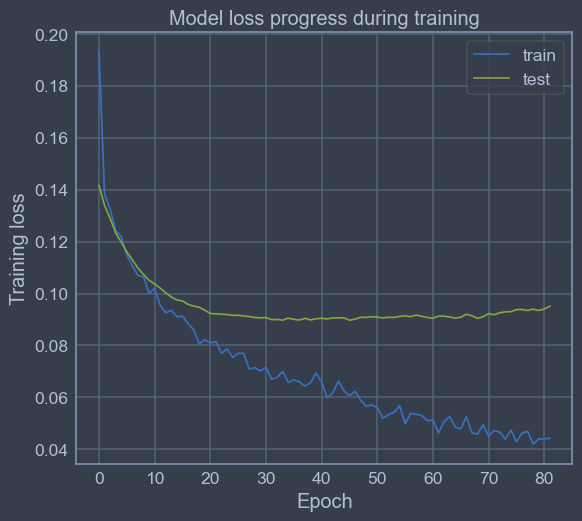

In [245]:
plt.plot(epoch_hist.history['loss'], label = 'train')
plt.plot(epoch_hist.history['val_loss'], label = 'test')
plt.title('Model loss progress during training')
plt.xlabel('Epoch')
plt.ylabel('Training loss')
plt.legend(['train', 'test'])

## Accuracy plot

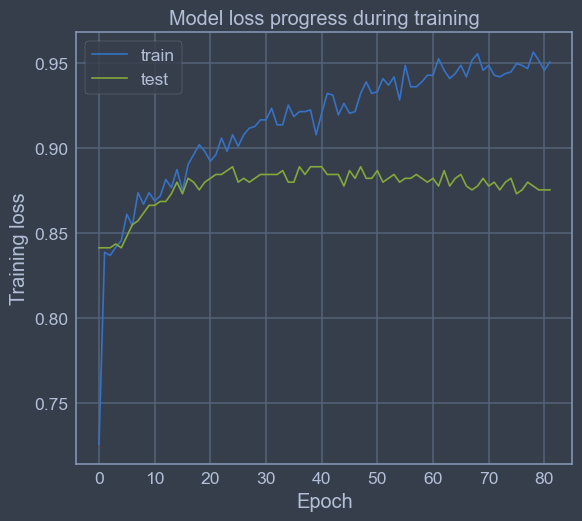

In [246]:
plt.plot(epoch_hist.history['accuracy'], label = 'train')
plt.plot(epoch_hist.history['val_accuracy'], label = 'test')
plt.title('Model loss progress during training')
plt.xlabel('Epoch')
plt.ylabel('Training loss')
plt.legend(['train', 'test'])

## Making predictions

In [247]:
y_pred_train = model.predict(X_train_preproccesed_selected)
y_pred_test = model.predict(X_test_preproccesed_selected)

14/14 [==============================] - 0s 1000us/step


In [248]:
scaler_y = StandardScaler()
scaler_y.fit(pd.DataFrame(y_train))

y_pred_train_t = scaler_y.inverse_transform(y_pred_train)
y_pred_test_t = scaler_y.inverse_transform(y_pred_test)


y_pred_train_t = (y_pred_train_t > 0.5)
y_pred_train_t = y_pred_train_t.astype(int)

y_pred_test_t = (y_pred_test_t > 0.5)
y_pred_test_t = y_pred_test_t.astype(int)


In [249]:
y_pred_train_t

array([[0],
       [0],
       [0],
       ...,
       [0],
       [0],
       [0]])

In [250]:
y_pred_test_t

array([[0],
       [0],
       [0],
       [0],
       [1],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [1],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
    

## Confusion matrix

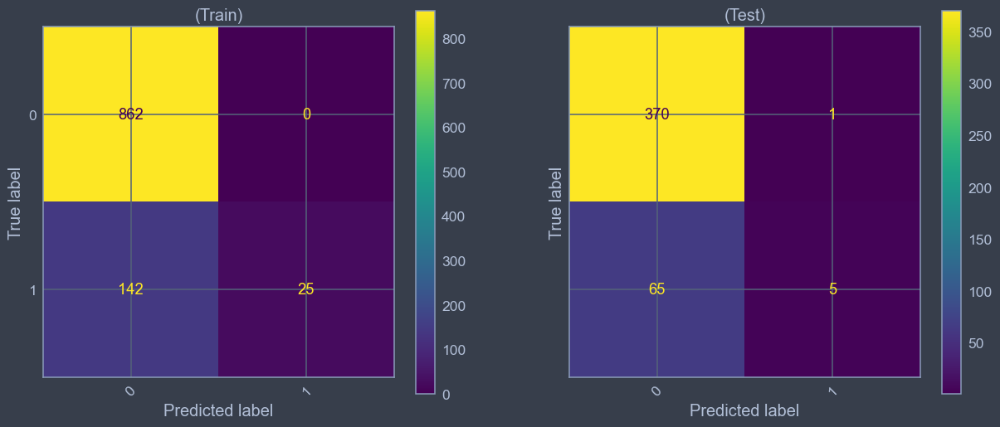

In [251]:
f, axes = plt.subplots(1, 2, figsize=(15, 6), sharey='row')
for i in range(2):
    if i == 0:
        cf_matrix = confusion_matrix(y_train, y_pred_train_t)
        title = '(Train)'
    elif i == 1:
        cf_matrix = confusion_matrix(y_test, y_pred_test_t)
        title = '(Test)'
    disp = ConfusionMatrixDisplay(cf_matrix)
    disp.plot(ax = axes[i], xticks_rotation=45)
    disp.ax_.set_title(title)

## Classification report

In [254]:
print('Train')
print()
print(classification_report(y_train, y_pred_train_t))
print()
print('Test')
print()
print(classification_report(y_test, y_pred_test_t))


Train

              precision    recall  f1-score   support

           0       0.86      1.00      0.92       862
           1       1.00      0.15      0.26       167

    accuracy                           0.86      1029
   macro avg       0.93      0.57      0.59      1029
weighted avg       0.88      0.86      0.82      1029


Test

              precision    recall  f1-score   support

           0       0.85      1.00      0.92       371
           1       0.83      0.07      0.13        70

    accuracy                           0.85       441
   macro avg       0.84      0.53      0.52       441
weighted avg       0.85      0.85      0.79       441



# STEP 11: Conclusion

##  Data Analysis

    After completing the data analysis step, we found several insights. 

        1. The older the employee the more working years he has.

        2. Years spent at a company and total working years are highly correlated which means that people tend to work a lot in one place.

        3. The higher the total working years, the higher the job level and vice versa.

        4. The higher the total working years, the higher the monthly income.

        5. It seems that employee spend most of their working years at company in one role.

        6. It seems that the amount of years working in one role is highly correlated with the current manager.

        7. It seems that the job level and the monthly income has a correlation with years at the company.

        8. The years spend with current manager highly correlated with total years at company.

        9. Monthly income is highly correlated with job level.

        10. Women in Human Resources experienced the highest amount of turnover, with nearly 1 out of every 3 women in HR leaving the company. For men, the highest turnover occurred in the Sales department.

        11. Among employees who left, the majority were satisfied in their job with 53% rating their job satisfaction as Good or Excellent, while 28% were least satisfied in their job.

        12. Across each department, women on average have higher salaries than men.

        13. In comparison to current employees, former employees had lower median salaries across all three departments. In Human Resources, women tend to have higher median salaries than men.

        14. Women with the lowest-rated work-life balance have the highest median salary out of all of the groups at $5,400/month.

        
        
## Training & Evaluating ML models
   
     > We have tested 5 popular models with the same data and same preprocessing steps to then compare them and choose only fixed amounts to tune the hyperparameters. 

     > After testing 5 models, we chose only 2 best models according to the accuracy metrics 

     > Then, we used cross-validation and started to fine-tune hyperparameters to boost the performance 

     > lastly, We have evaluated the models we built using several metrics including: 

         1. F1 score

         2. Roc-auc 

         3. Confusion Matrix 

         4. Precision

         5. Recall 

         6. Accuracy
        

    By analyzing all metrics we can tell that: 

        1. The results for accuracy, roc-auc and precision seems to be high enough. However, the resutls for recall and f1 are terrible having less than 50% which is not acceptible. It seems that is because of the extremely not-balanced datasets

        2. If we had to choose one, I would choose SVC because although it does not give the highest results, it gives the most stable and consistent results.

                
   ## Training & Evaluating ANN

        1. The loss has dropped to its minimum at 0.04 in the train set and 0.09 in the test set. The training process was stable

        2. The accuracy has reached it's maximum at about 95% in train and 87% in test set. The training process was stable

        3. It seems that ANN is not the best choice here, because in spite of the fact that the metrics including accuracy and ROC-AUC are better compared to the ML models, precision, recall and F1 are considerably lower than the ML models. 

        
        We tend to think that it would be better to gain more data and may be try to use different approaches to process the time series data and may be use something else for feature selection.

                

   # THANKS!!! :)